<a href="https://colab.research.google.com/github/Riky2014/Tesi/blob/main/1d_hemo_solver_inverse.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture
!apt-get install software-properties-common
!add-apt-repository -y ppa:fenics-packages/fenics
!apt-get update -qq
!apt install fenics

In [2]:
from fenics import *
import numpy as np
import matplotlib.pyplot as plt
import logging

# Set the logging level to suppress FFC messages
logging.getLogger('UFL_LEGACY').setLevel(logging.WARNING)
logging.getLogger('FFC').setLevel(logging.ERROR)

# Data, Mesh and Function spaces

In [48]:
# Data
T = 1
x_left = 0
x_right = 1
alpha = 1

A_tilde = 4e-4
a_tilde = 4e-5
q_tilde = 0.0
K_tilde = 50e3

k_r = 2.416e-4
rho = 1.05

T = 1
L = 1

# Discretization parameter
dt = 1e-5
h = 1 / 256
num_steps = T / dt
N = int((x_right - x_left) / h)

#  Create a mesh on the interval [0, 1].
mesh = IntervalMesh(N, x_left, x_right)
x = MeshCoordinates(mesh)

# Define the function space
P1 = FiniteElement('P', mesh.ufl_cell(), 1)
element = MixedElement([P1, P1])
V = FunctionSpace(mesh, element)

# Derivative function space
D1 = FiniteElement('DG', mesh.ufl_cell(), 0)
element_der = MixedElement([D1, D1])
V_der = FunctionSpace(mesh, element_der)

# Define the function space for exact solution
P2 = FiniteElement('P', mesh.ufl_cell(), 2)
element_exact = MixedElement([P2, P2])
V_ex = FunctionSpace(mesh, element_exact)

# Exact solution and forcing term

In [49]:
# Exact solution and forcing term

A_exact = Expression('A_tilde - a_tilde * sin(2 * pi / L * x[0]) * cos(2 * pi / T * t)', A_tilde = A_tilde, a_tilde = a_tilde, L = L, T = T, degree = 2, t = 0)

q_exact = Expression('q_tilde - (a_tilde * L / T) * cos(2 * pi / L * x[0]) * sin(2 * pi / T * t)', q_tilde = q_tilde, a_tilde = a_tilde, L = L, T = T, degree = 2, t = 0)

dU_dt = Expression(('2 * pi * a_tilde * sin(2 * pi * t) * sin(2 * pi * x[0])',

                    '- 2 * pi * a_tilde * L / T * cos(2 * pi * t) * cos(2 * pi * x[0])'),
                    a_tilde = a_tilde, L = L, T = T, degree = 1, t = 0)

S = Expression(('0.',

                '- k_r * (q_tilde - (a_tilde * L / T) * cos(2 * pi / L * x[0]) * sin(2 * pi / T * t)) / (A_tilde - a_tilde * sin(2 * pi / L * x[0]) * cos(2 * pi / T * t))'),
                A_tilde = A_tilde, a_tilde = a_tilde, q_tilde = q_tilde, L = L, T = T, k_r = k_r, degree = 1, t = 0)

dF_dx = Expression(('2 * pi * a_tilde * L / T * sin(2 * pi * t) * sin(2 * pi * x[0])',

                    '- pi * K_tilde * a_tilde / rho * pow(- 0.1 * sin(2 * pi * x[0]) * cos(2 * pi * t) + 1, 0.5) * cos(2 * pi * t) * cos(2 * pi * x[0]) \
                    + 2 * pi * pow(a_tilde, 3) * pow(L / (A_tilde * T), 2) * pow(sin(2 * pi * t), 2) * cos(2 * pi * t) * pow(cos(2 * pi * x[0]), 3) / pow(- 0.1 * sin(2 * pi * x[0]) * cos(2 * pi * t) + 1, 2) \
                    - 4 * pi * pow(a_tilde, 2) * pow(sin(2 * pi * t), 2) * sin(2 * pi * x[0]) * cos(2 * pi * x[0]) / (A_tilde - a_tilde * sin(2 * pi * x[0]) * cos(2 * pi * t))'),
                    a_tilde = a_tilde, A_tilde = A_tilde, K_tilde = K_tilde, L = L, T = T, rho = rho, degree = 1, t = 0)

dU_dt_dt = Expression(('4 * pi * pi * a_tilde * sin(2 * pi * x[0]) * cos(2 * pi * t)',

                       '4 * pi * pi * a_tilde * sin(2 * pi * t) * cos(2 * pi * x[0])'),
                       a_tilde = a_tilde, L = L, T = T, degree = 1, t = 0)

dS_dt = Expression(('0.',

                    '+ 2 * pi * k_r * pow(a_tilde / A_tilde, 2) * pow(sin(2 * pi * t), 2) * sin(2 * pi * x[0]) * cos(2 * pi * x[0]) / (pow(- 0.1 * sin(2 * pi * x[0]) * cos(2 * pi * t) + 1, 2)) \
                    - 2 * pi * k_r * a_tilde * cos(2 * pi * t) * cos(2 * pi * x[0]) / (A_tilde - a_tilde * sin(2 * pi * x[0]) * cos(2 * pi * t))'),
                    A_tilde = A_tilde, a_tilde = a_tilde, q_tilde = q_tilde, L = L, T = T, k_r = k_r, degree = 1, t = 0)

dF_dx_dt = Expression(('4 * pi * pi * a_tilde * L / T * cos(2 * pi * t) * sin(2 * pi * x[0])',

                    '- 0.1 * pi * pi * K_tilde * a_tilde / rho * sin(2 * pi * t) * sin(2 * pi * x[0]) * cos(2 * pi * t) * cos(2 * pi * x[0]) / pow(- 0.1 * sin(2 * pi * x[0]) * cos(2 * pi * t) + 1, 0.5) \
                    + 2 * pi * pi * K_tilde * a_tilde / rho * pow(- 0.1 * sin(2 * pi * x[0]) * cos(2 * pi * t) + 1, 0.5) * sin(2 * pi * t) * cos(2 * pi * x[0]) \
                    + 8 * pi * pi * pow(a_tilde, 3) * pow(L / (A_tilde * T), 2) * pow(sin(2 * pi * t), 3) * pow(sin(2 * pi * x[0]), 2) * cos(2 * pi * x[0]) / pow(- 0.1 * sin(2 * pi * x[0]) * cos( 2 * pi * t) + 1, 2) \
                    - 4 * pi * pi * pow(a_tilde, 3) * pow(L / (A_tilde * T), 2) * pow(sin(2 * pi * t), 3) * pow(cos(2 * pi * x[0]), 3) / pow(- 0.1 * sin(2 * pi * x[0]) * cos( 2 * pi * t) + 1, 2) \
                    + 8 * pi * pi * pow(a_tilde, 3) * pow(L / (A_tilde * T), 2) * sin(2 * pi * t) * pow(cos(2 * pi * t), 2) * pow(cos(2 * pi * x[0]), 3) / pow(- 0.1 * sin(2 * pi * x[0]) * cos( 2 * pi * t) + 1, 2) \
                    - 0.8 * pi * pi * pow(a_tilde, 3) * pow(L / (A_tilde * T), 2) * pow(sin(2 * pi * t), 3) * sin(2 * pi * x[0]) * cos(2 * pi * t) * pow(cos(2 * pi * x[0]), 3) / pow(- 0.1 * sin(2 * pi * x[0]) * cos( 2 * pi * t) + 1, 3) \
                    - 16 * pi * pi * pow(a_tilde, 2) * sin(2 * pi * t) * sin(2 * pi * x[0]) * cos(2 * pi * t) * cos(2 * pi * x[0]) / (A_tilde - a_tilde * sin(2 * pi * x[0]) * cos(2 * pi * t))'),
                    a_tilde = a_tilde, A_tilde = A_tilde, K_tilde = K_tilde, L = L, T = T, rho = rho, degree = 1, t = 0)

f = dU_dt + S + dF_dx
f_n = project(f, V)

df_dt = dU_dt_dt + dS_dt + dF_dx_dt
df_dt_n = project(df_dt, V)

# Functions

In [50]:
def H(A, q):
  return as_tensor([[0, 1], [1190476.19048 * A ** 0.5 - (q / A) ** 2, 2 * q / A]])

def F(A, q):
  return as_vector([q, 793650.79365 * A ** 1.5 - 6.34921 + q ** 2 / A])

def B(A, q):
  return as_vector([0, k_r * q / A])

def S(A, q):
  return as_vector([0, k_r * q / A])

def dS_dU(A, q):
  return as_tensor([[0, 0], [- k_r * q / A ** 2, k_r / A]])

In [51]:
def U(A, q):
  return np.array([A, q])

def H_vec(A, q):
  return np.array([[0, 1], [1190476.19048 * A ** 0.5 - (q / A) ** 2, 2 * q / A]])

def B_vec(A, q):
  return np.array([0, k_r * q / A])

def S_vec(A, q):
  return np.array([0, k_r * q / A])

def c_alpha(A, q, alpha = 1):
  return (1190476.19048 * A ** 0.5 + (q / A) ** 2 * alpha * (alpha - 1)) ** 0.5

def l1(A, q, alpha = 1):
  return np.array([c_alpha(A, q, alpha) - alpha * q / A, 1.])

def l2(A, q, alpha = 1):
  return np.array([- c_alpha(A, q, alpha) - alpha * q / A, 1.])

def CC(A, q, u_der, x):
  du_dz = project(u_der, V_der)(x)
  return U(A, q) - dt * H_vec(A, q) @ du_dz - dt * B_vec(A, q) + dt * f([x, x, x])

In [52]:
def outlet_bc(A, q, u_der, x):

  q_outlet = (np.dot(l1(A(x), q(x)), CC(A(x), q(x), u_der, x)) - l1(A(x), q(x))[0] * U(A(x), q(x))[0] ) / l1(A(x), q(x))[1]

  return q_outlet

def inlet_bc(A, q, u_der, x):
  matrix = np.array([[-1, 1], [c_alpha(A(x), q(x), alpha) - alpha * q(x) / A(x), c_alpha(A(x), q(x), alpha) + alpha * q(x) / A(x)]])
  array = np.array([np.dot(l2(A(x), q(x)), CC(A(x), q(x), u_der, x)), np.dot(l1(A(x), q(x)), U(A(x), q(x)) - dt * S_vec(A(x), q(x)))])

  A_in, q_in = matrix @ array / (2 * c_alpha(A(x), q(x)))

  return A_in, q_in

In [53]:
def update_time_step(t, dt):
  t += dt
  q_exact.t = t
  A_exact.t = t
  dU_dt.t = t
  S.t = t
  dF_dx.t = t
  dU_dt_dt.t = t
  dS_dt.t = t
  dF_dx_dt.t = t

  return t

In [54]:
def plot_solution():
  fig, ax = plt.subplots(2, 2, figsize=(12, 12))
  ax = ax.flatten()

  # Format t to print only the first 4 digits
  formatted_t = "{:.5f}".format(t)

  # Plot for Area
  ax[0].plot(Ah.compute_vertex_values(mesh), label='Approximation')
  ax[0].plot(A_ex.compute_vertex_values(mesh), label='Exact')
  ax[0].set_title(f'Area, t = {formatted_t}')
  ax[0].set_xlabel(f'N = {N}, h = {h},  dt = {dt}')
  ax[0].legend()

  ax[2].plot(np.abs(Ah.compute_vertex_values(mesh) - A_ex.compute_vertex_values(mesh)))
  ax[2].set_title(f'Error')
  ax[2].set_xlabel(f'N = {N}, h = {h},  dt = {dt}')

  # Plot for Flux
  ax[1].plot(qh.compute_vertex_values(mesh), label='Approximation')
  ax[1].plot(q_ex.compute_vertex_values(mesh), label='Exact')
  ax[1].set_title(f'Flux, t = {formatted_t}')
  ax[1].set_xlabel(f'N = {N}, h = {h},  dt = {dt}')
  ax[1].legend()

  ax[3].plot(np.abs(qh.compute_vertex_values(mesh) - q_ex.compute_vertex_values(mesh)))
  ax[3].set_title(f'Error')
  ax[3].set_xlabel(f'N = {N}, h = {h},  dt = {dt}')

  plt.show()

# Initial guess and boundary conditions

In [55]:
# Define initial guess
A0 = 4e-4
q0 = 0
uh_old = interpolate(Expression(('A_tilde - a_tilde * sin(2 * pi / L * x[0])', 'q0'), degree = 1, A_tilde = A_tilde, a_tilde = a_tilde, L = L, q0 = q0), V)
Ah_old, qh_old = uh_old.split()

In [56]:
# Boundary condition
inlet = 'near(x[0], 0)'
outlet = 'near(x[0], 1)'
A_outlet = A0
q_outlet = outlet_bc(Ah_old, qh_old, uh_old.dx(0), x_right)
A_inlet, q_inlet = inlet_bc(Ah_old, qh_old, uh_old.dx(0), x_left)
print(f'A inlet = {A_inlet}, q inlet = {q_inlet}')
print(f'A outlet = {A_outlet}, q outlet = {q_outlet}')

def update_bc(A_inlet, q_inlet, A_outlet, q_outlet):
  bc_A_inlet = DirichletBC(V.sub(0), A_inlet, inlet)
  bc_q_inlet = DirichletBC(V.sub(1), q_inlet, inlet)

  bc_A_outlet = DirichletBC(V.sub(0), A_outlet, outlet)
  bc_q_outlet = DirichletBC(V.sub(1), q_outlet, outlet)

  bc = [bc_A_inlet, bc_q_inlet, bc_A_outlet, bc_q_outlet]

  return bc

bc = update_bc(A_inlet, q_inlet, A_outlet, q_outlet)

A inlet = 0.000400000027611013, q inlet = -4.260471795882328e-09
A outlet = 0.0004, q outlet = -8.5209435896072e-09


# Definition of the variational problem

In [57]:
# Define trial functions and test functions
A, q = TrialFunctions(V)
v, z = TestFunctions(V)

# Define the variational problem
def LinearProblem(A_old, q_old):
  a = inner(A, v) * dx + inner(q, z) * dx

  L = (
        A_old * v * dx
      + q_old * z * dx
      + dt * ((F(A_old, q_old) - dt / 2 * dot(H(A_old, q_old), S(A_old, q_old))))[0] * v.dx(0) * dx
      + dt * ((F(A_old, q_old) - dt / 2 * dot(H(A_old, q_old), S(A_old, q_old))))[1] * z.dx(0) * dx
      + dt ** 2 / 2 * (dot(dS_dU(A_old, q_old), F(A_old, q_old).dx(0)))[0] * v * dx
      + dt ** 2 / 2 * (dot(dS_dU(A_old, q_old), F(A_old, q_old).dx(0)))[1] * z * dx
      - dt ** 2 / 2 * (dot(H(A_old, q_old), F(A_old, q_old).dx(0)))[0] * v.dx(0) * dx
      - dt ** 2 / 2 * (dot(H(A_old, q_old), F(A_old, q_old).dx(0)))[1] * z.dx(0) * dx
      - dt * (S(A_old, q_old) - dt / 2 * dot(dS_dU(A_old, q_old), S(A_old, q_old)))[0] * v * dx
      - dt * (S(A_old, q_old) - dt / 2 * dot(dS_dU(A_old, q_old), S(A_old, q_old)))[1] * z * dx
      + dt * f[0] * v * dx
      + dt * f[1] * z * dx
      + dt ** 2 / 2 * (dot(H(A_old, q_old), f_n))[0] * v.dx(0) * dx
      + dt ** 2 / 2 * (dot(H(A_old, q_old), f_n))[1] * z.dx(0) * dx
      + dt ** 2 / 2 * (- dot(dS_dU(A_old, q_old), f_n) + df_dt_n)[0] * v * dx
      + dt ** 2 / 2 * (- dot(dS_dU(A_old, q_old), f_n) + df_dt_n)[1] * z * dx
  )

  return a, L

# Solution

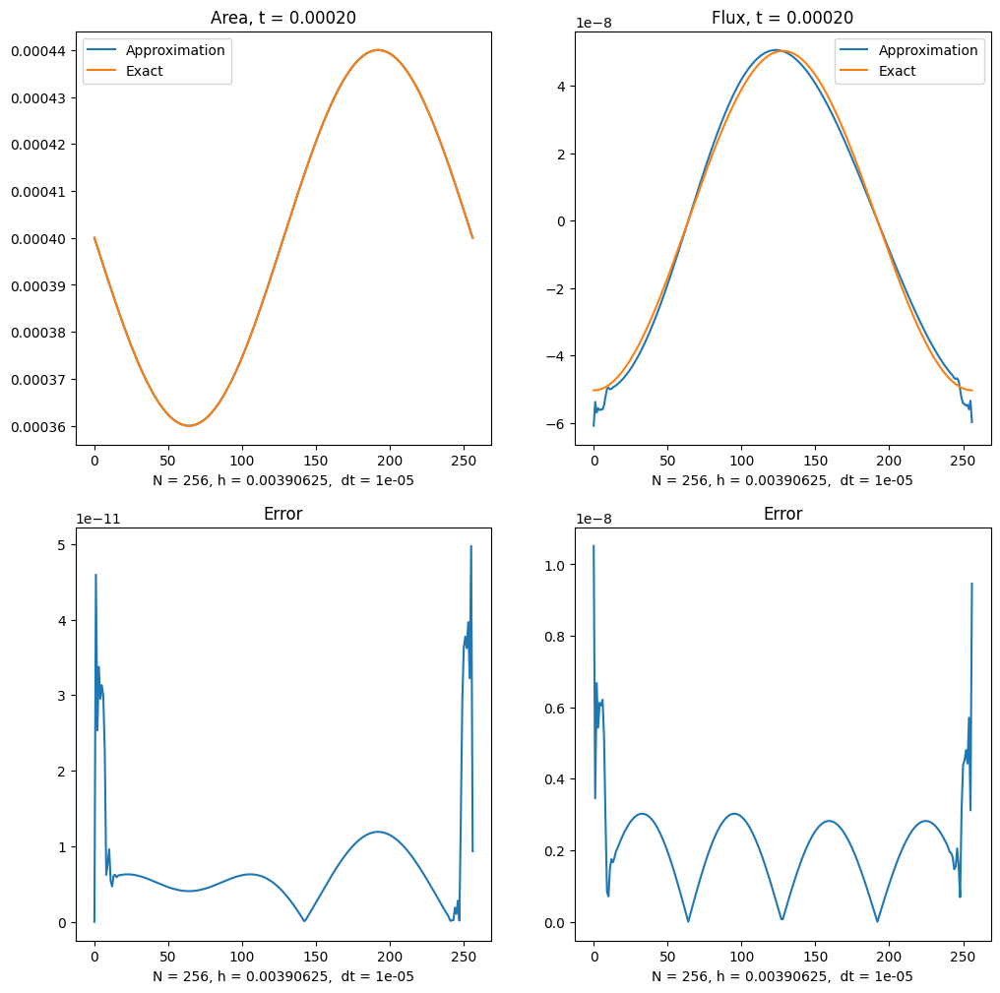

Interation 20 / 100000
t = 0.0002: error = [1.56042527e-09 2.42450772e-09]
Global error A = 1.5604252680604176e-09, Global error q = 2.4245077185169604e-09



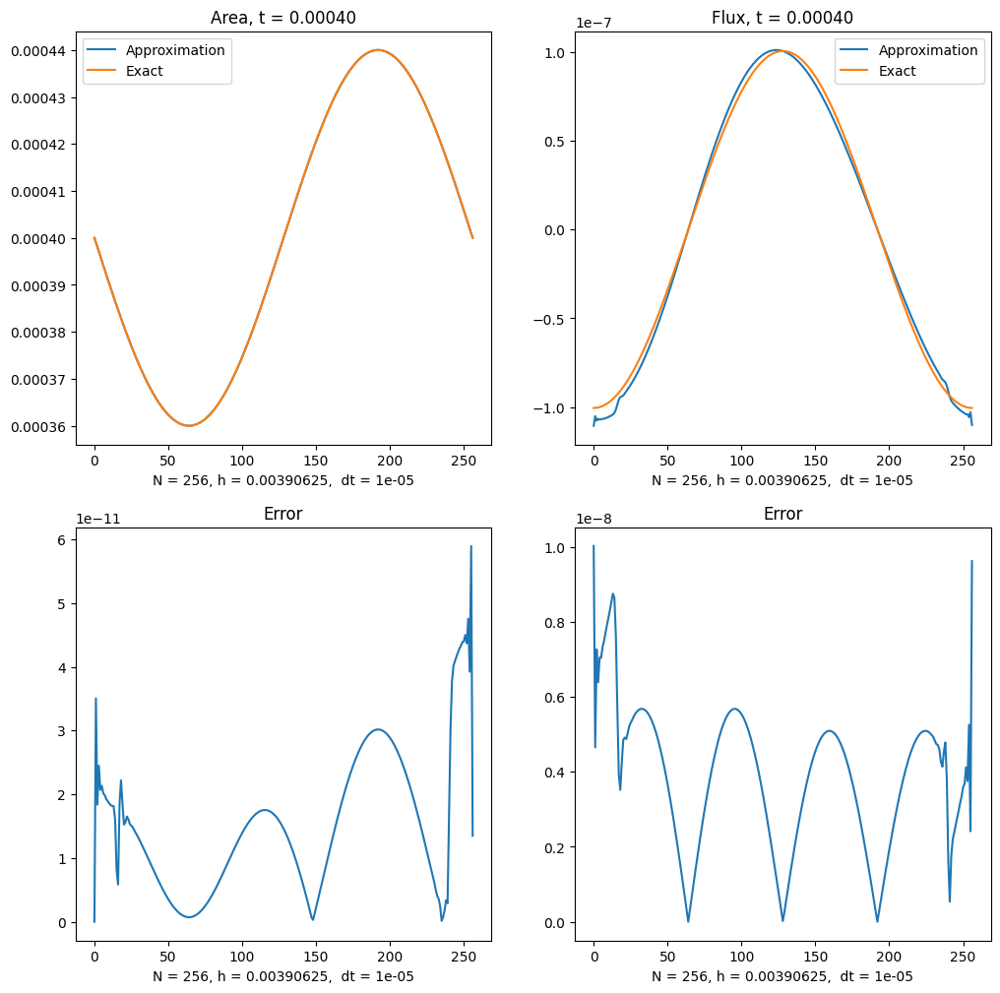

Interation 40 / 100000
t = 0.0004: error = [1.56491193e-09 4.21922350e-09]
Global error A = 1.5649119283579206e-09, Global error q = 4.219223498377035e-09



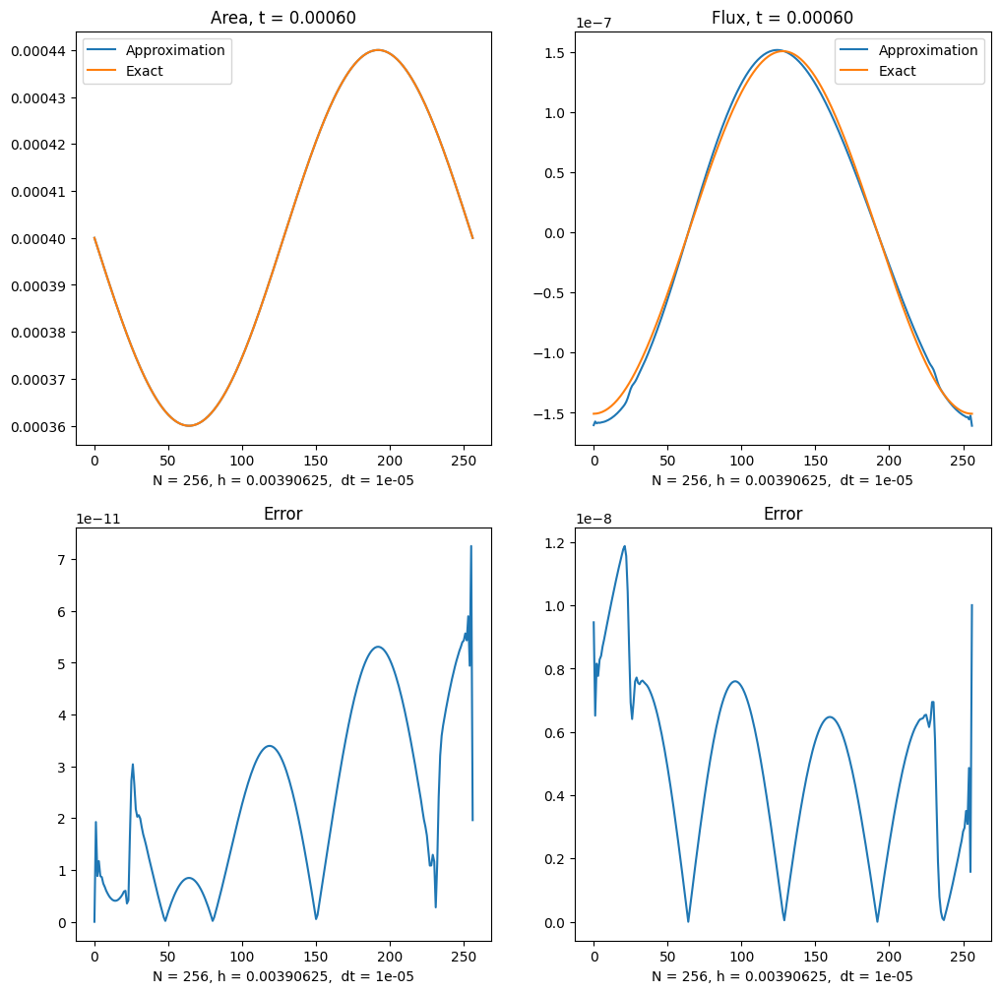

Interation 60 / 100000
t = 0.0006: error = [1.56875901e-09 5.52128352e-09]
Global error A = 1.56875900635319e-09, Global error q = 5.521283516512531e-09



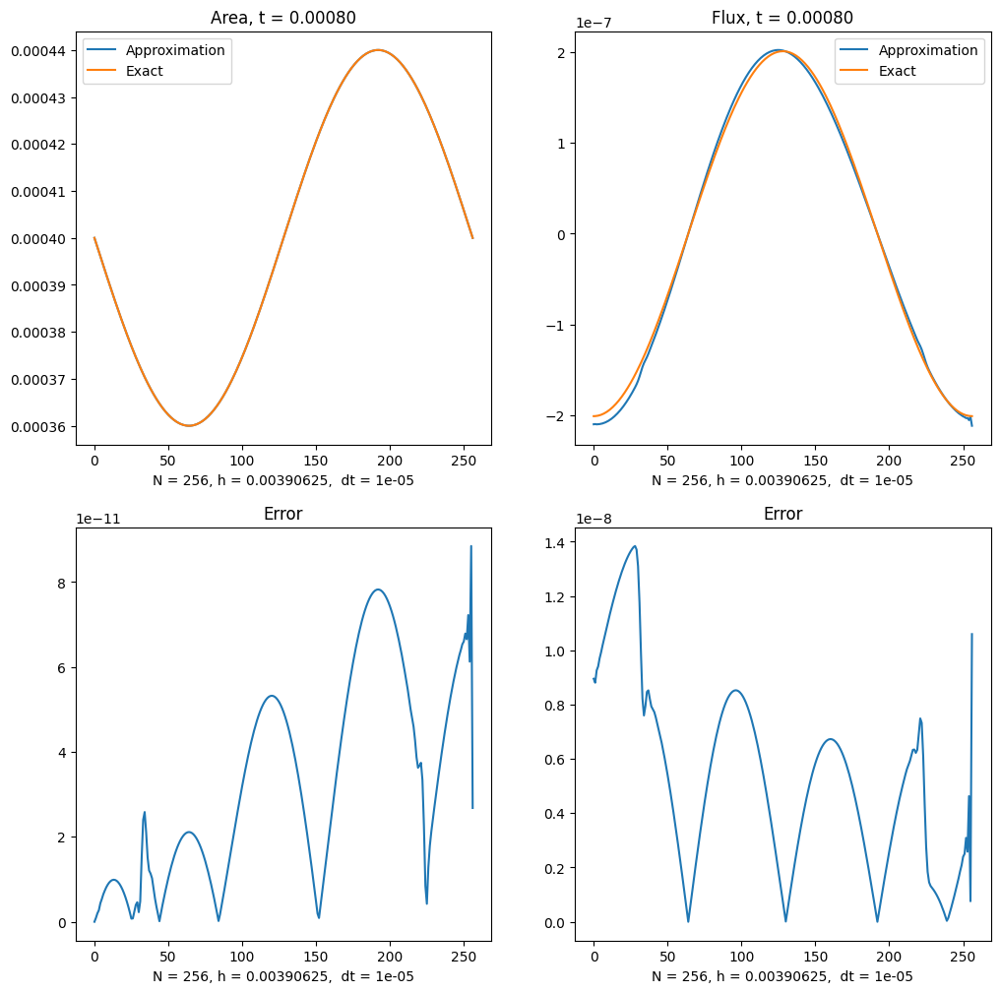

Interation 80 / 100000
t = 0.0008: error = [1.57192381e-09 6.22310966e-09]
Global error A = 1.5719238116102954e-09, Global error q = 6.22310965786677e-09



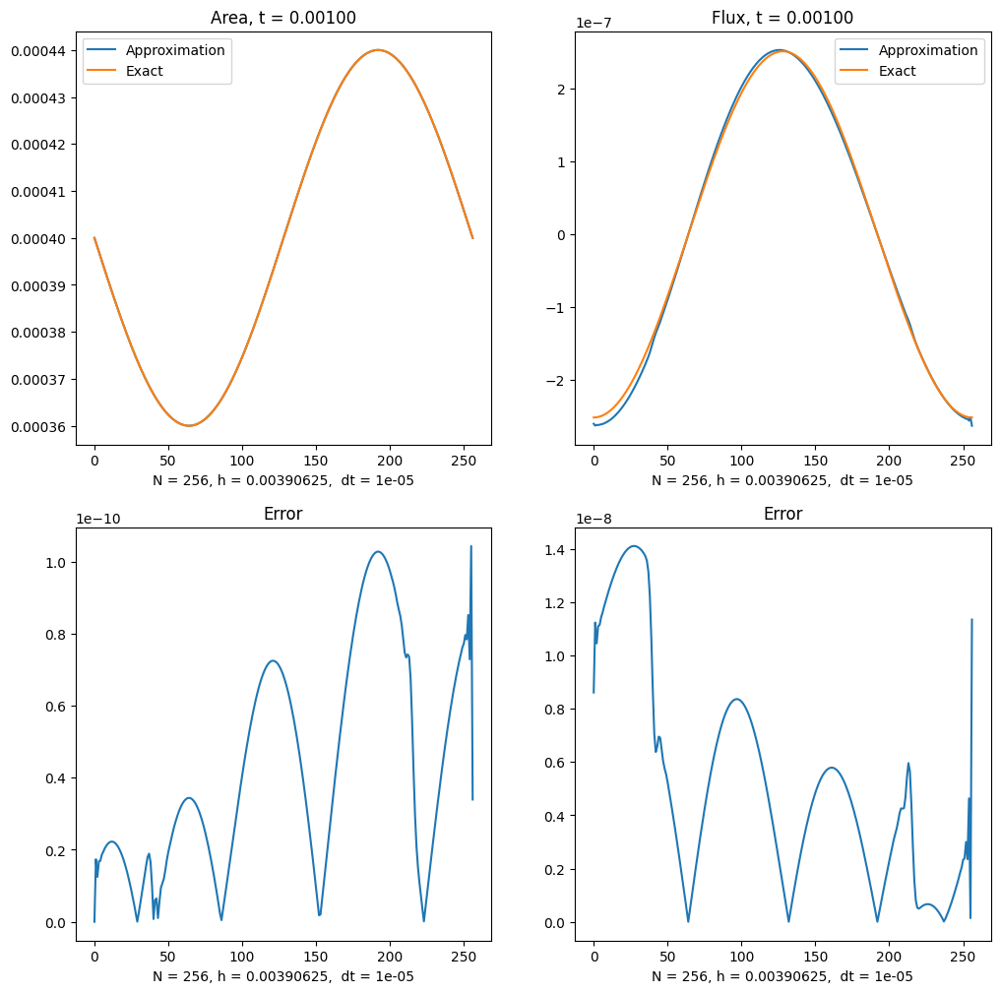

Interation 100 / 100000
t = 0.0010: error = [1.57434381e-09 6.34779603e-09]
Global error A = 1.5743438077111528e-09, Global error q = 6.363685677064202e-09



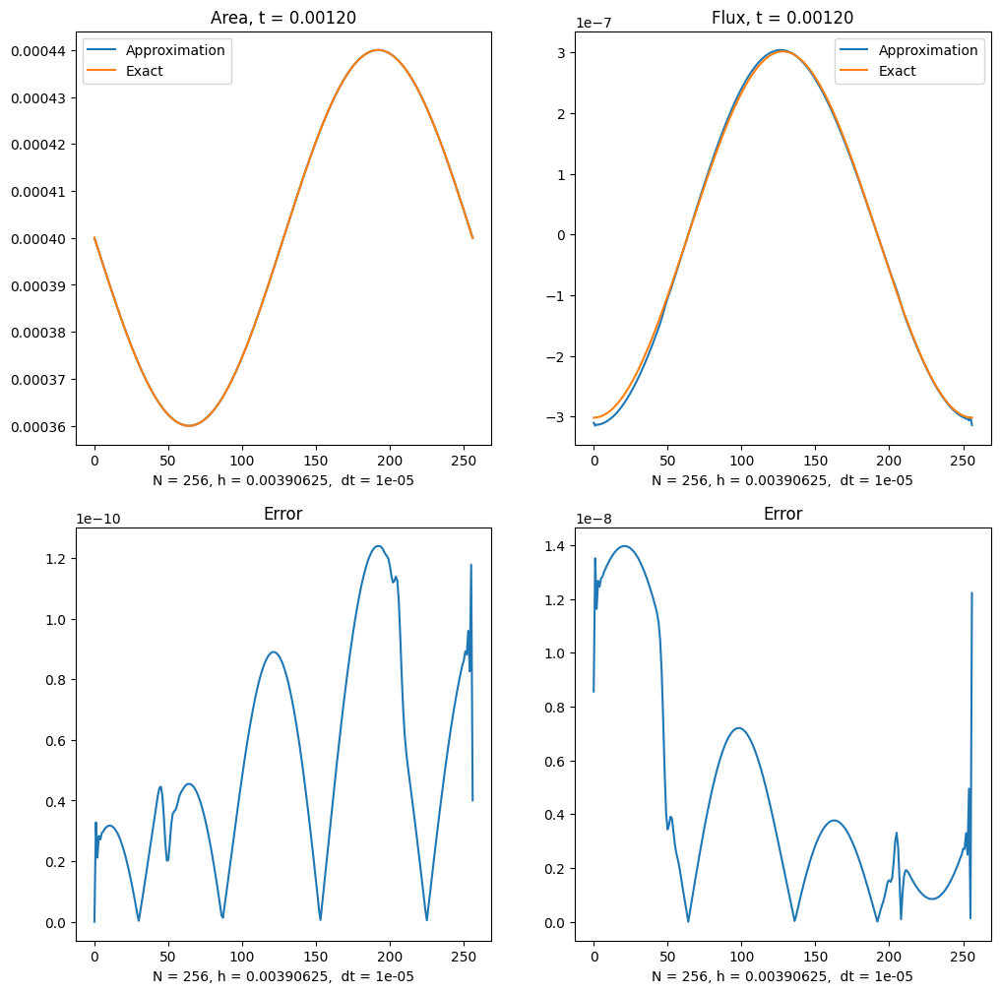

Interation 120 / 100000
t = 0.0012: error = [1.57593622e-09 6.07631506e-09]
Global error A = 1.5759362211599607e-09, Global error q = 6.363685677064202e-09



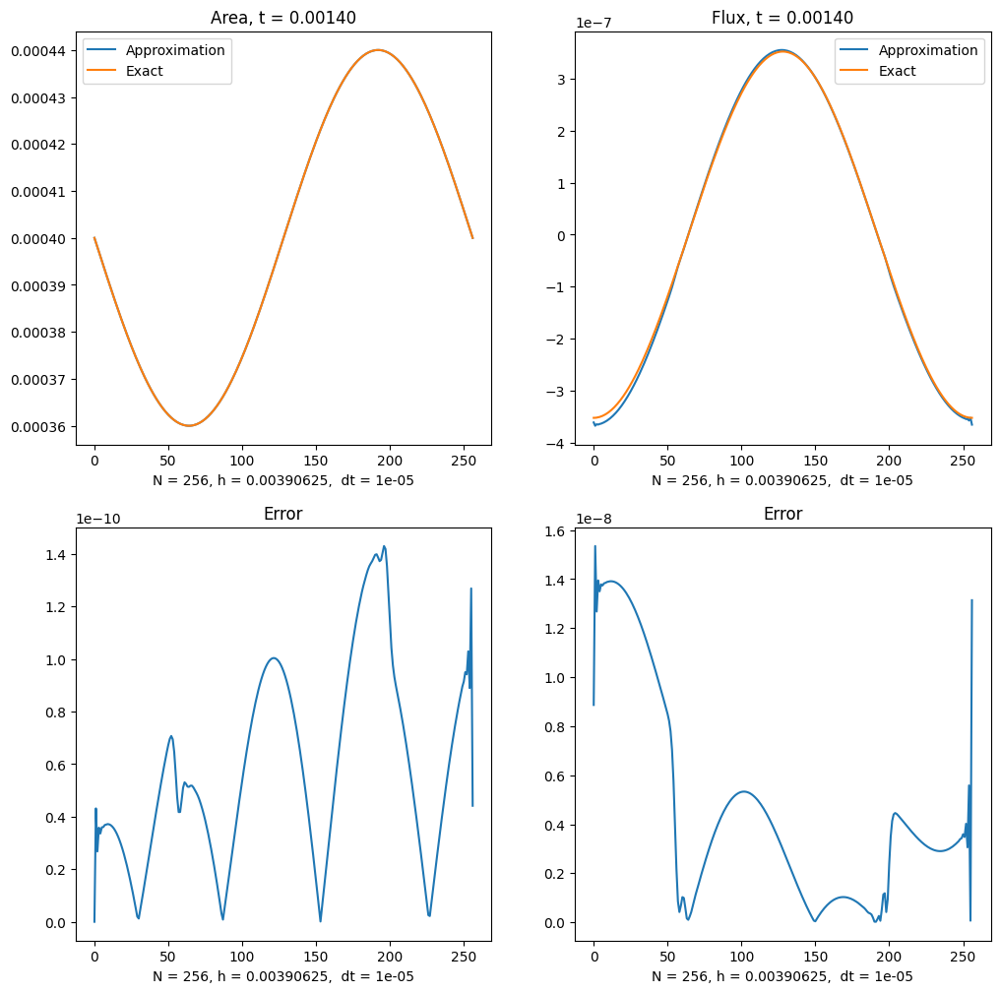

Interation 140 / 100000
t = 0.0014: error = [1.57662593e-09 5.74546983e-09]
Global error A = 1.5766259311819613e-09, Global error q = 6.363685677064202e-09



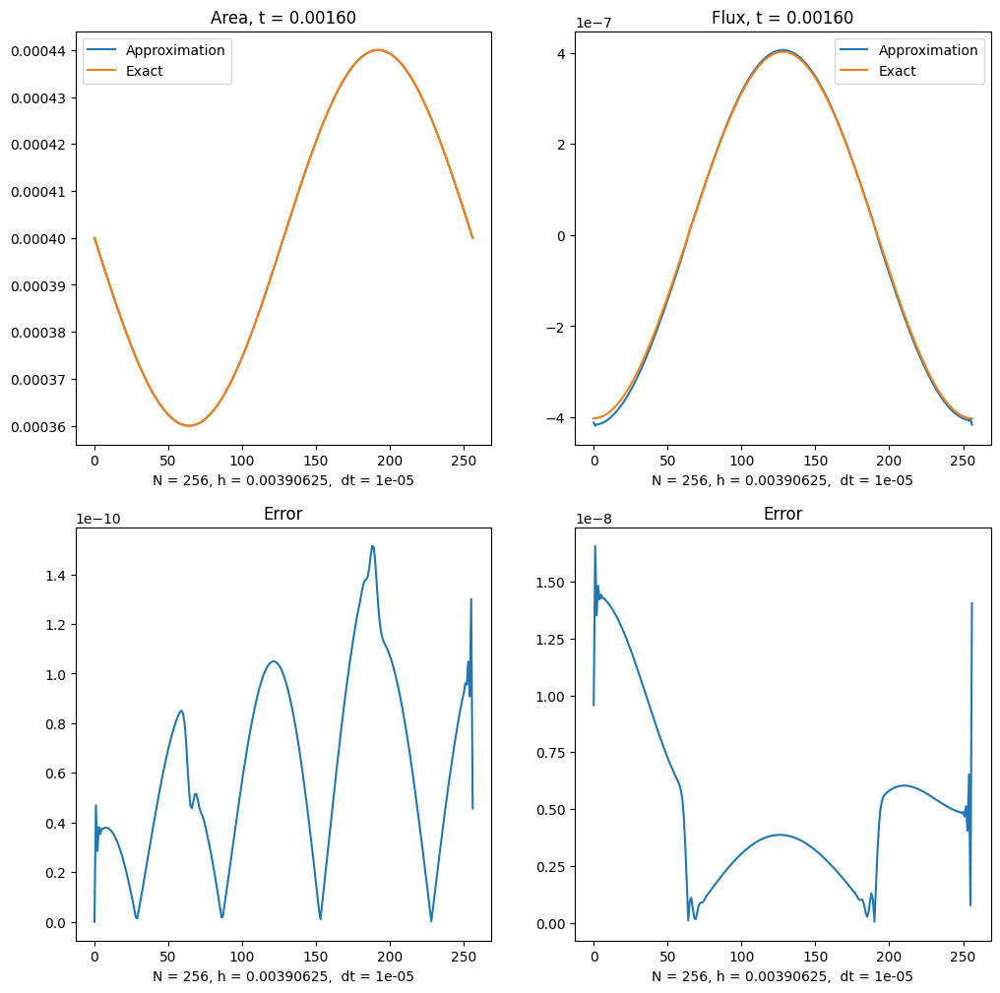

Interation 160 / 100000
t = 0.0016: error = [1.57638745e-09 5.73773898e-09]
Global error A = 1.5766526622818857e-09, Global error q = 6.363685677064202e-09



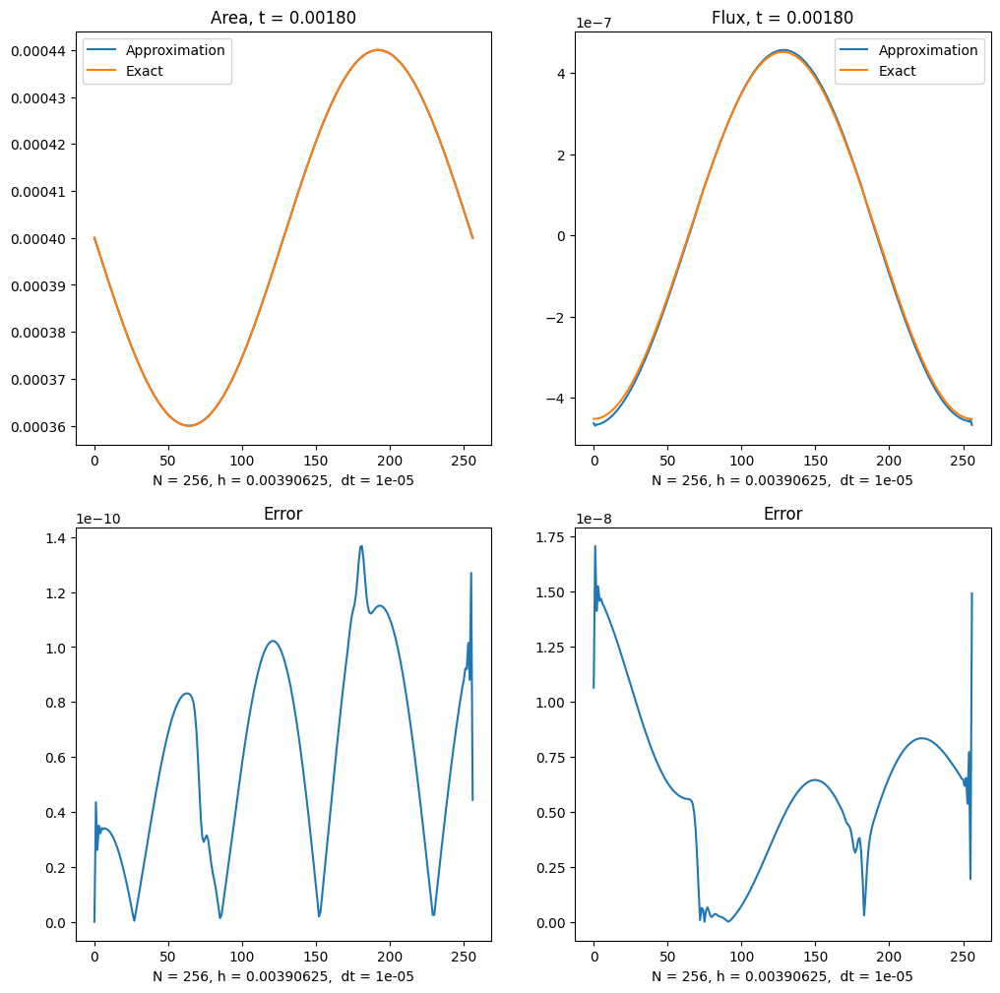

Interation 180 / 100000
t = 0.0018: error = [1.57527873e-09 6.20386960e-09]
Global error A = 1.5766526622818857e-09, Global error q = 6.363685677064202e-09



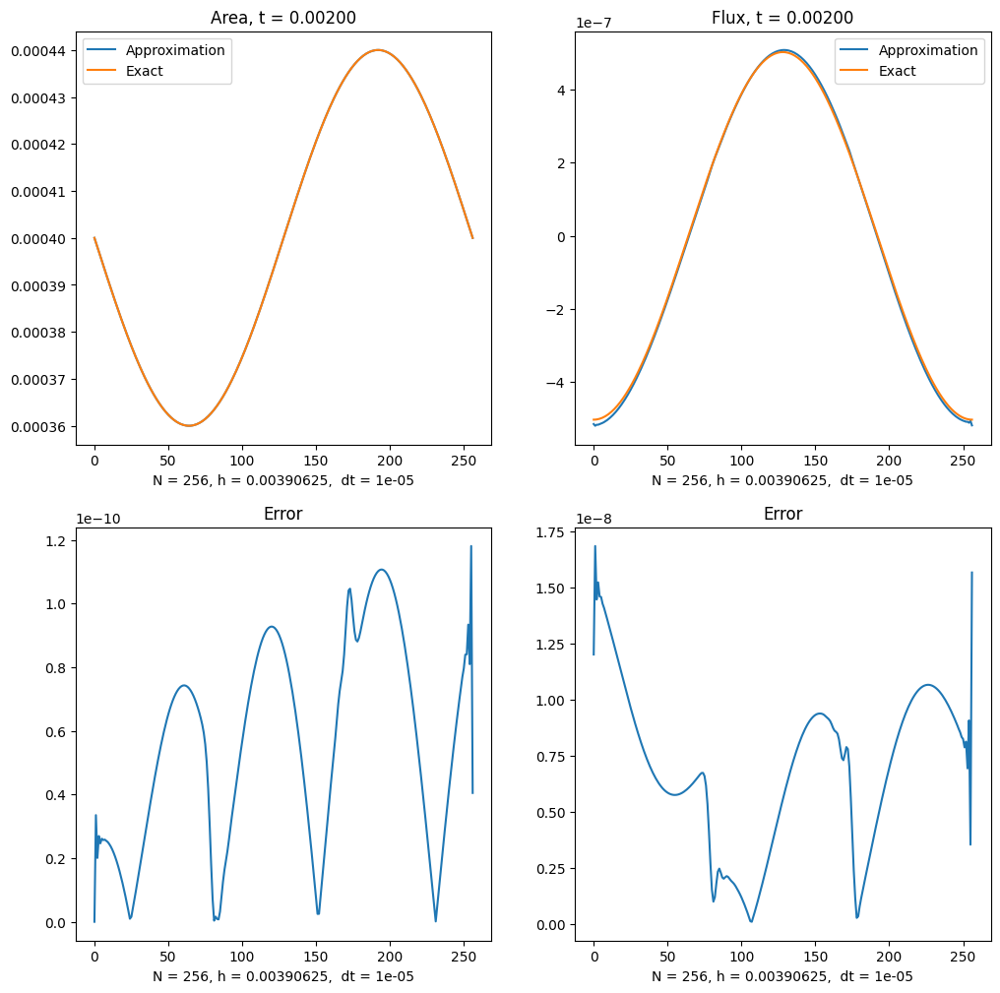

Interation 200 / 100000
t = 0.0020: error = [1.57344893e-09 6.93742594e-09]
Global error A = 1.5766526622818857e-09, Global error q = 6.937425943657189e-09



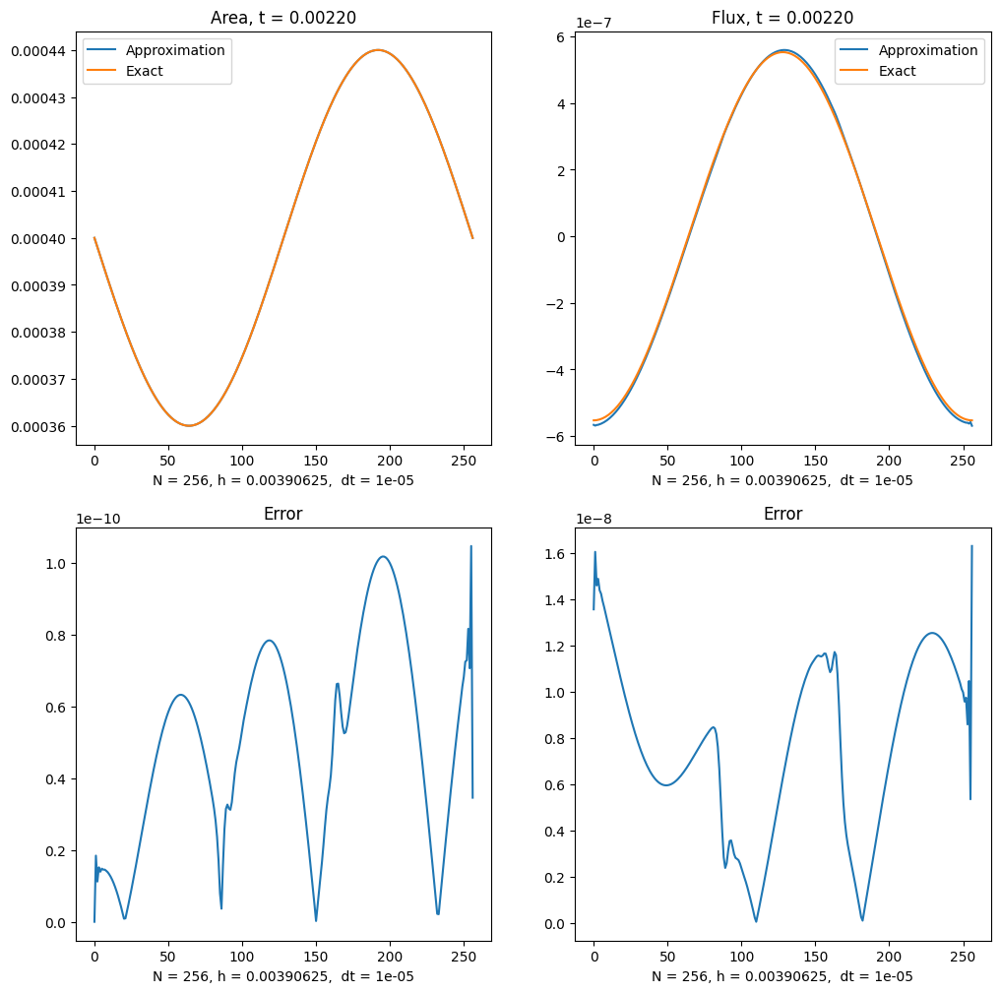

Interation 220 / 100000
t = 0.0022: error = [1.57111656e-09 7.61018032e-09]
Global error A = 1.5766526622818857e-09, Global error q = 7.610180316450895e-09



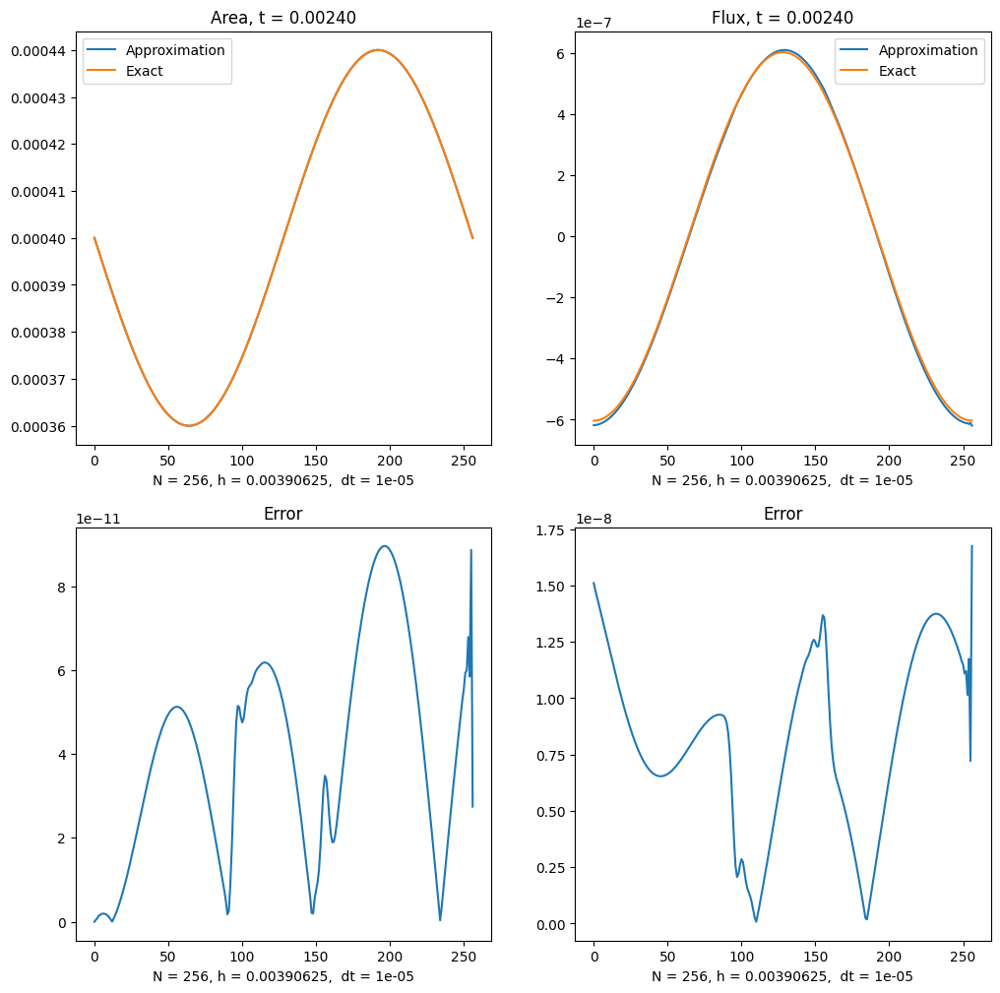

Interation 240 / 100000
t = 0.0024: error = [1.56852931e-09 7.98843503e-09]
Global error A = 1.5766526622818857e-09, Global error q = 7.988435033673363e-09



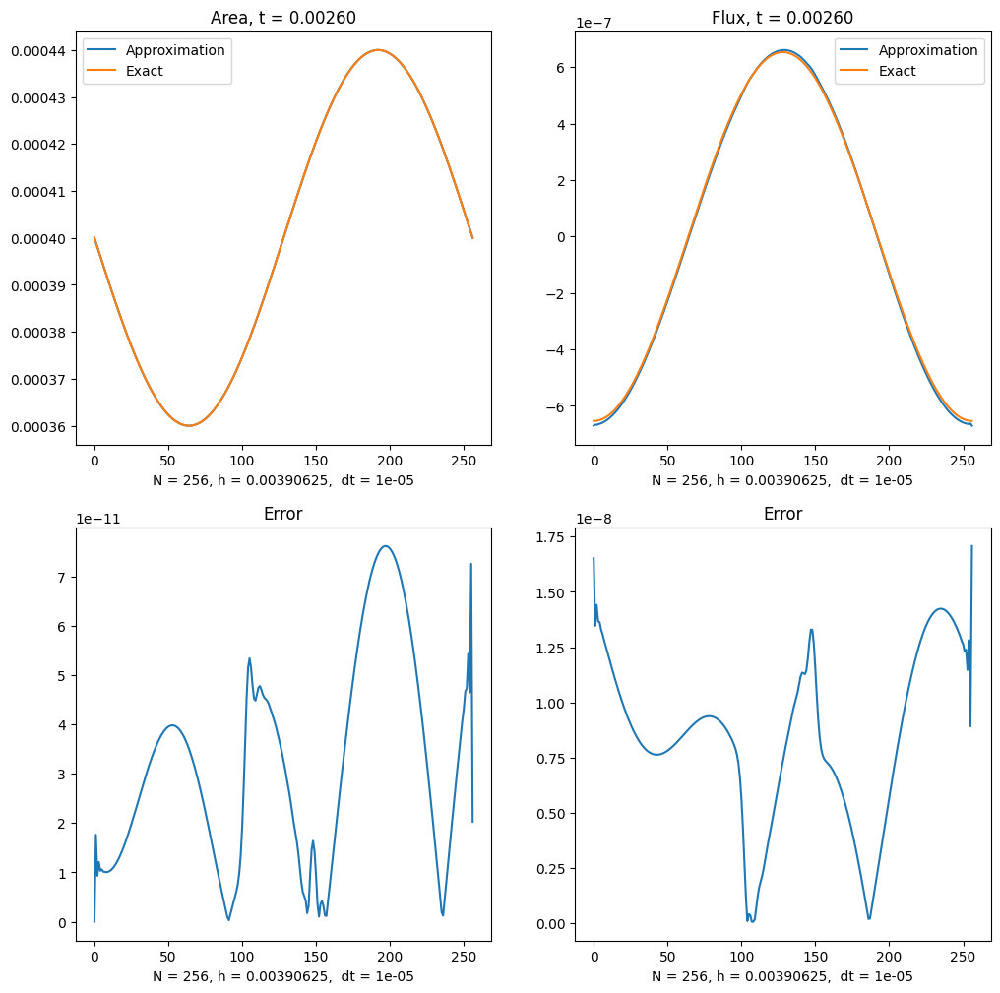

Interation 260 / 100000
t = 0.0026: error = [1.56592509e-09 7.98281737e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



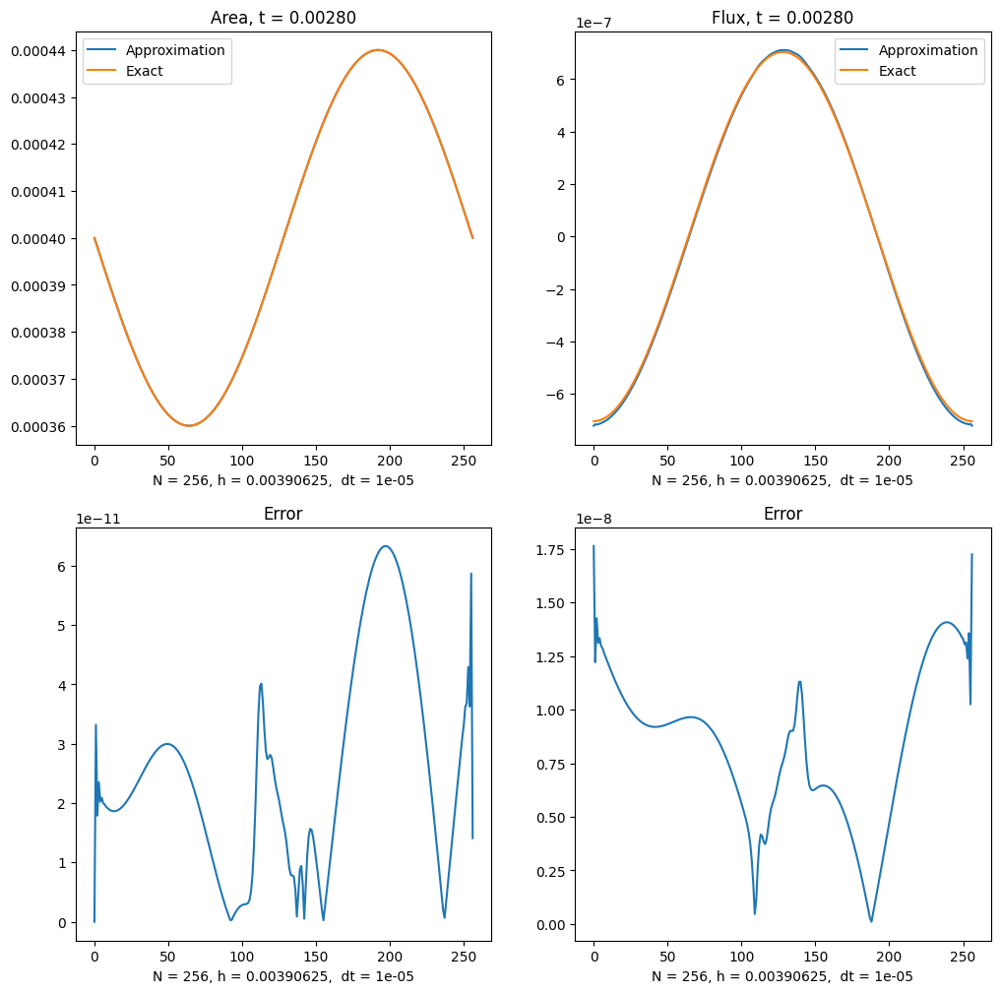

Interation 280 / 100000
t = 0.0028: error = [1.56350975e-09 7.63022507e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



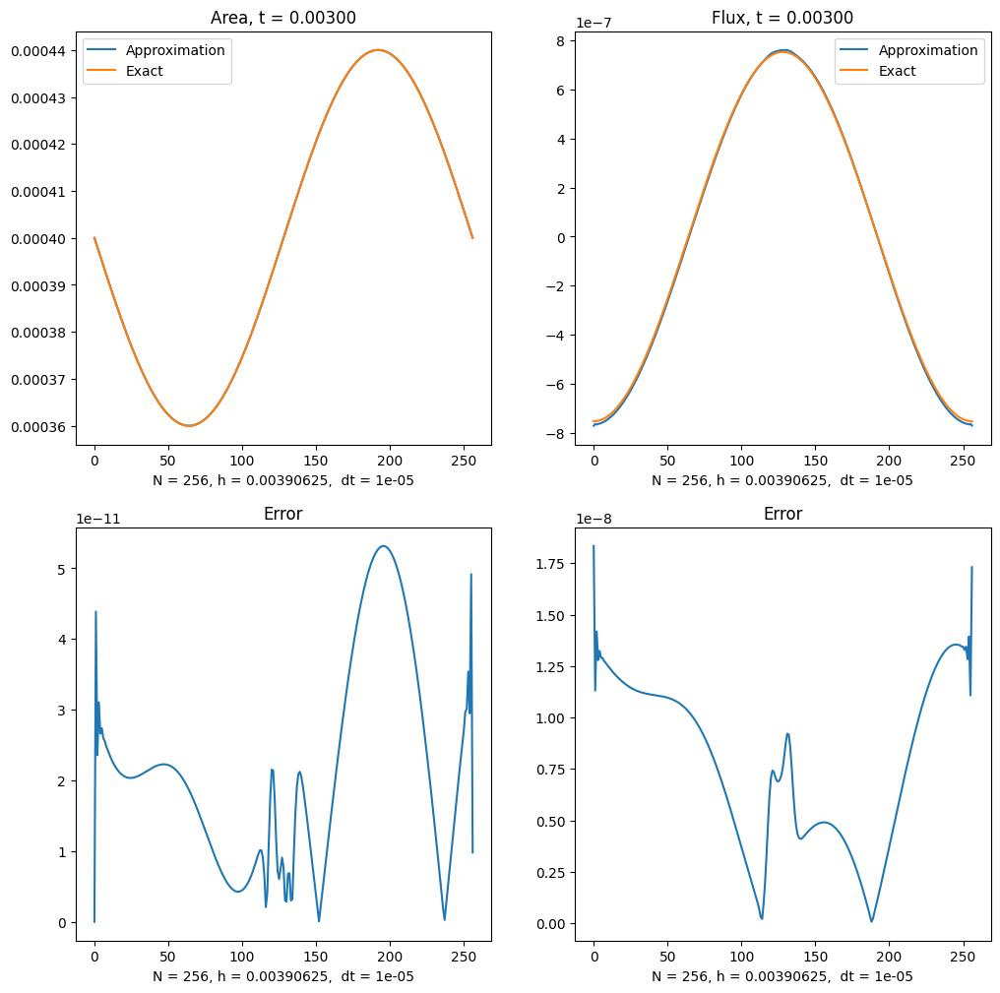

Interation 300 / 100000
t = 0.0030: error = [1.56145546e-09 7.05625299e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



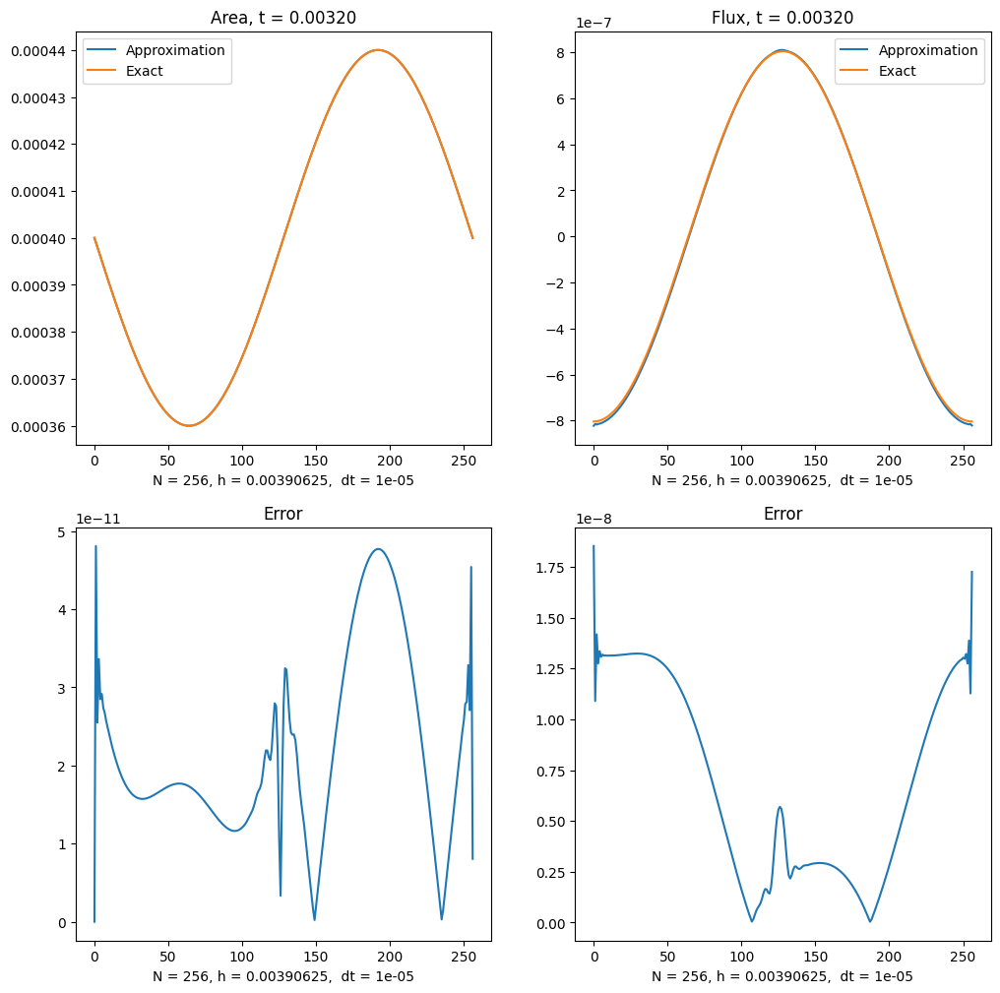

Interation 320 / 100000
t = 0.0032: error = [1.55991248e-09 6.41316274e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



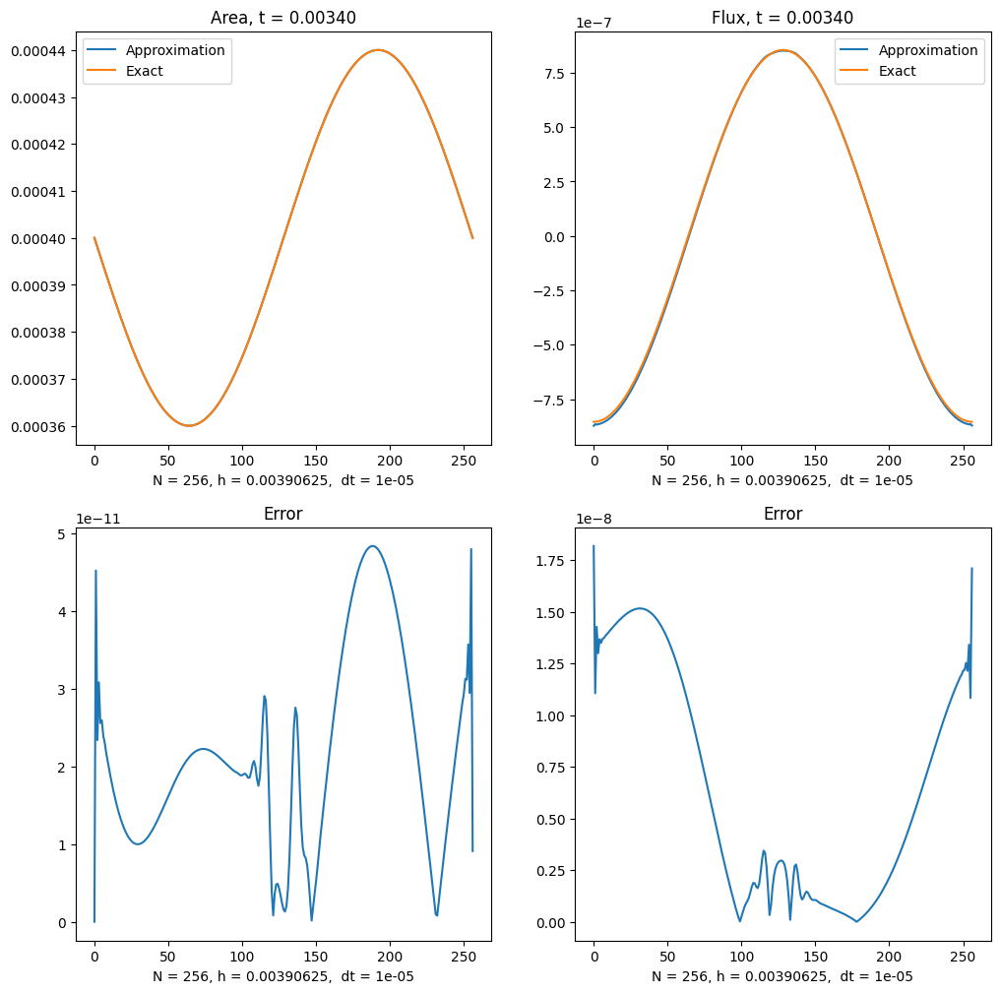

Interation 340 / 100000
t = 0.0034: error = [1.55897509e-09 6.07121703e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



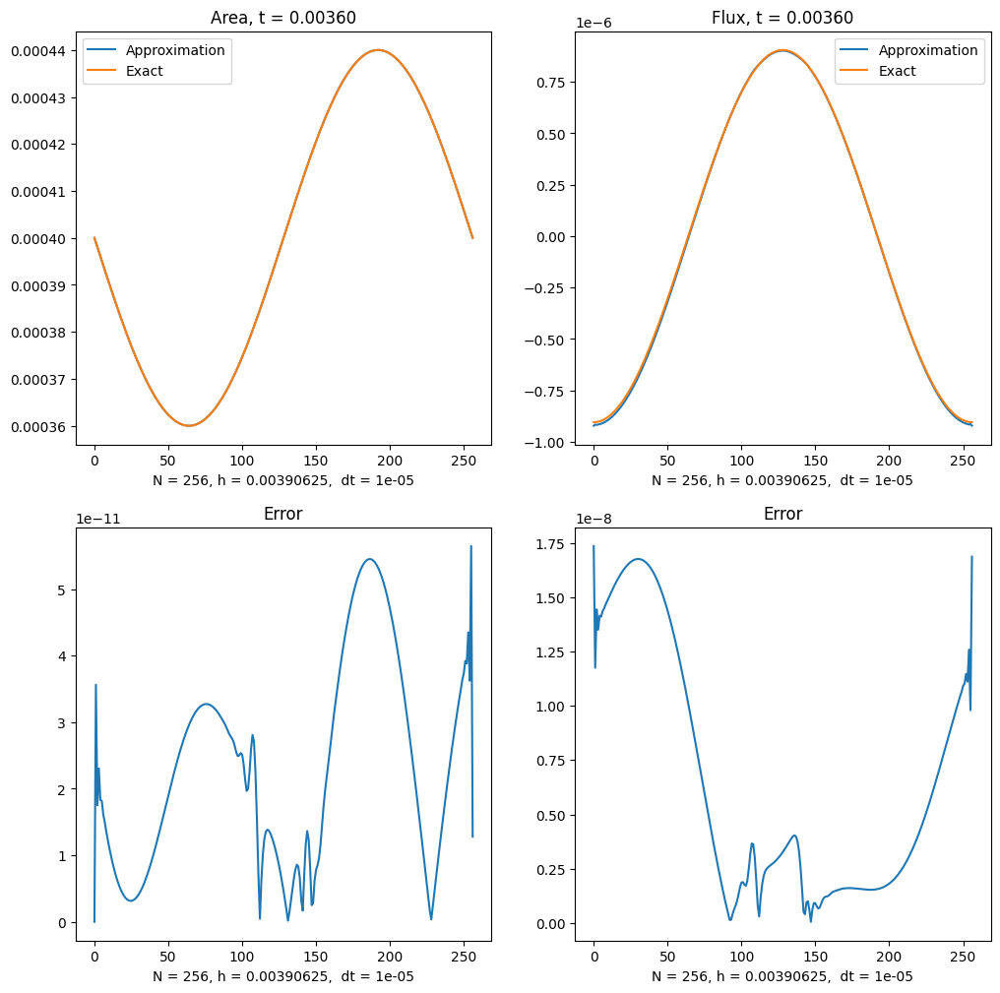

Interation 360 / 100000
t = 0.0036: error = [1.55878678e-09 5.91990616e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



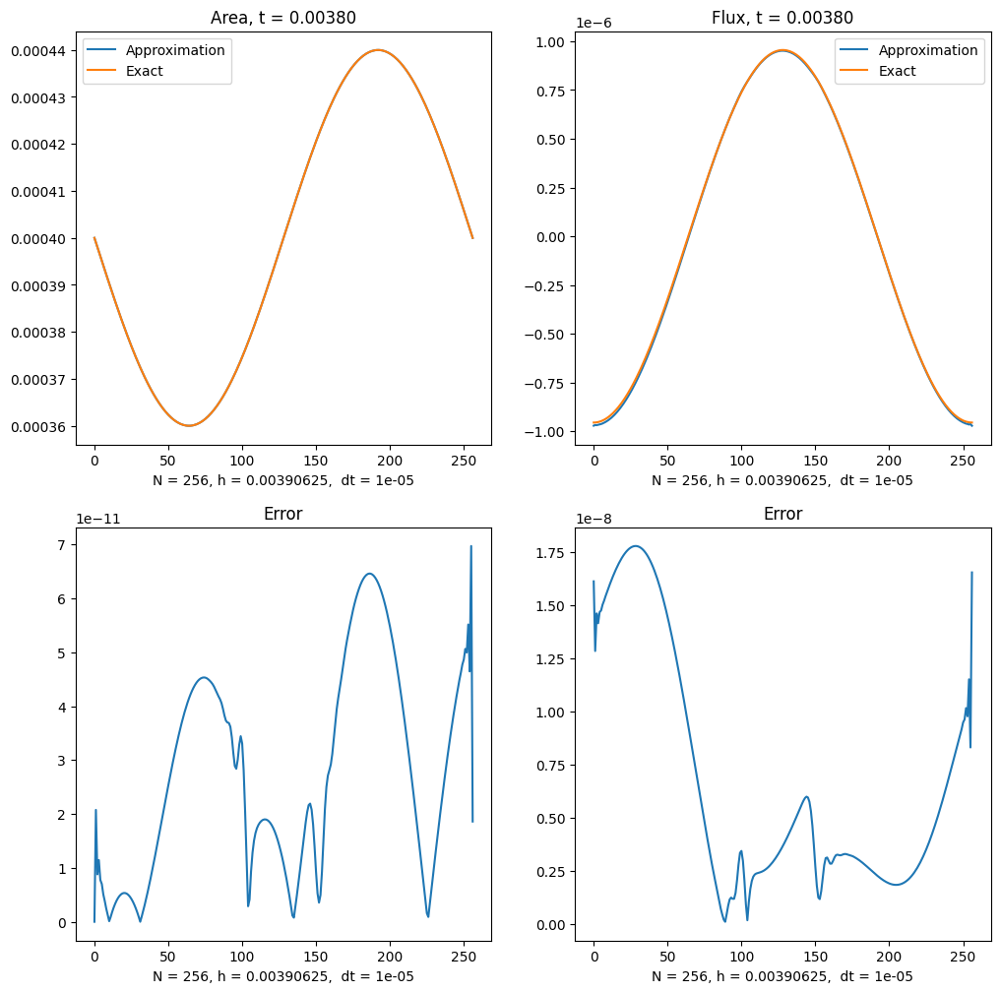

Interation 380 / 100000
t = 0.0038: error = [1.55944729e-09 5.79542645e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



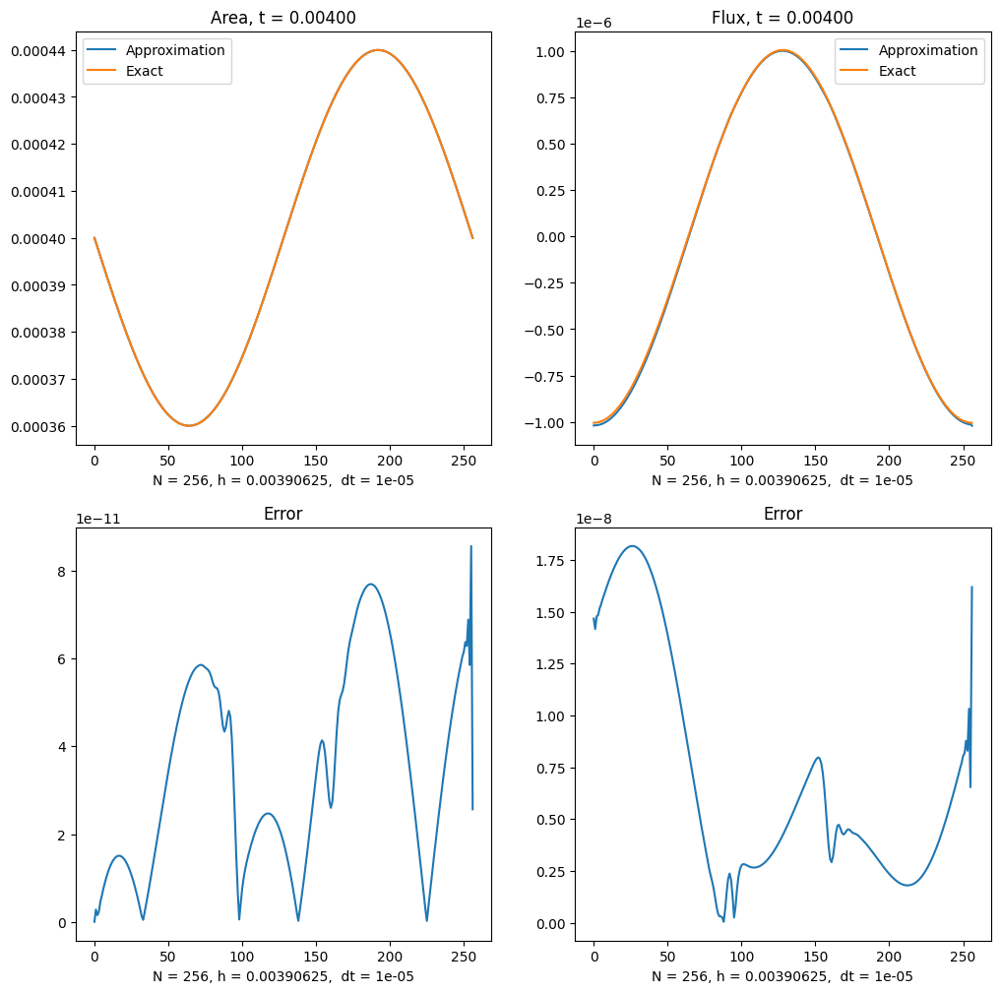

Interation 400 / 100000
t = 0.0040: error = [1.56100285e-09 5.55367320e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



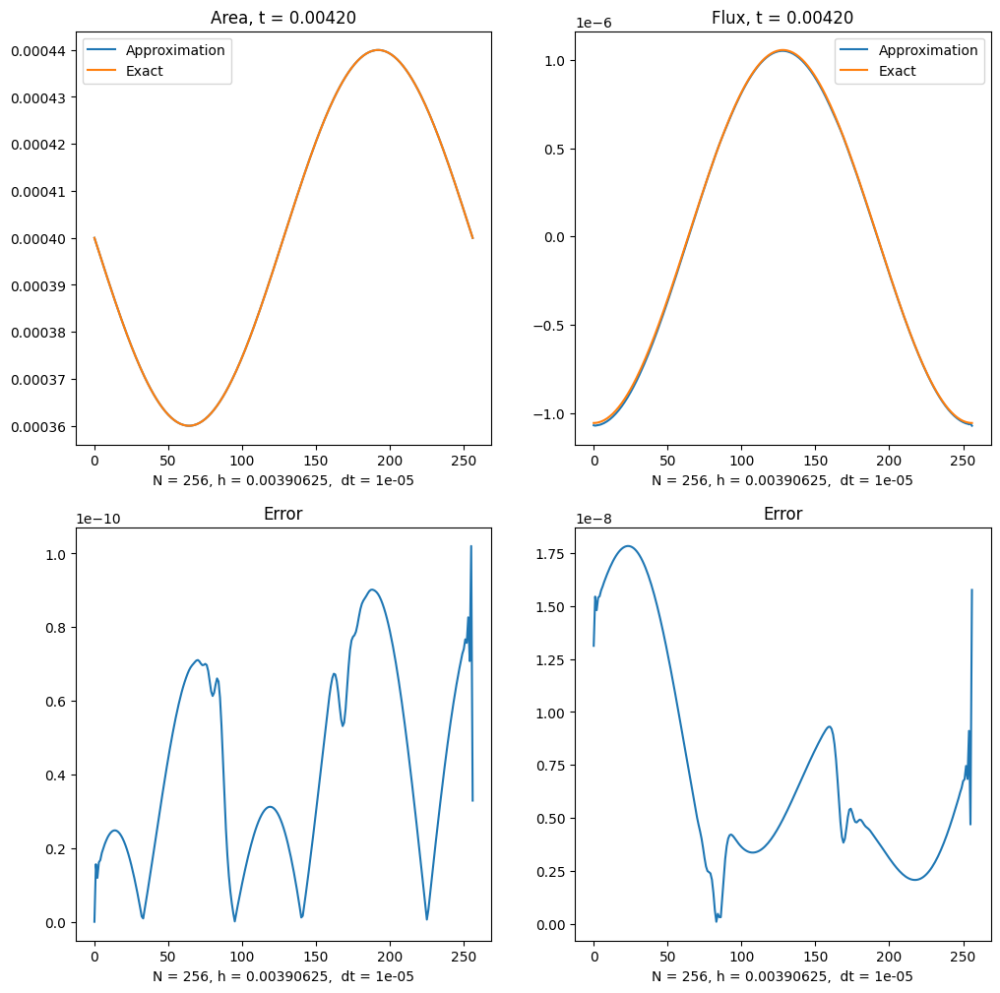

Interation 420 / 100000
t = 0.0042: error = [1.56344735e-09 5.08801730e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



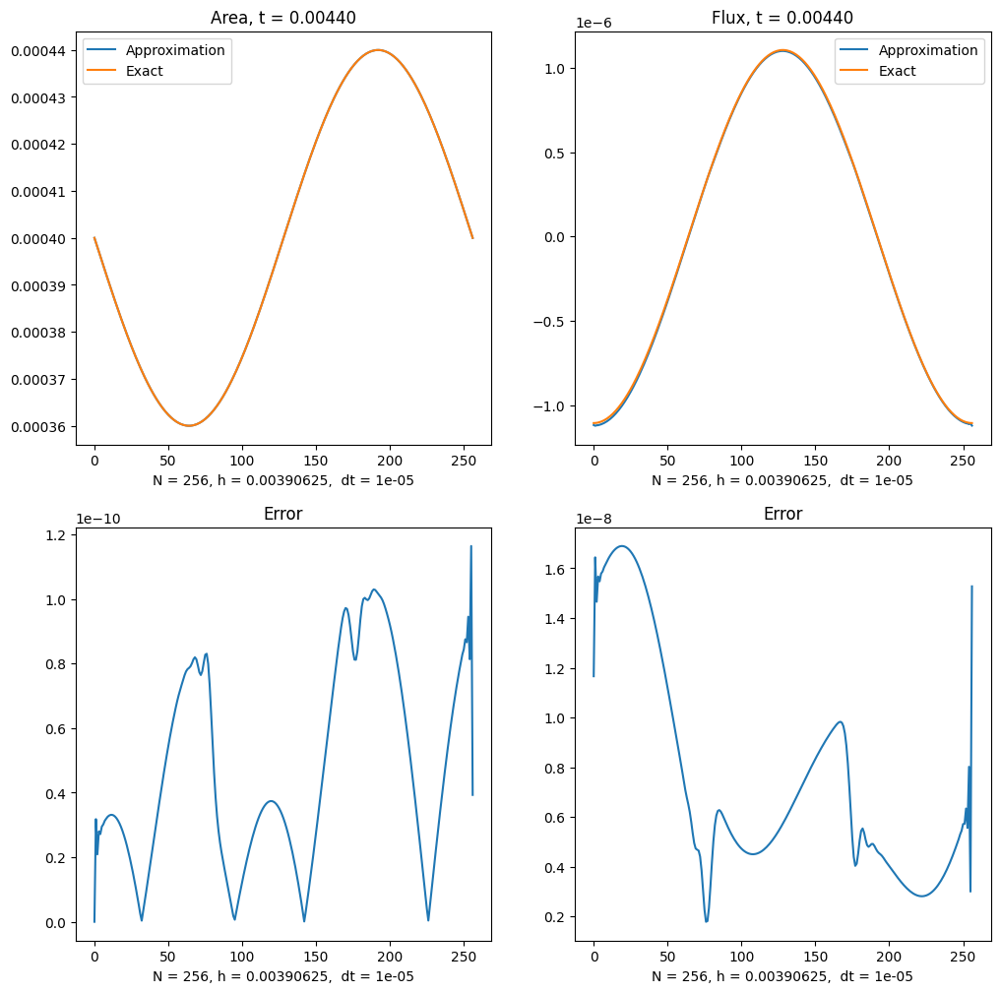

Interation 440 / 100000
t = 0.0044: error = [1.56672337e-09 4.37332339e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



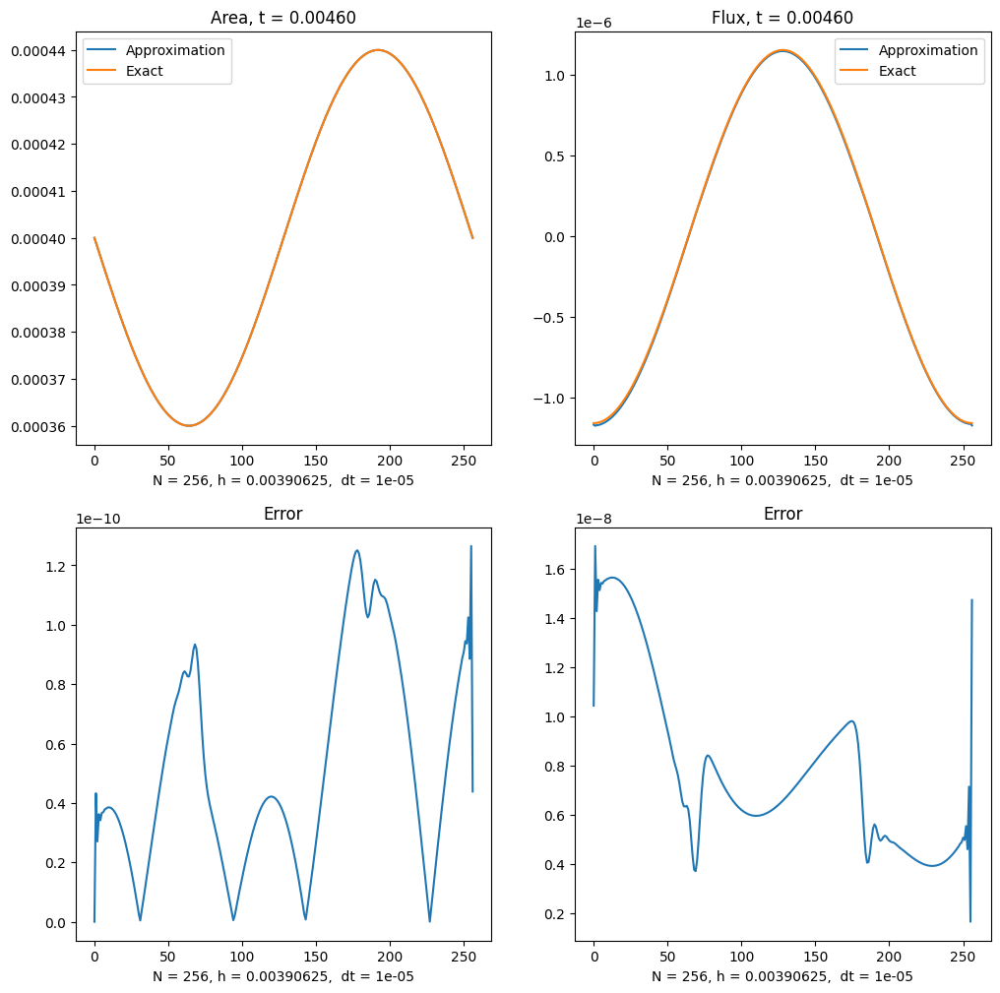

Interation 460 / 100000
t = 0.0046: error = [1.57073580e-09 3.47961818e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



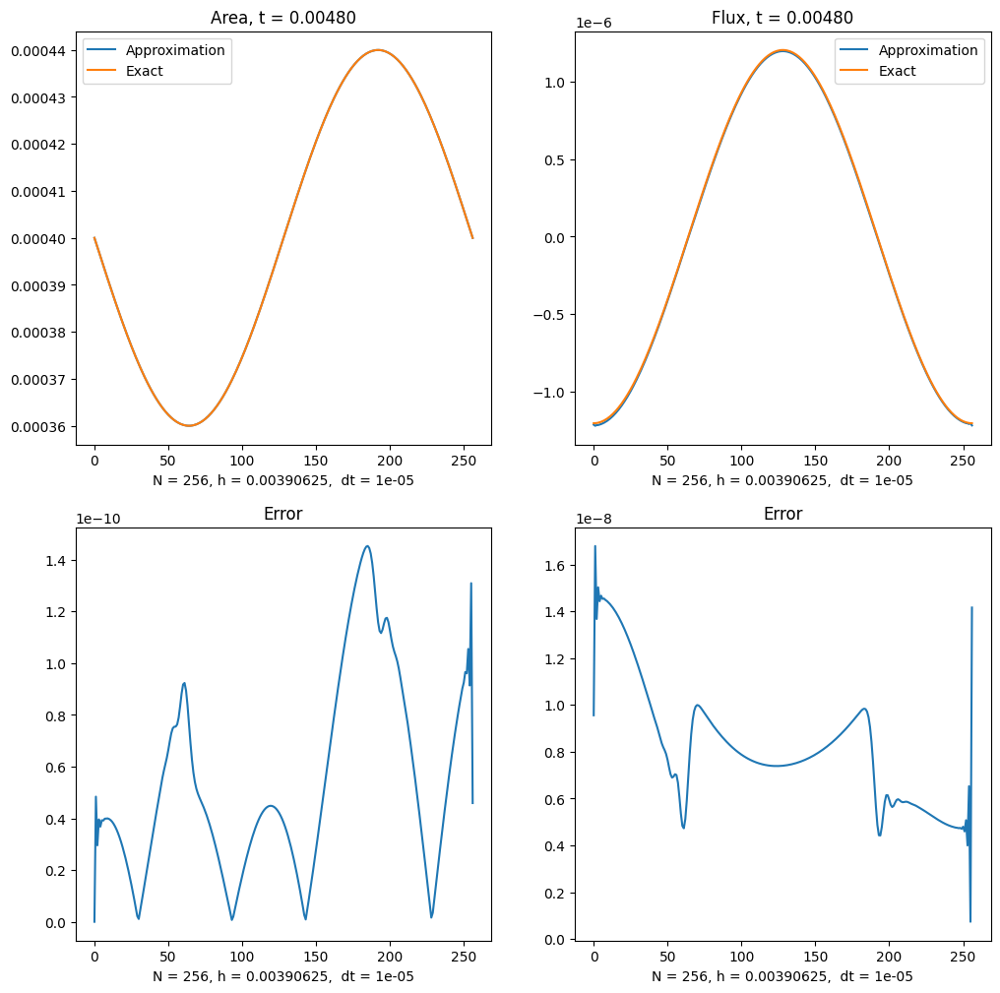

Interation 480 / 100000
t = 0.0048: error = [1.57537239e-09 2.58577731e-09]
Global error A = 1.5766526622818857e-09, Global error q = 8.033892156818384e-09



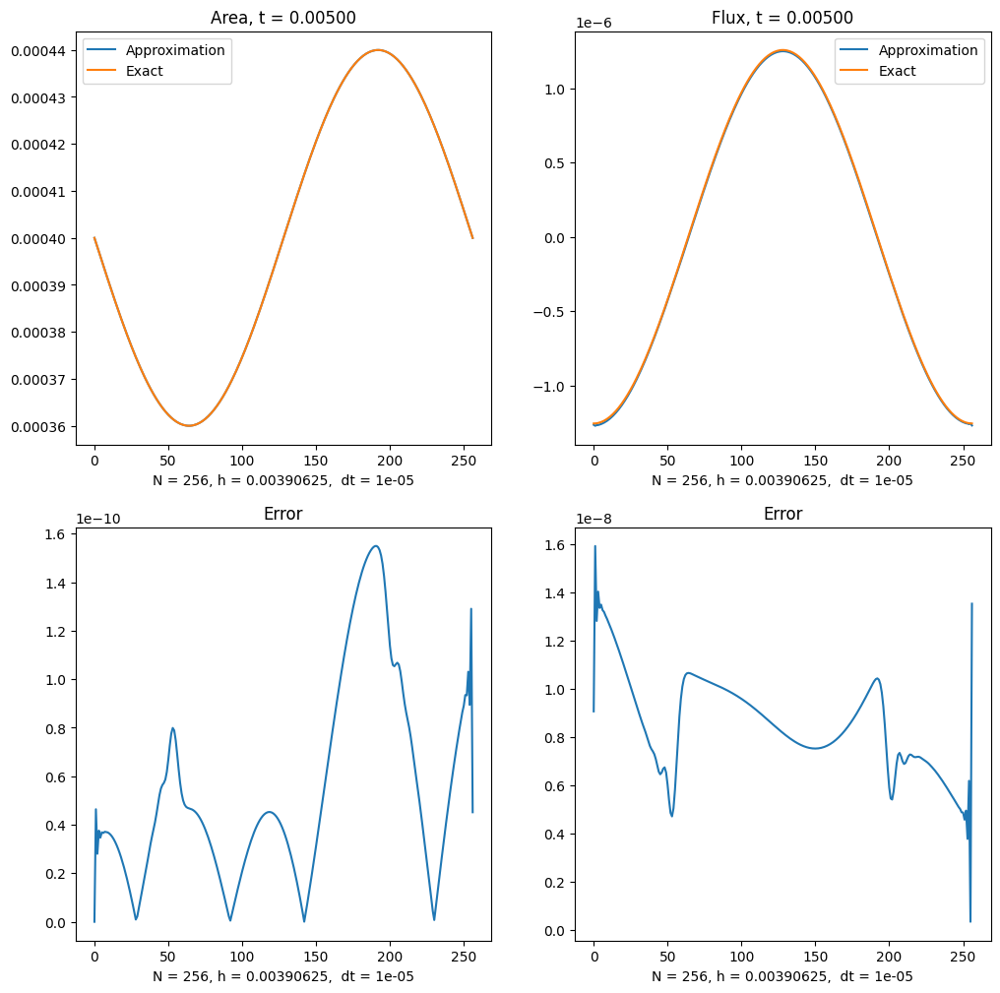

Interation 500 / 100000
t = 0.0050: error = [1.58052205e-09 2.00754747e-09]
Global error A = 1.580522046761648e-09, Global error q = 8.033892156818384e-09



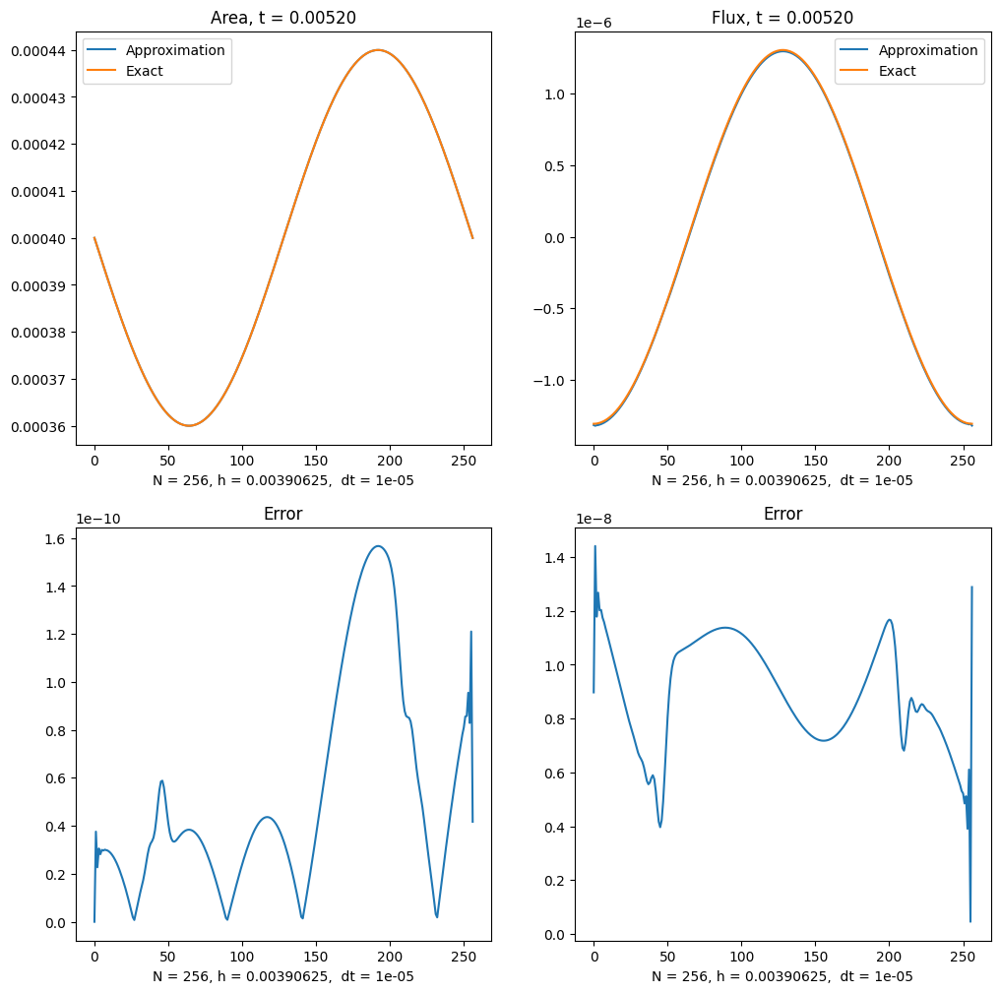

Interation 520 / 100000
t = 0.0052: error = [1.58608309e-09 2.01520264e-09]
Global error A = 1.58608309486089e-09, Global error q = 8.033892156818384e-09



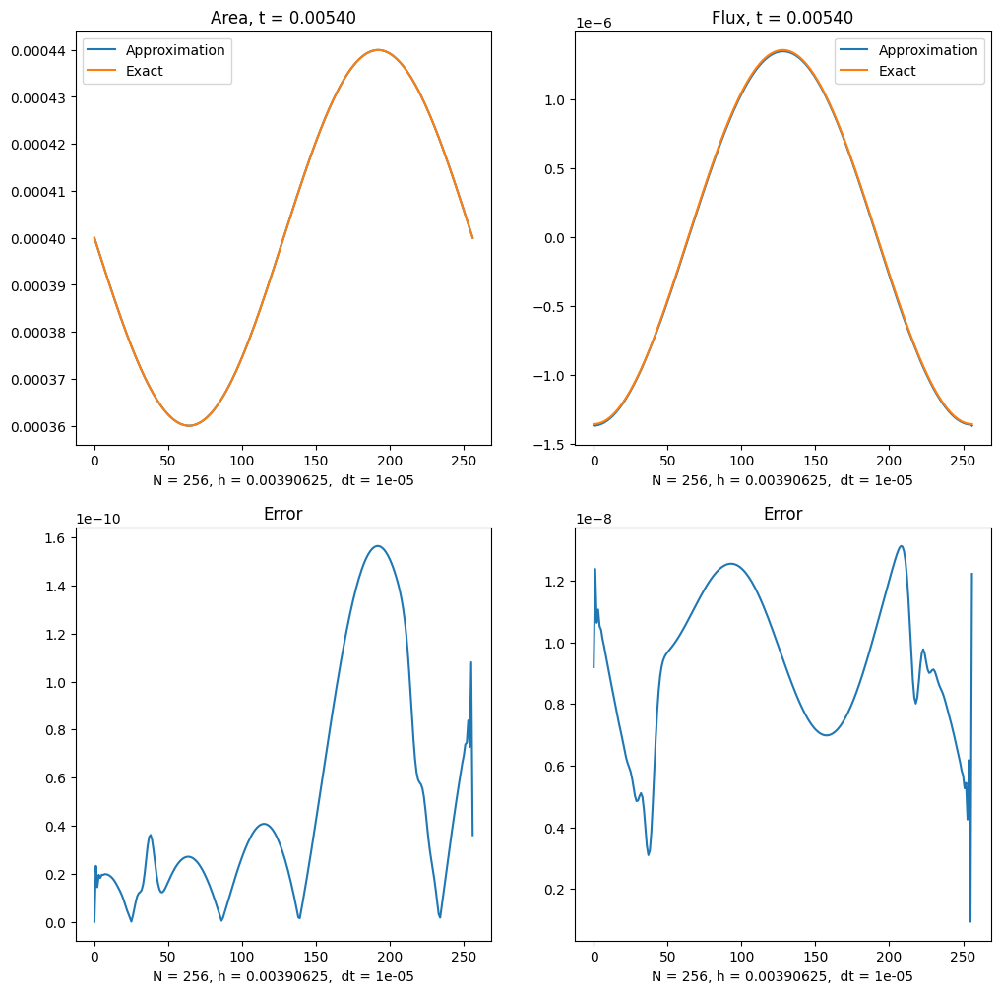

Interation 540 / 100000
t = 0.0054: error = [1.59195968e-09 2.36574304e-09]
Global error A = 1.5919596839460483e-09, Global error q = 8.033892156818384e-09



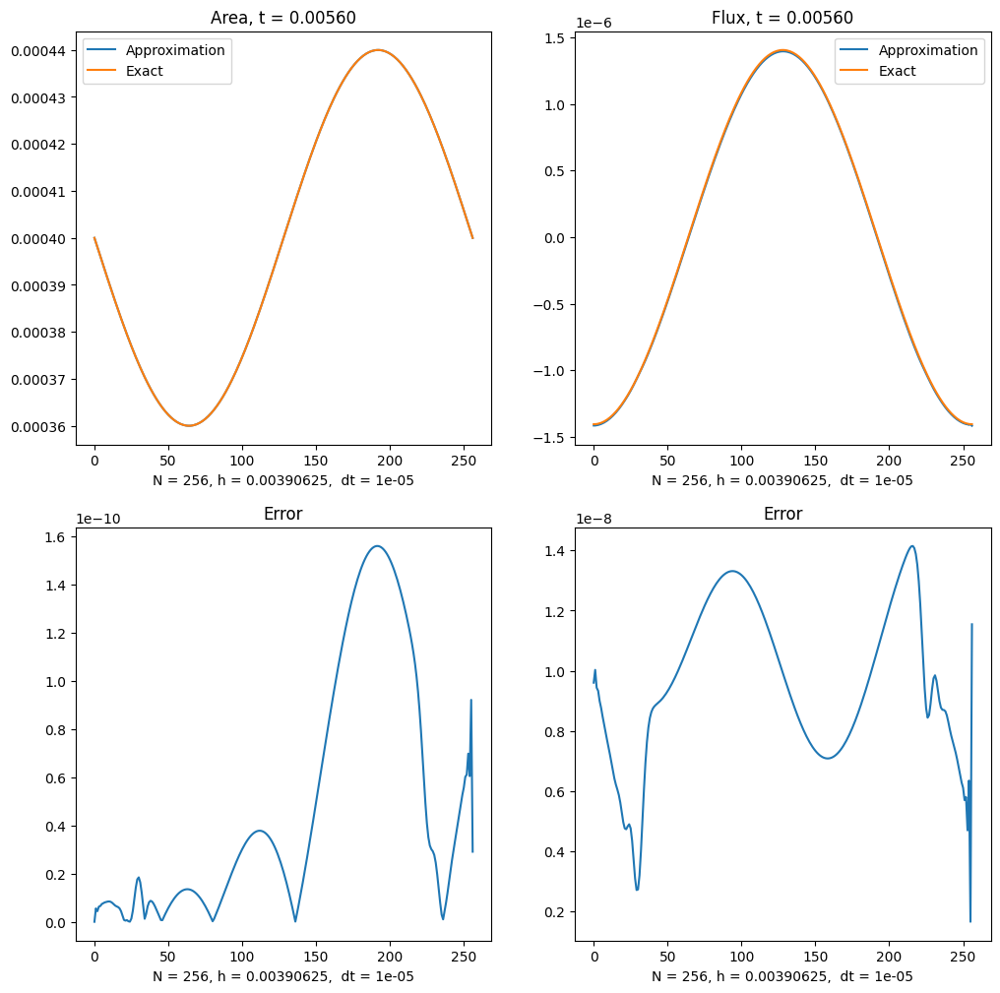

Interation 560 / 100000
t = 0.0056: error = [1.59805125e-09 2.65610383e-09]
Global error A = 1.5980512541562927e-09, Global error q = 8.033892156818384e-09



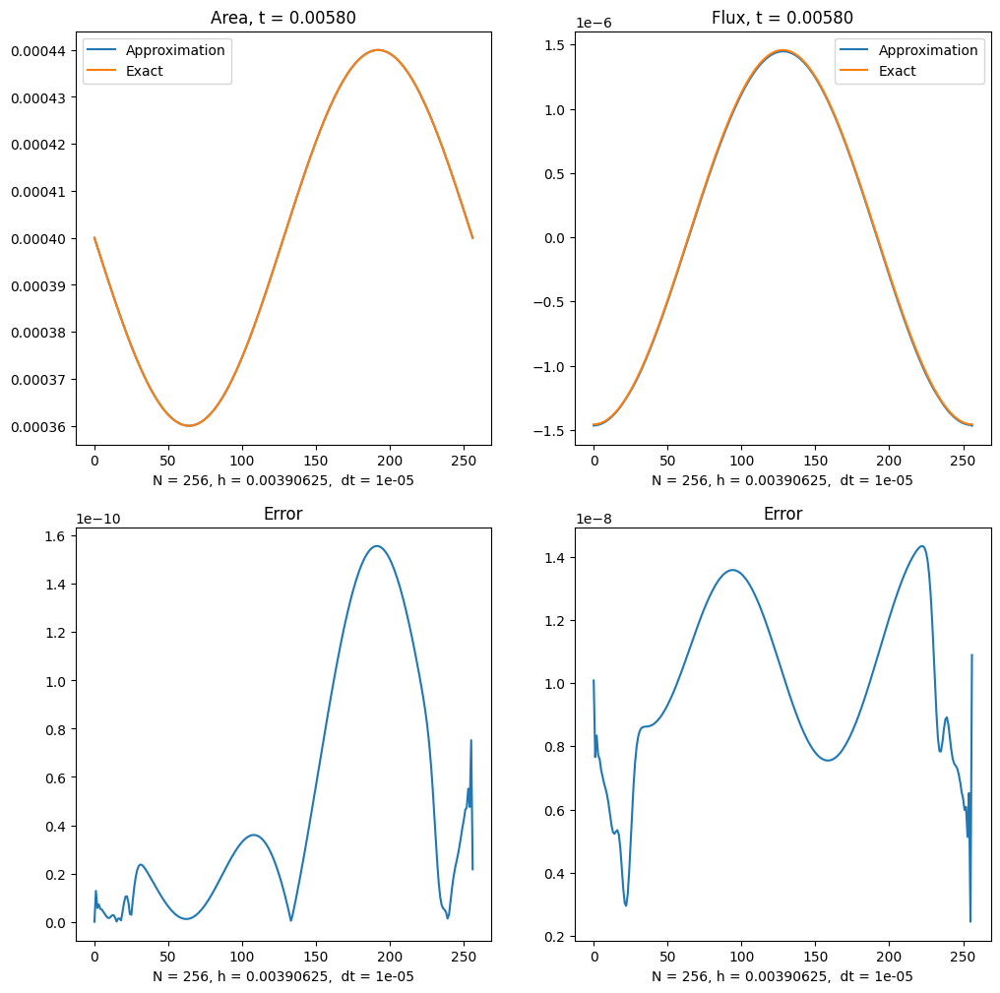

Interation 580 / 100000
t = 0.0058: error = [1.60424299e-09 2.69449450e-09]
Global error A = 1.604242985007539e-09, Global error q = 8.033892156818384e-09



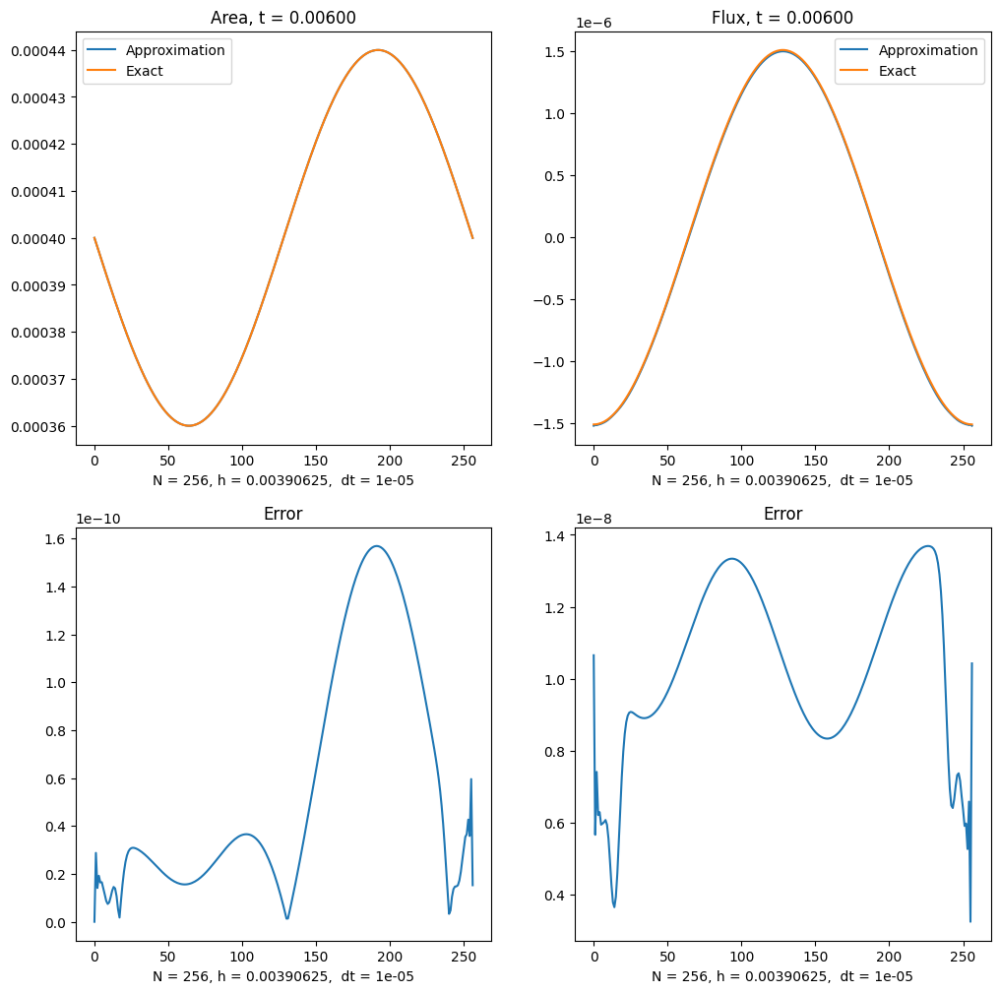

Interation 600 / 100000
t = 0.0060: error = [1.61040341e-09 2.43140779e-09]
Global error A = 1.6104034080058938e-09, Global error q = 8.033892156818384e-09



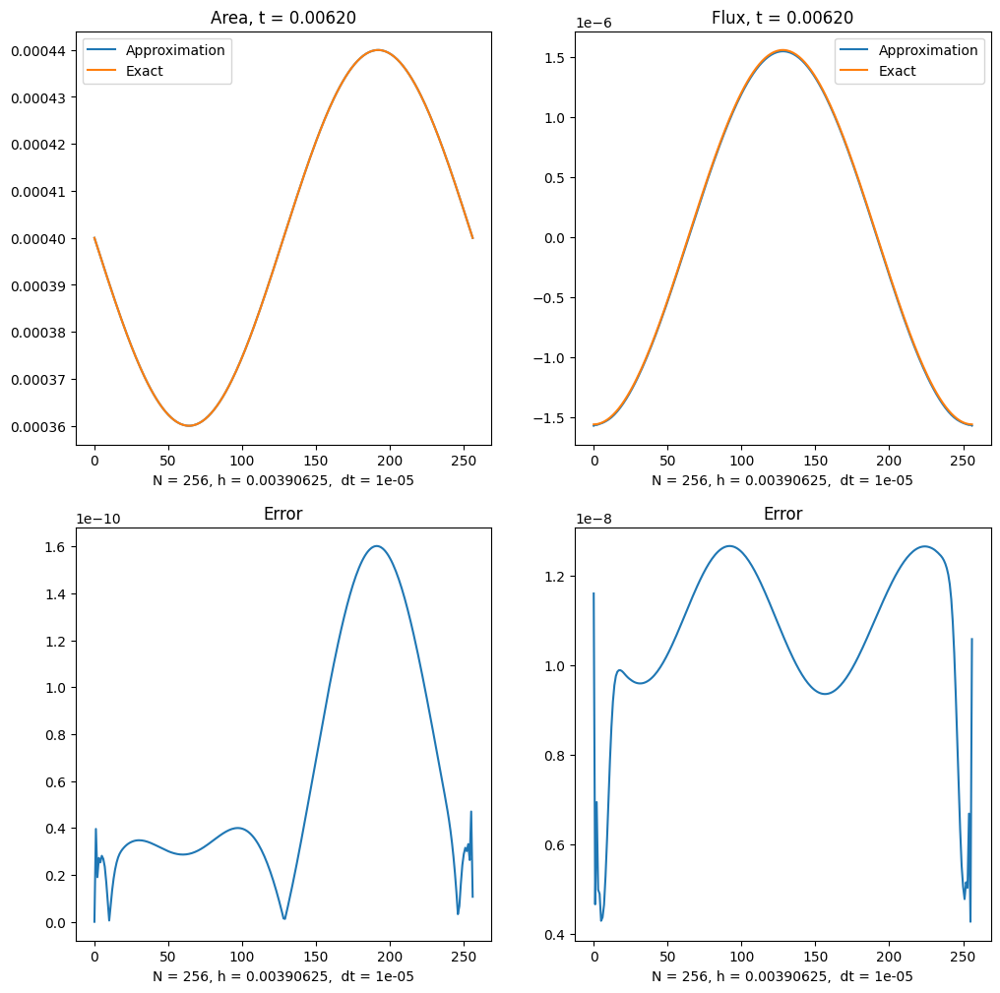

Interation 620 / 100000
t = 0.0062: error = [1.61639015e-09 1.87848149e-09]
Global error A = 1.6163901467481713e-09, Global error q = 8.033892156818384e-09



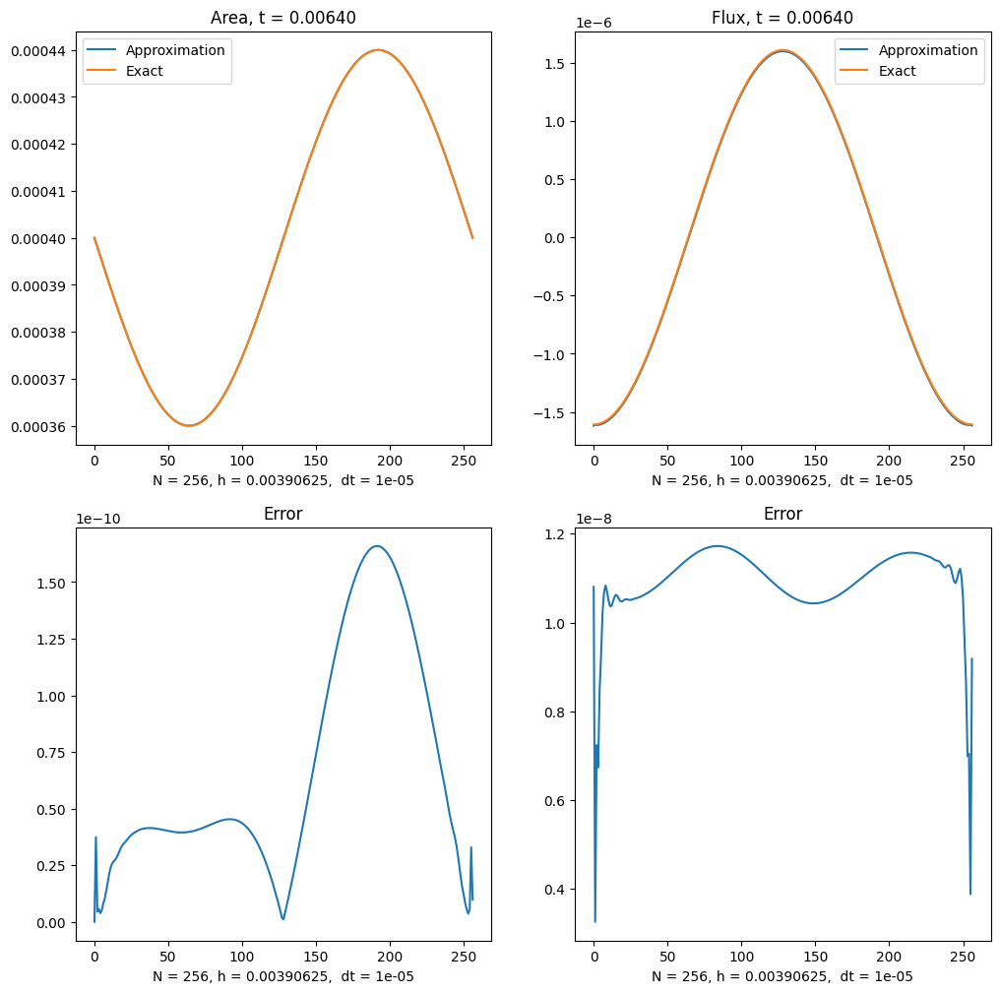

Interation 640 / 100000
t = 0.0064: error = [1.62205469e-09 9.36710655e-10]
Global error A = 1.6220546883773535e-09, Global error q = 8.033892156818384e-09



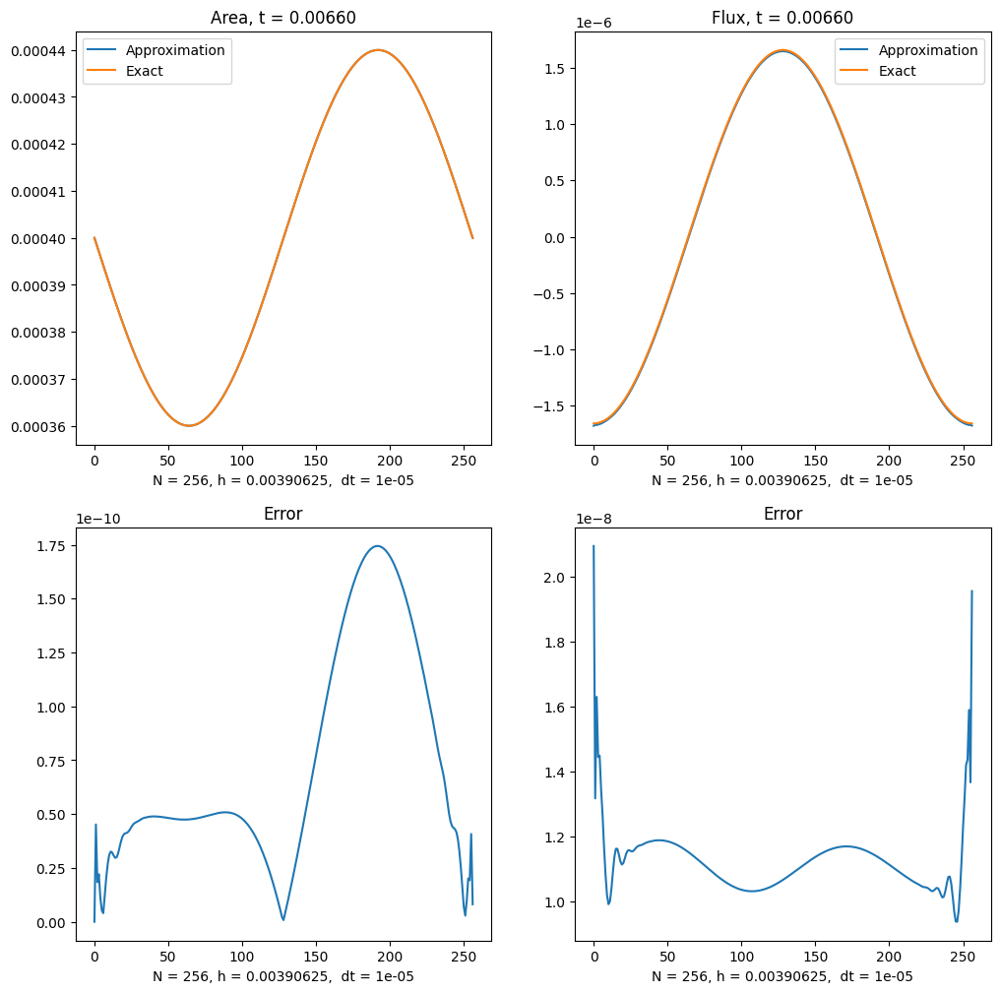

Interation 660 / 100000
t = 0.0066: error = [1.62729961e-09 9.85710596e-10]
Global error A = 1.6272996079622909e-09, Global error q = 8.033892156818384e-09



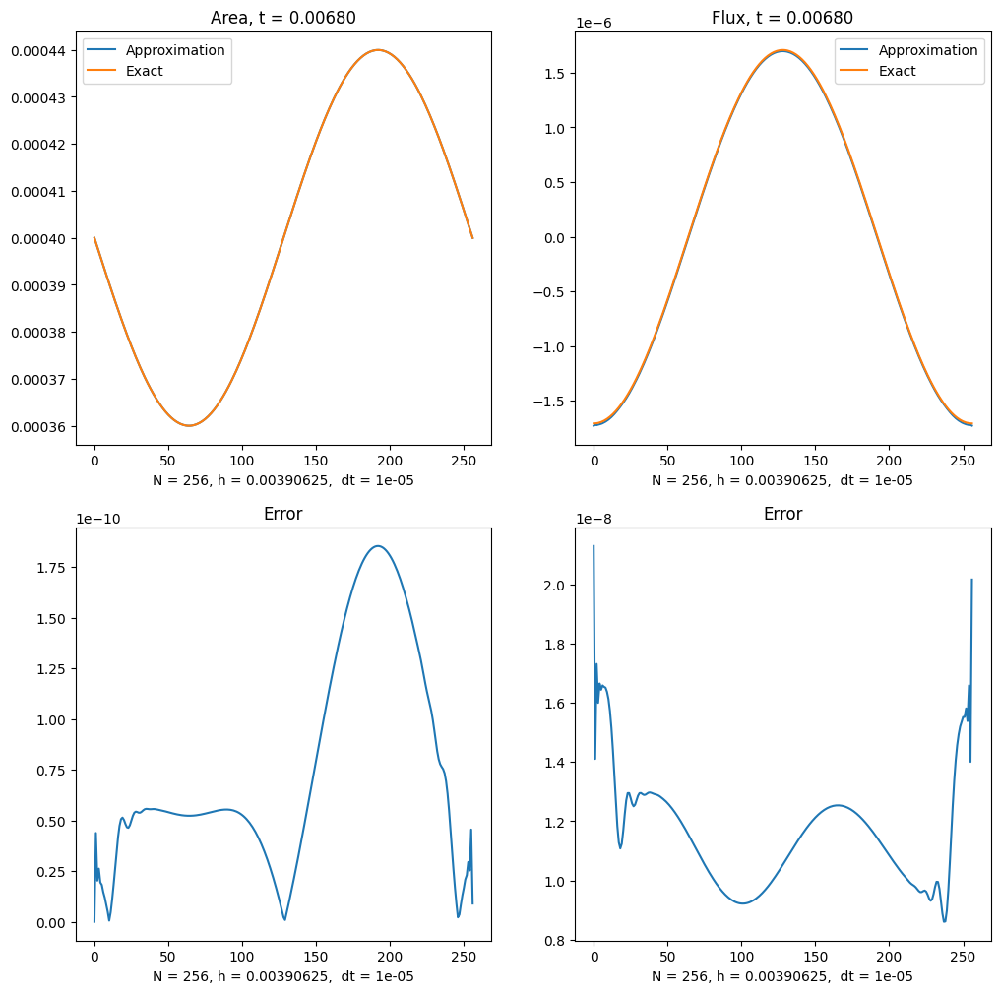

Interation 680 / 100000
t = 0.0068: error = [1.63198959e-09 1.85618933e-09]
Global error A = 1.6319895899783298e-09, Global error q = 8.033892156818384e-09



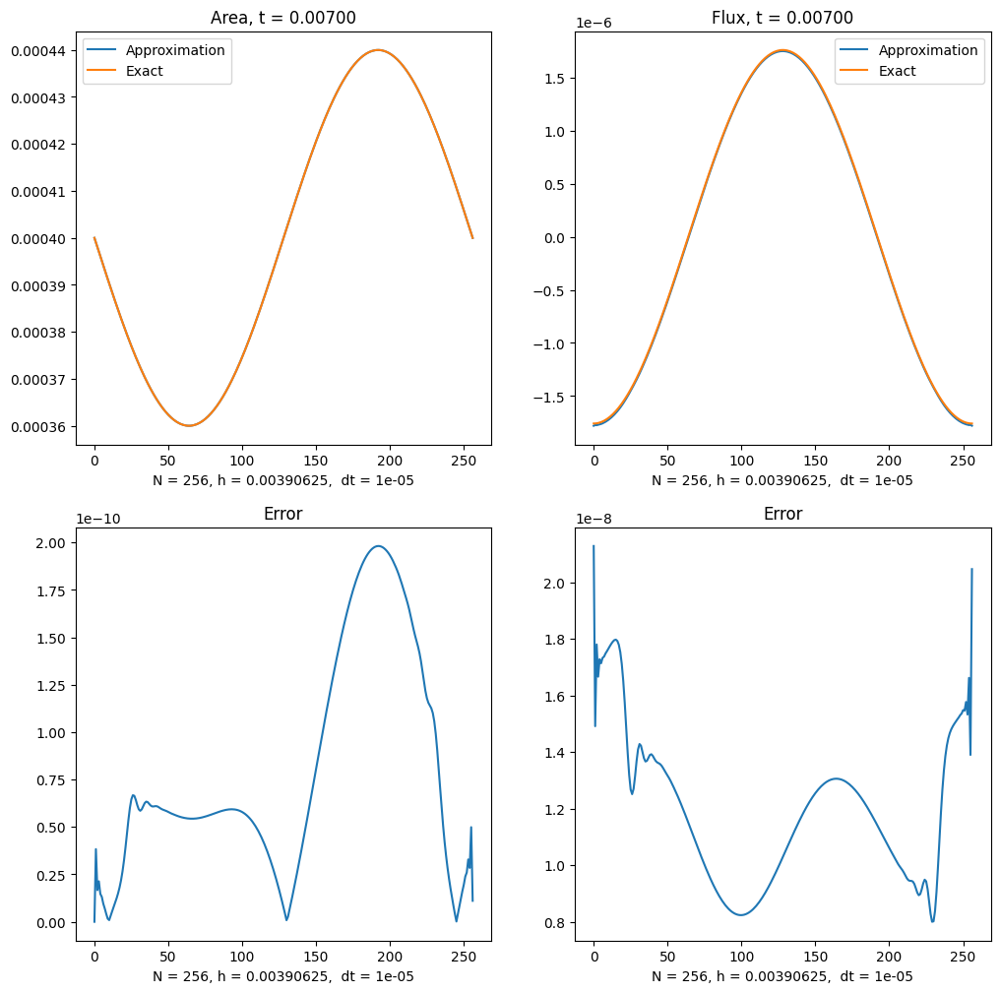

Interation 700 / 100000
t = 0.0070: error = [1.63600964e-09 2.57873804e-09]
Global error A = 1.6360096411092892e-09, Global error q = 8.033892156818384e-09



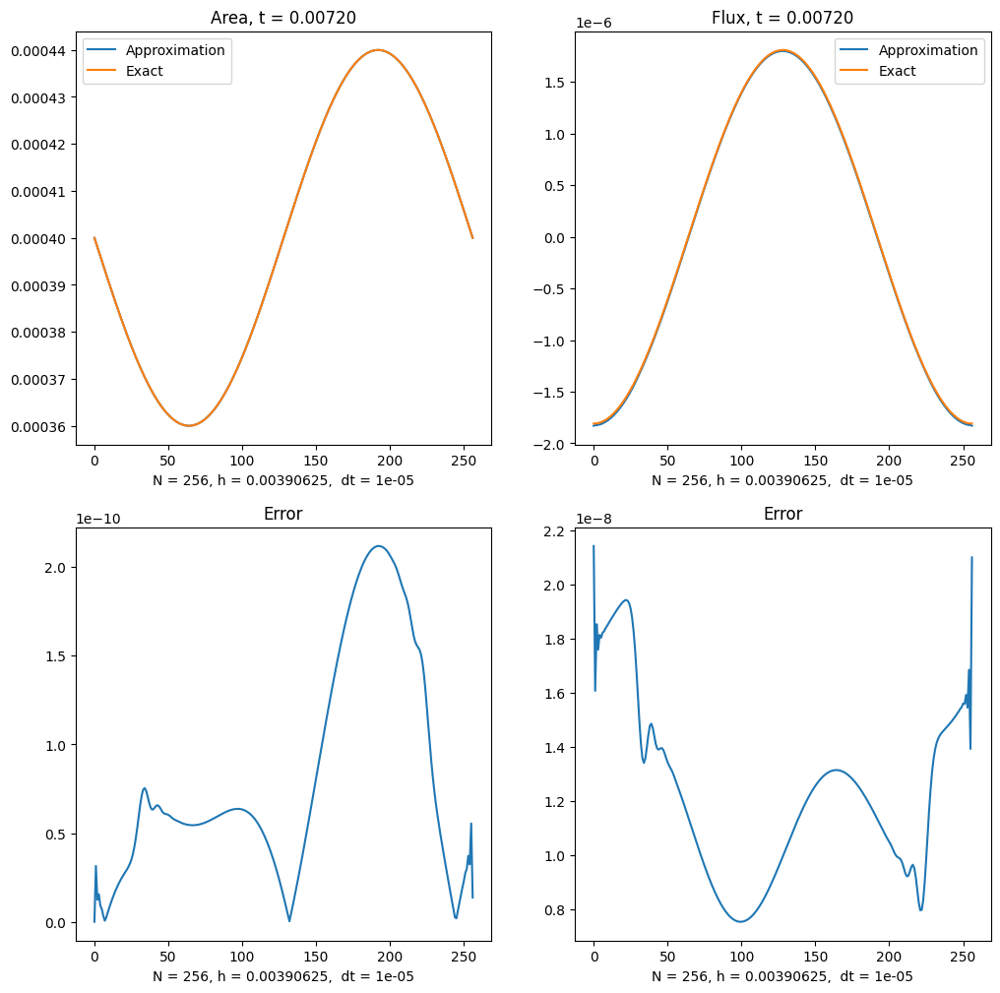

Interation 720 / 100000
t = 0.0072: error = [1.63928117e-09 3.19331389e-09]
Global error A = 1.6392811692791675e-09, Global error q = 8.033892156818384e-09



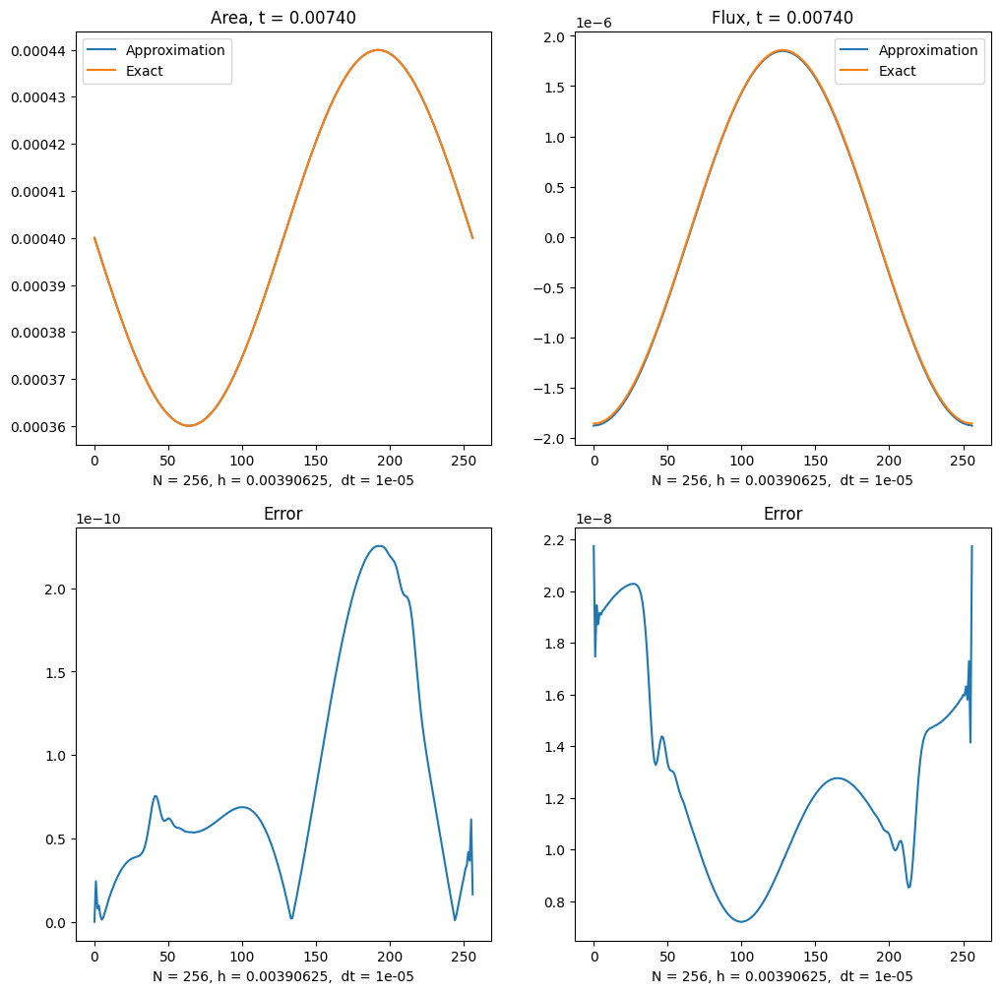

Interation 740 / 100000
t = 0.0074: error = [1.64174902e-09 3.71090096e-09]
Global error A = 1.641749024828059e-09, Global error q = 8.033892156818384e-09



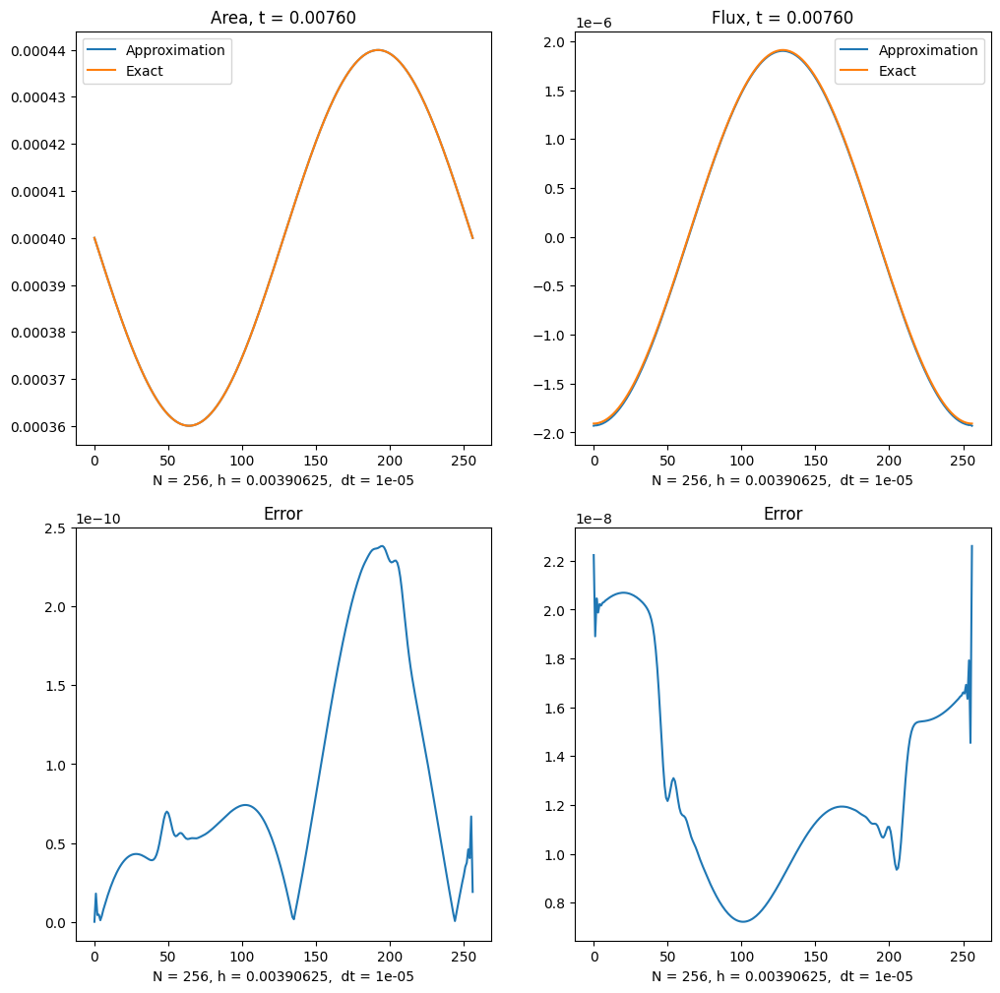

Interation 760 / 100000
t = 0.0076: error = [1.64338253e-09 4.16490235e-09]
Global error A = 1.6433825296071687e-09, Global error q = 8.033892156818384e-09



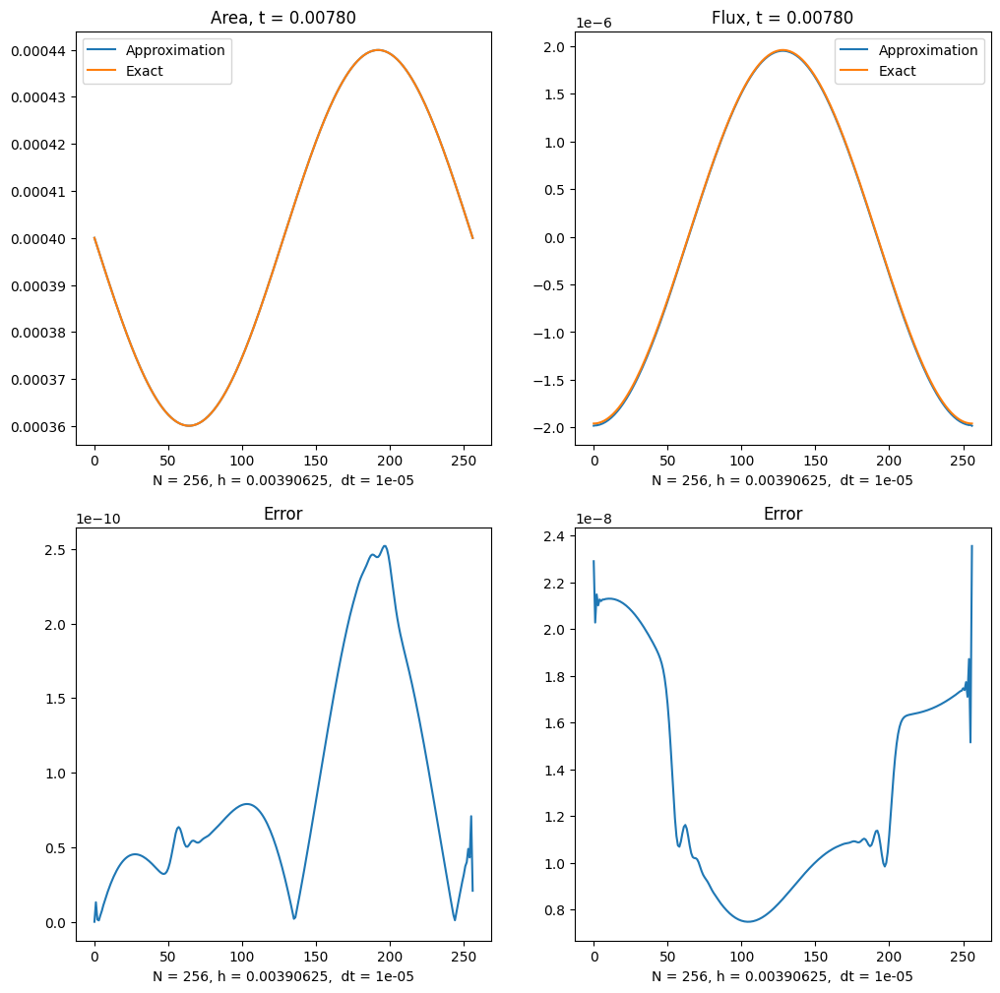

Interation 780 / 100000
t = 0.0078: error = [1.64417902e-09 4.60304136e-09]
Global error A = 1.6441790211343063e-09, Global error q = 8.033892156818384e-09



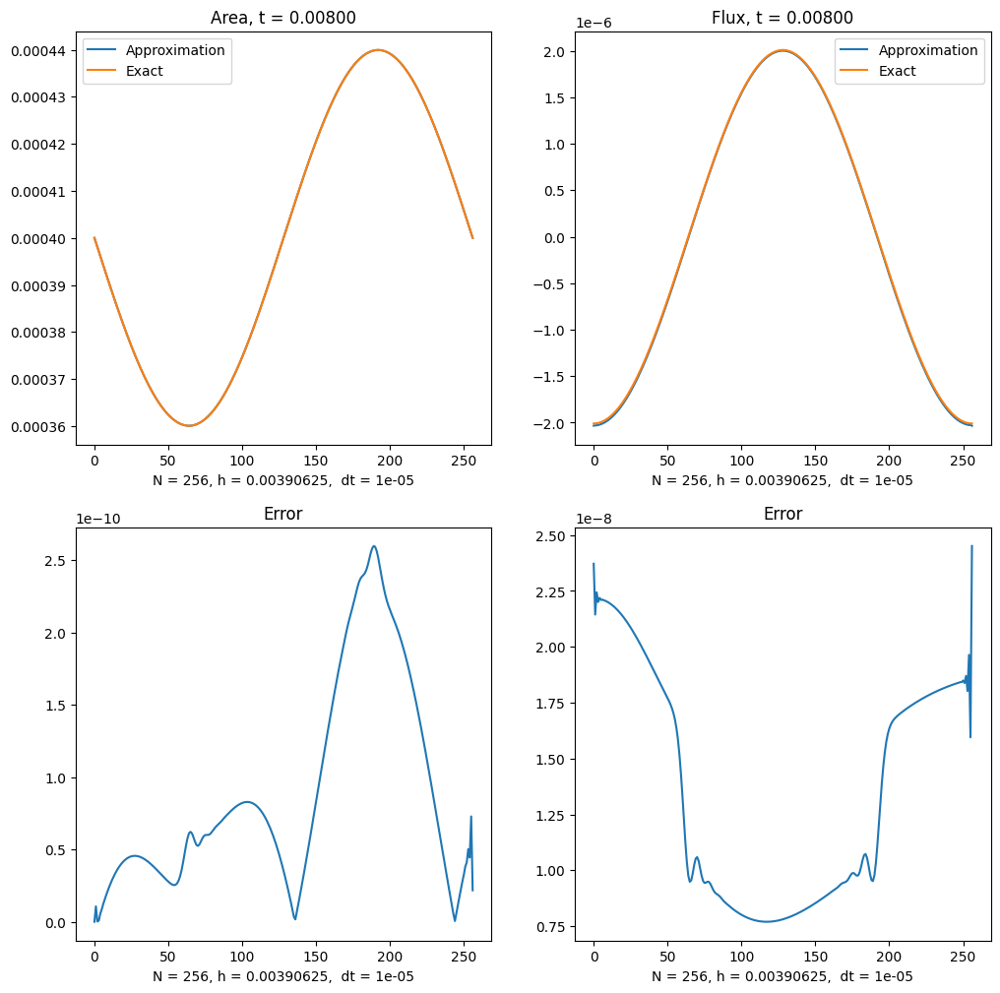

Interation 800 / 100000
t = 0.0080: error = [1.64416875e-09 5.06137808e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



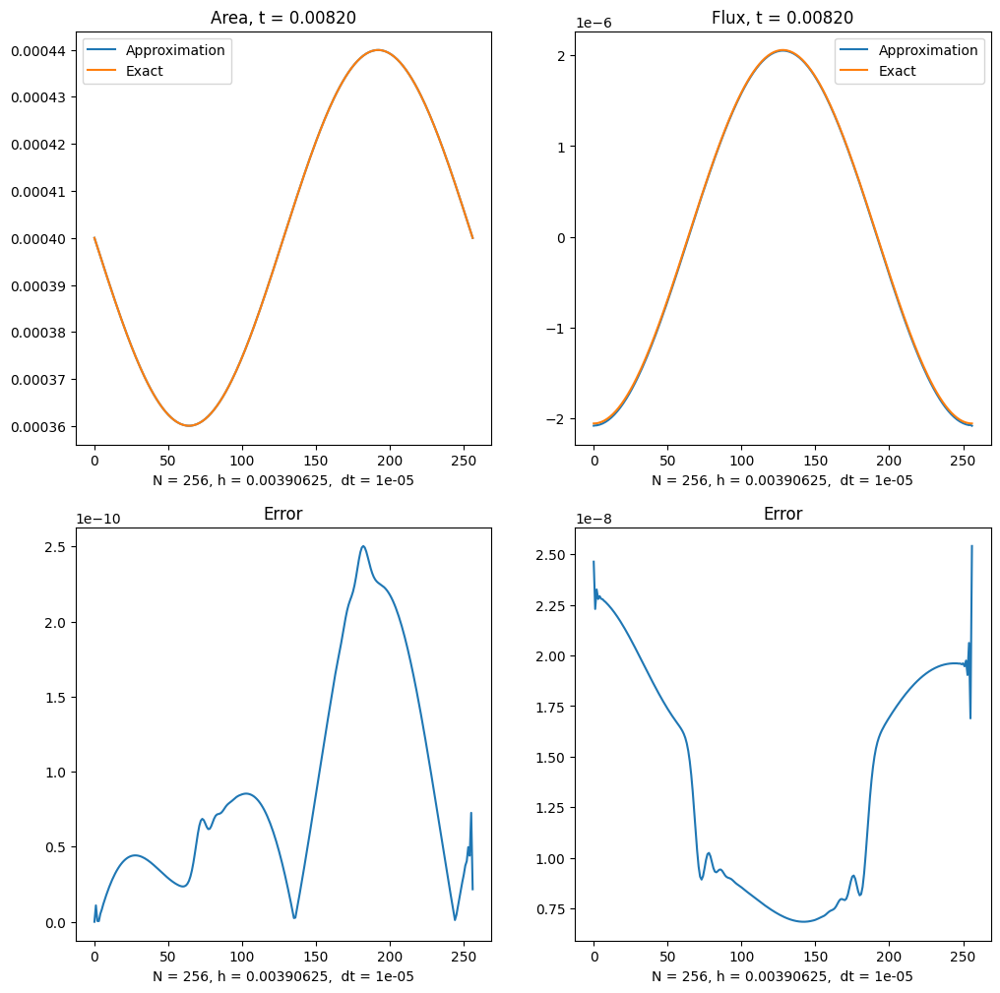

Interation 820 / 100000
t = 0.0082: error = [1.6434192e-09 5.5407914e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



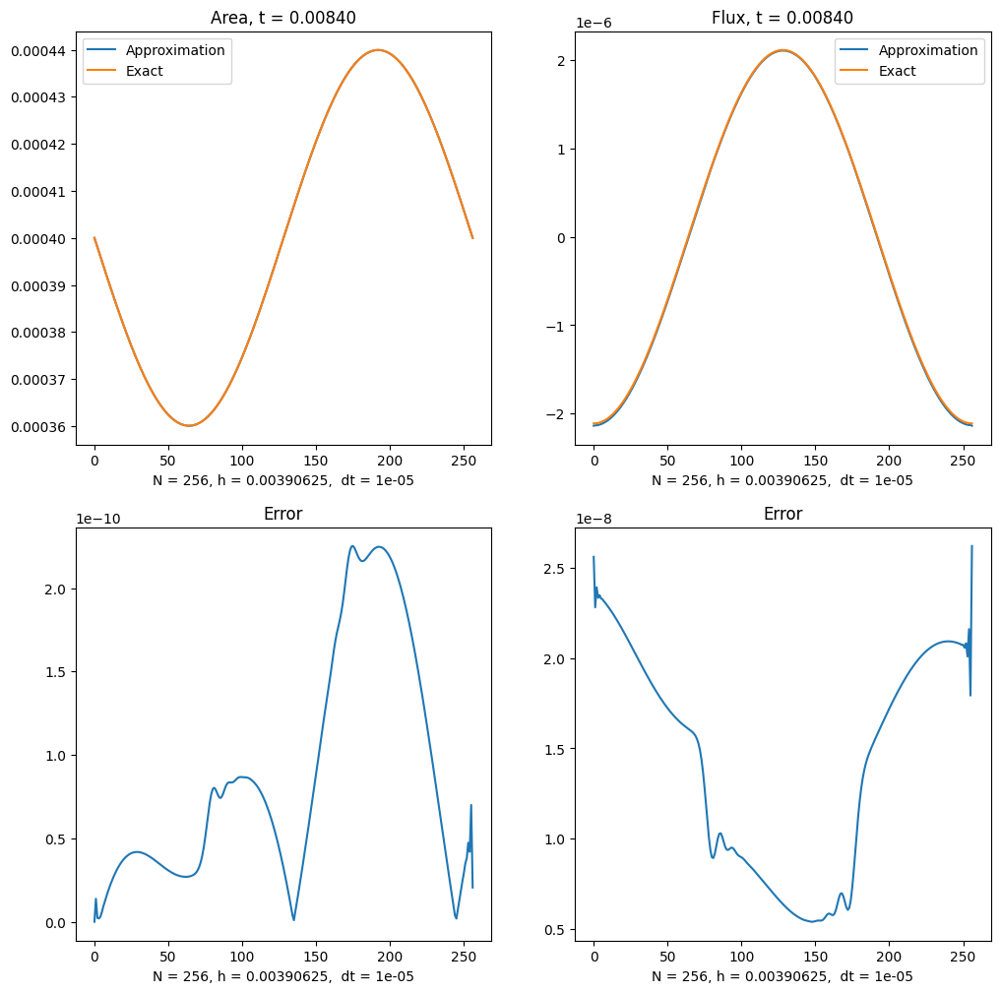

Interation 840 / 100000
t = 0.0084: error = [1.64203610e-09 6.00401506e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



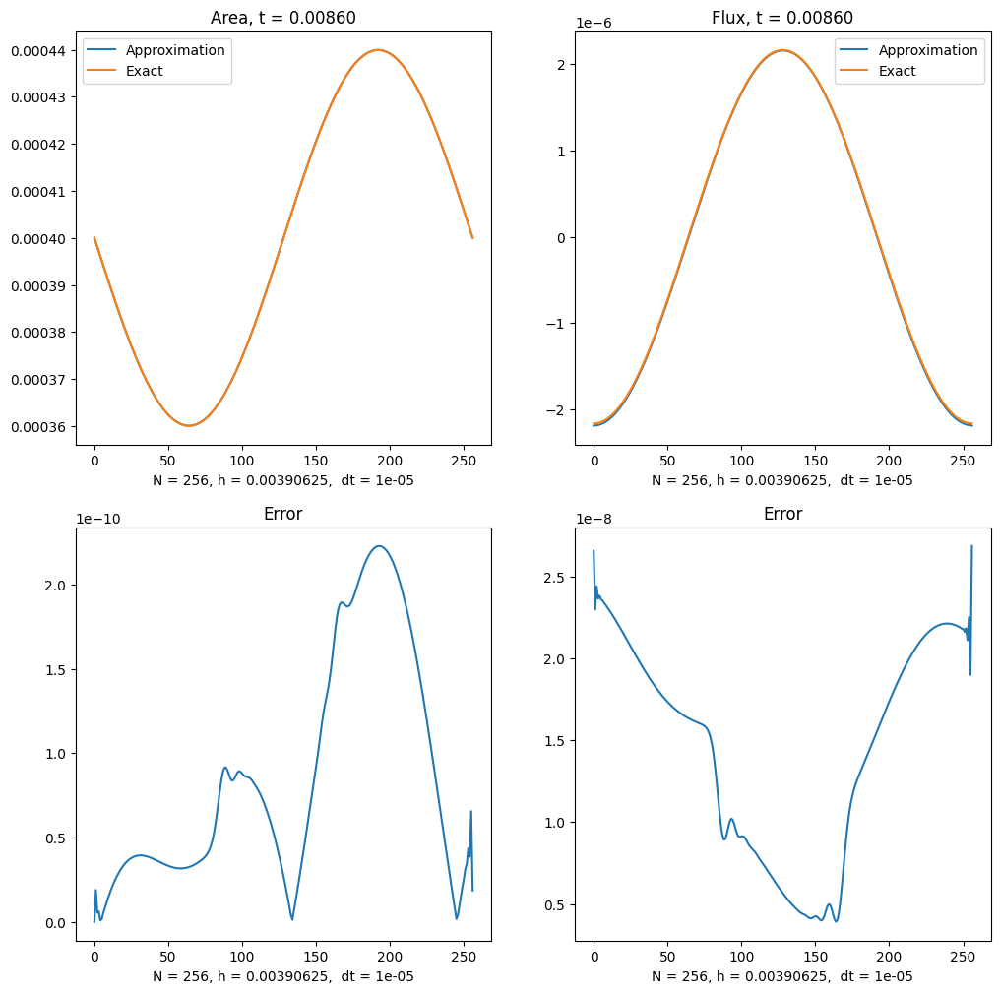

Interation 860 / 100000
t = 0.0086: error = [1.64015944e-09 6.39313301e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



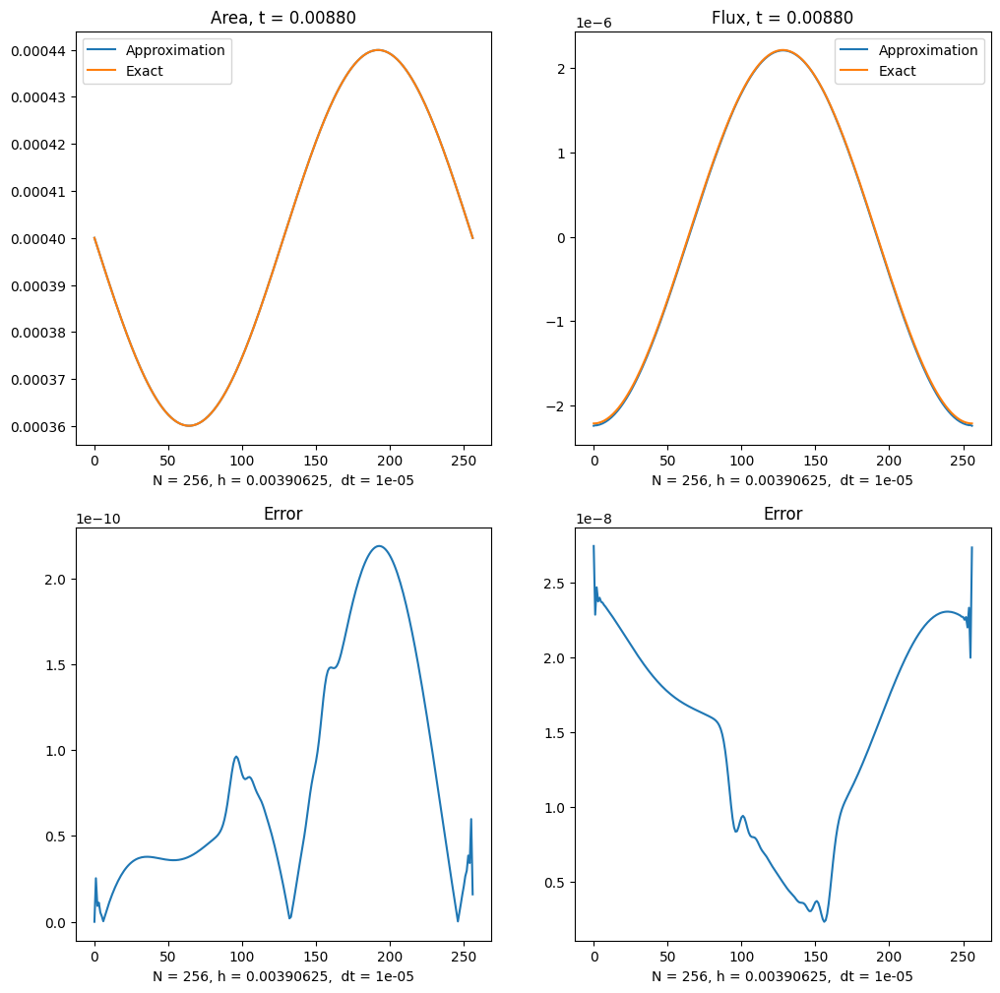

Interation 880 / 100000
t = 0.0088: error = [1.63795486e-09 6.65240014e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



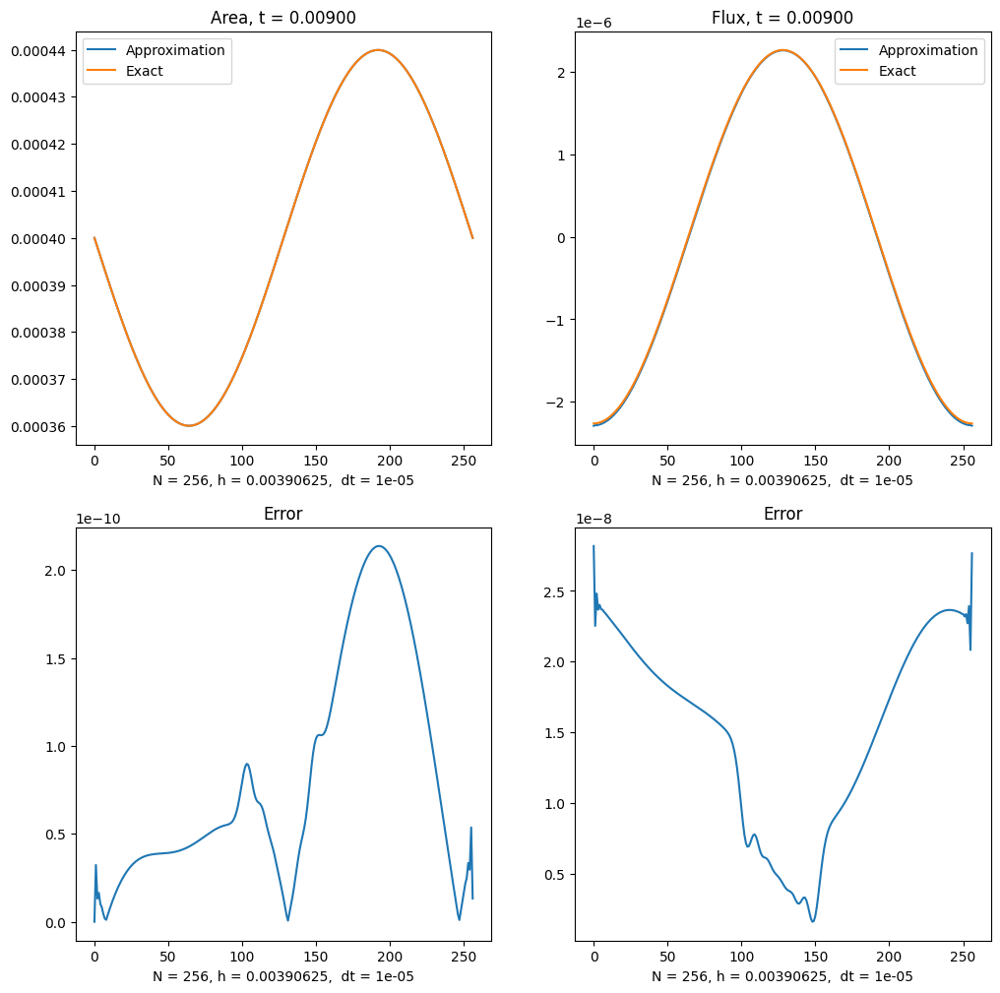

Interation 900 / 100000
t = 0.0090: error = [1.63560247e-09 6.74341698e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



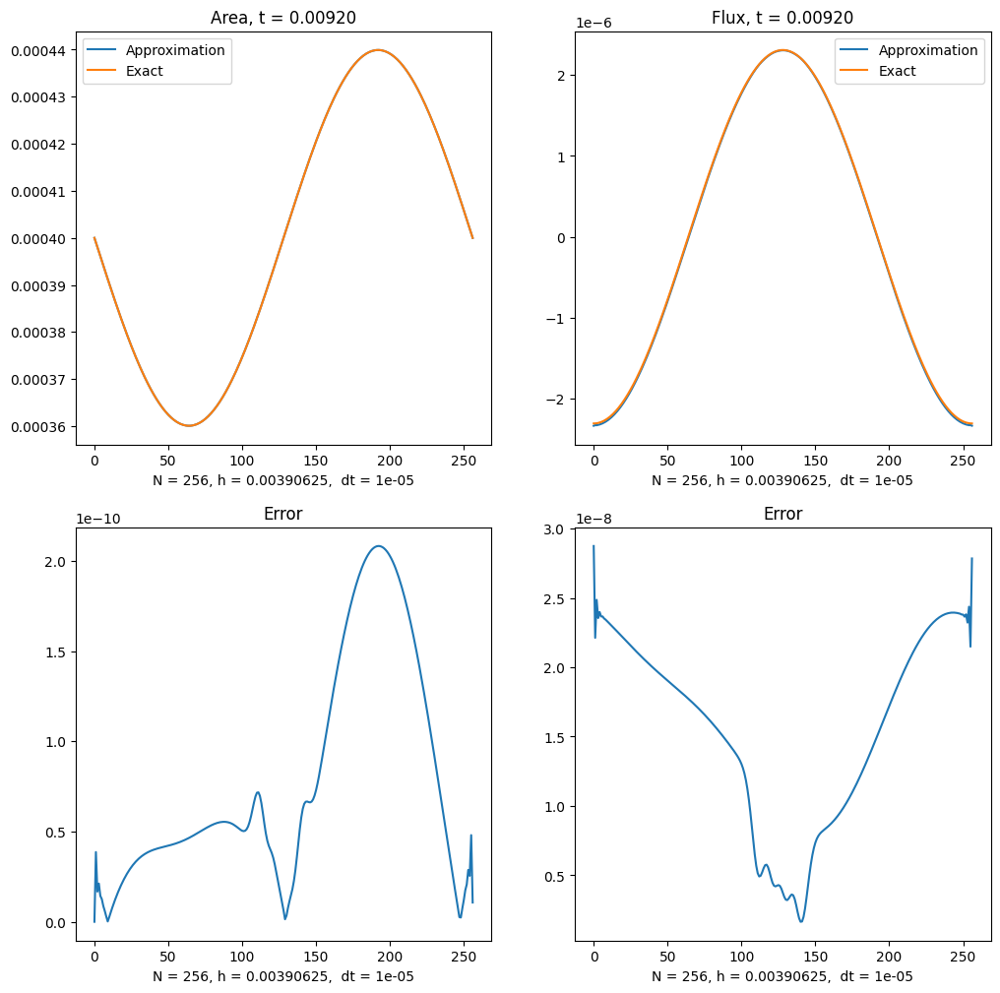

Interation 920 / 100000
t = 0.0092: error = [1.63328610e-09 6.64904163e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



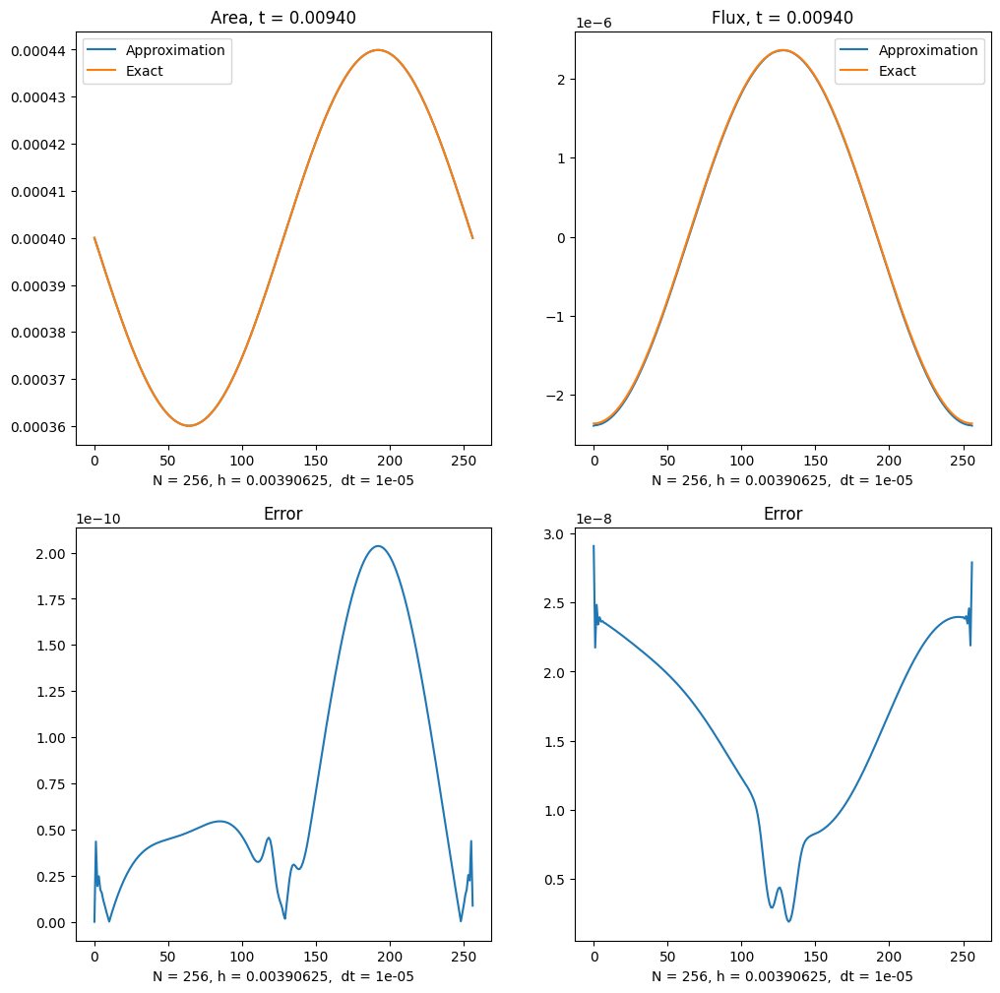

Interation 940 / 100000
t = 0.0094: error = [1.63118421e-09 6.36863004e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



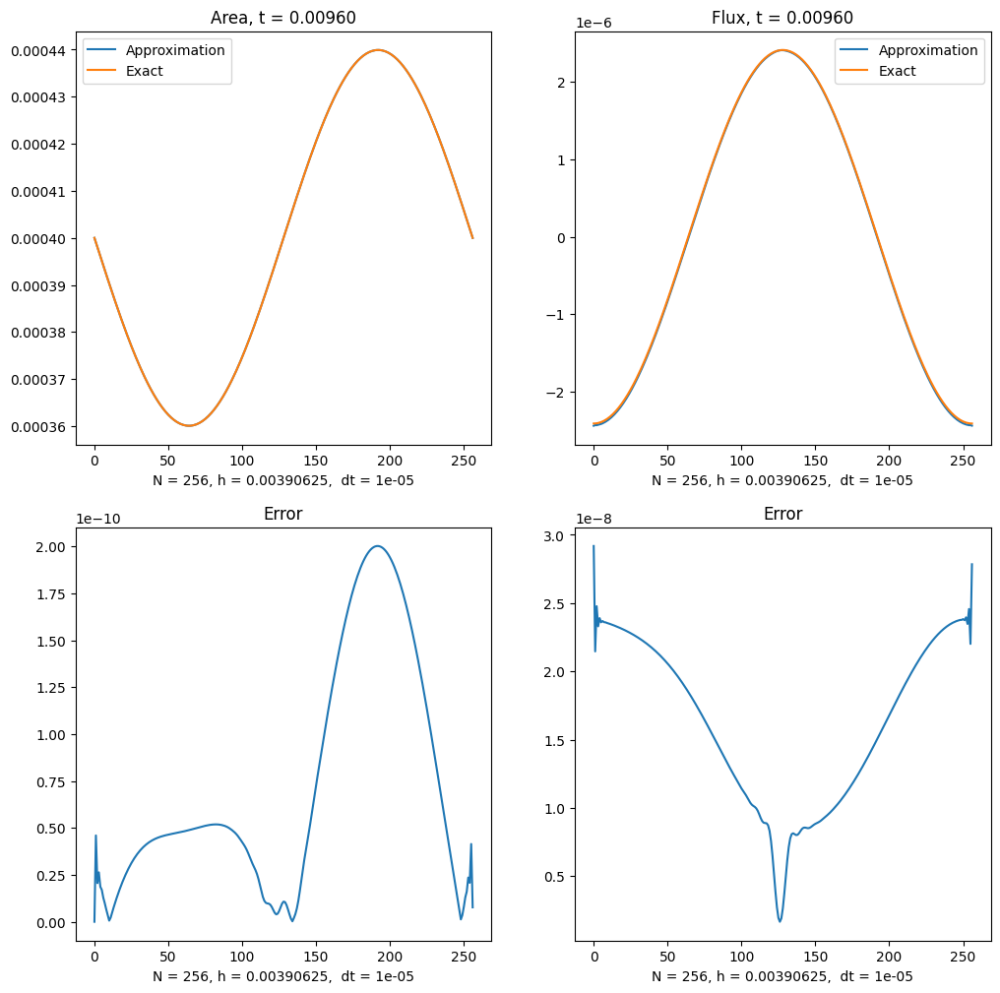

Interation 960 / 100000
t = 0.0096: error = [1.62946262e-09 5.91019993e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



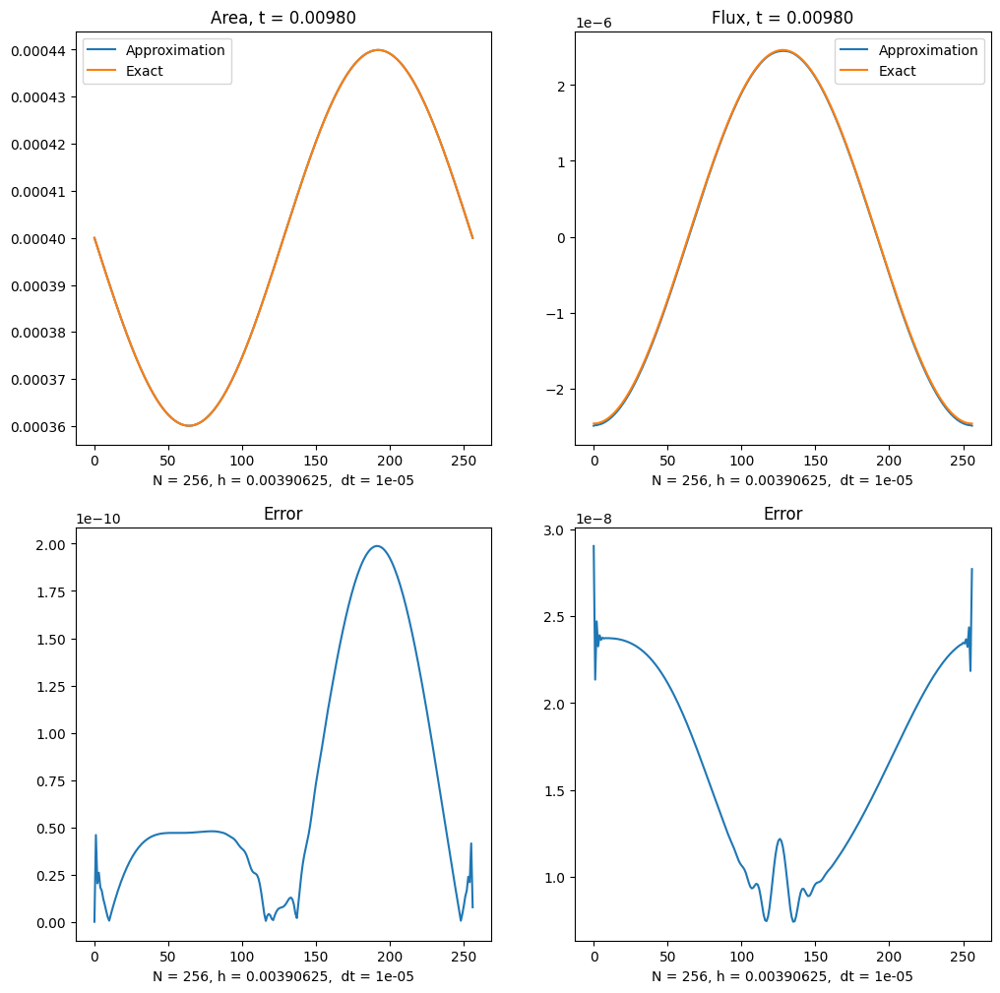

Interation 980 / 100000
t = 0.0098: error = [1.62825482e-09 5.37835238e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



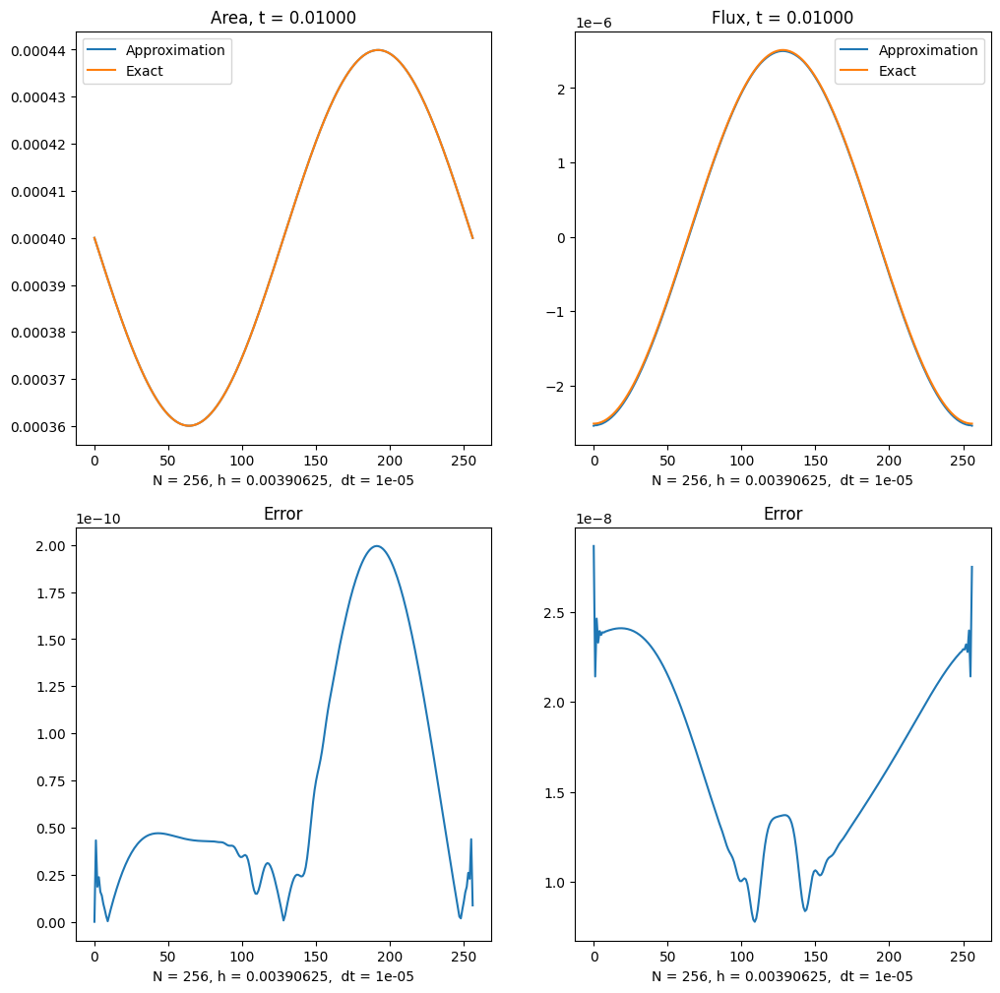

Interation 1000 / 100000
t = 0.0100: error = [1.62766612e-09 4.94757479e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



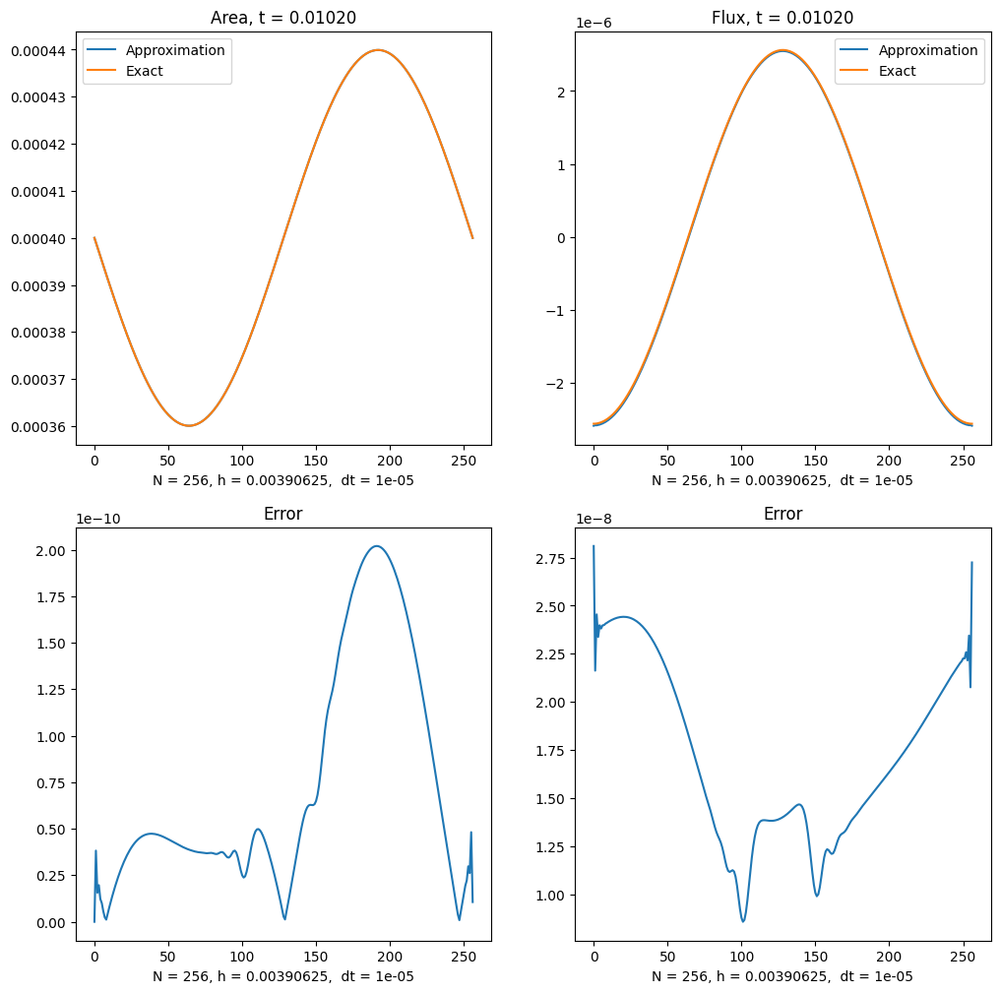

Interation 1020 / 100000
t = 0.0102: error = [1.62782052e-09 4.44639572e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



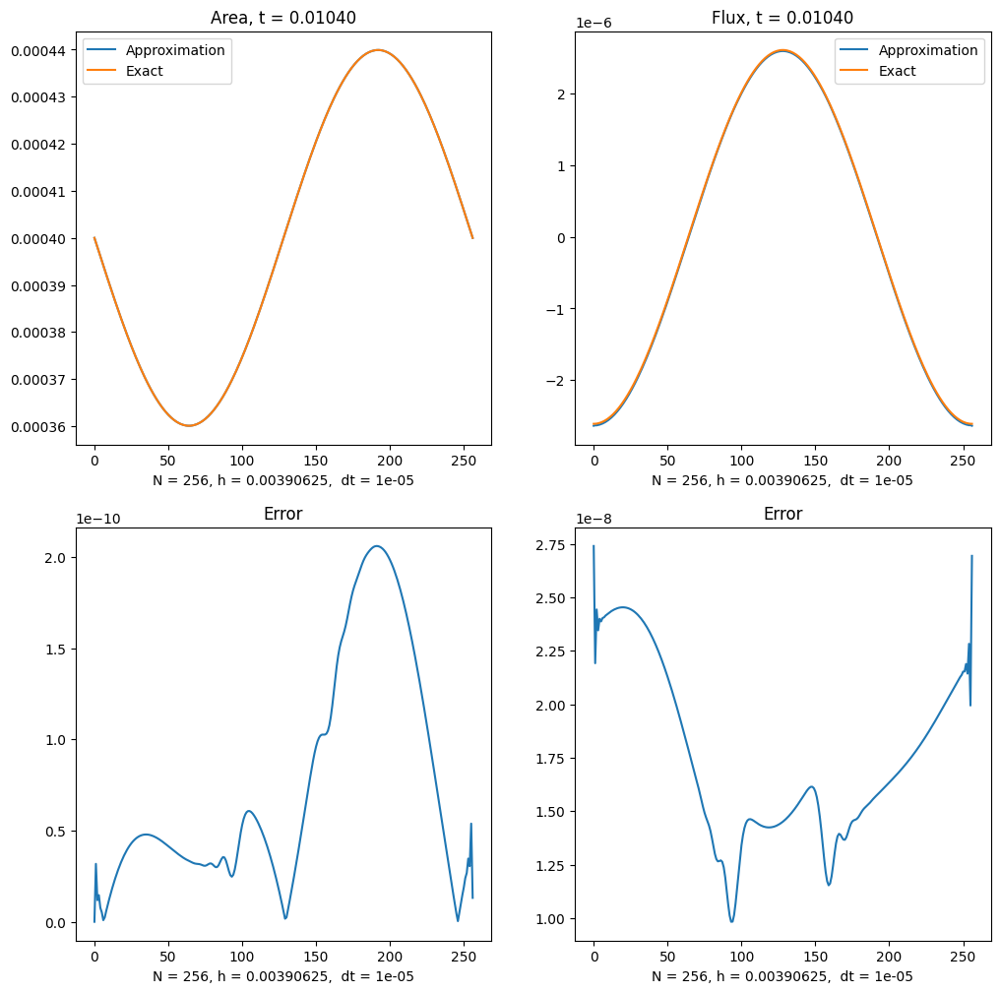

Interation 1040 / 100000
t = 0.0104: error = [1.62878007e-09 3.89797268e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



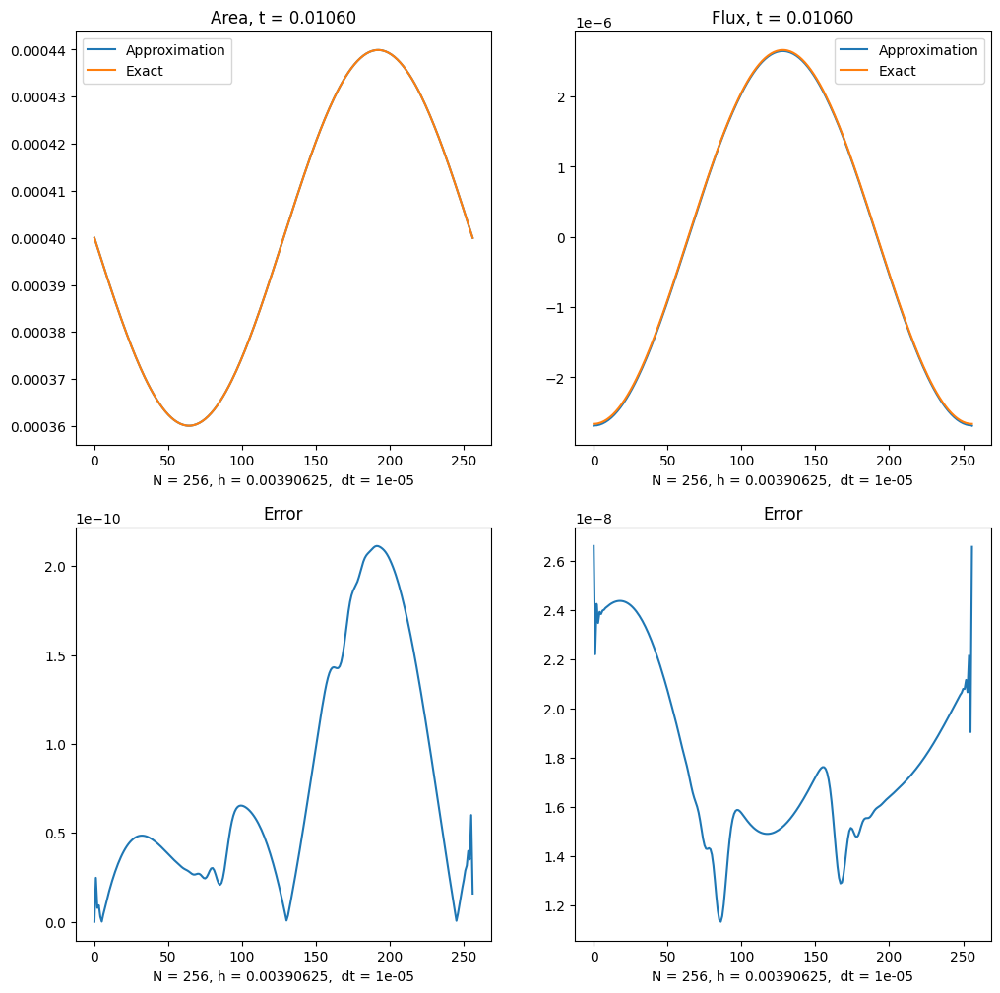

Interation 1060 / 100000
t = 0.0106: error = [1.63057344e-09 3.32106249e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



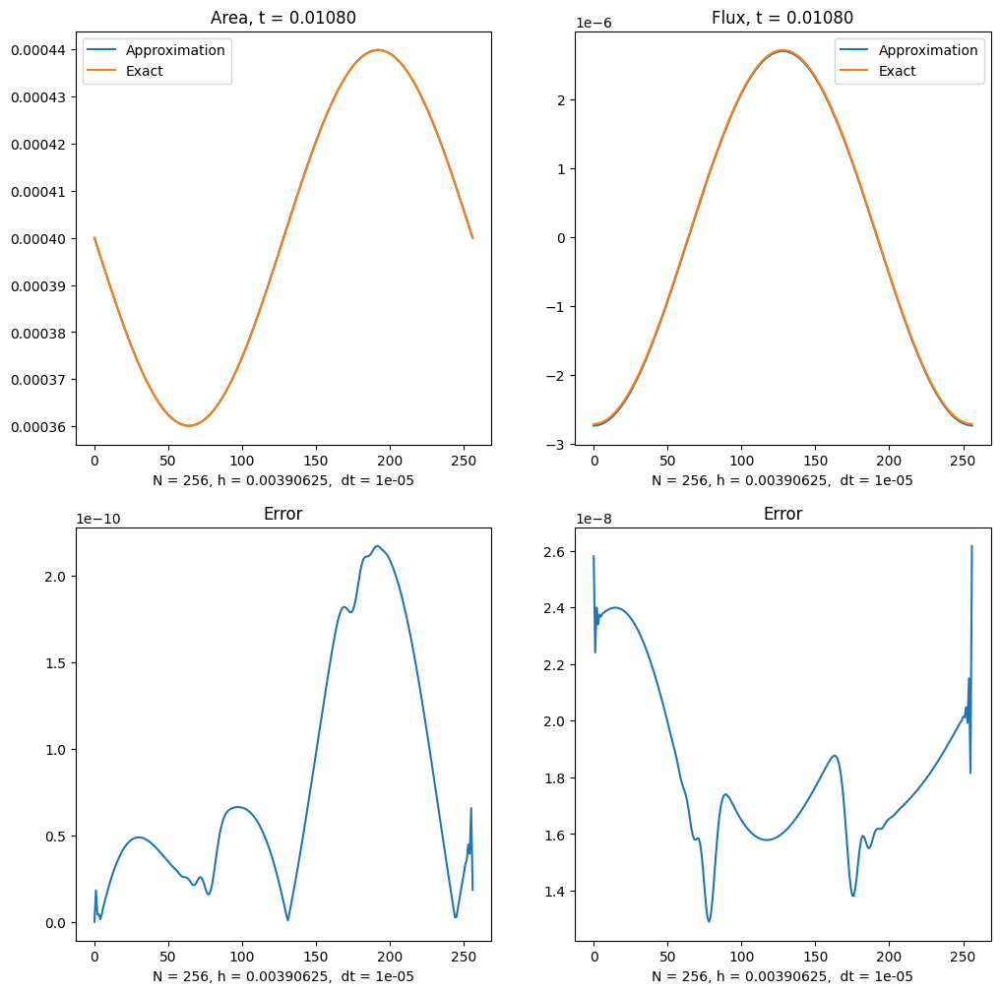

Interation 1080 / 100000
t = 0.0108: error = [1.63319672e-09 2.73104718e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



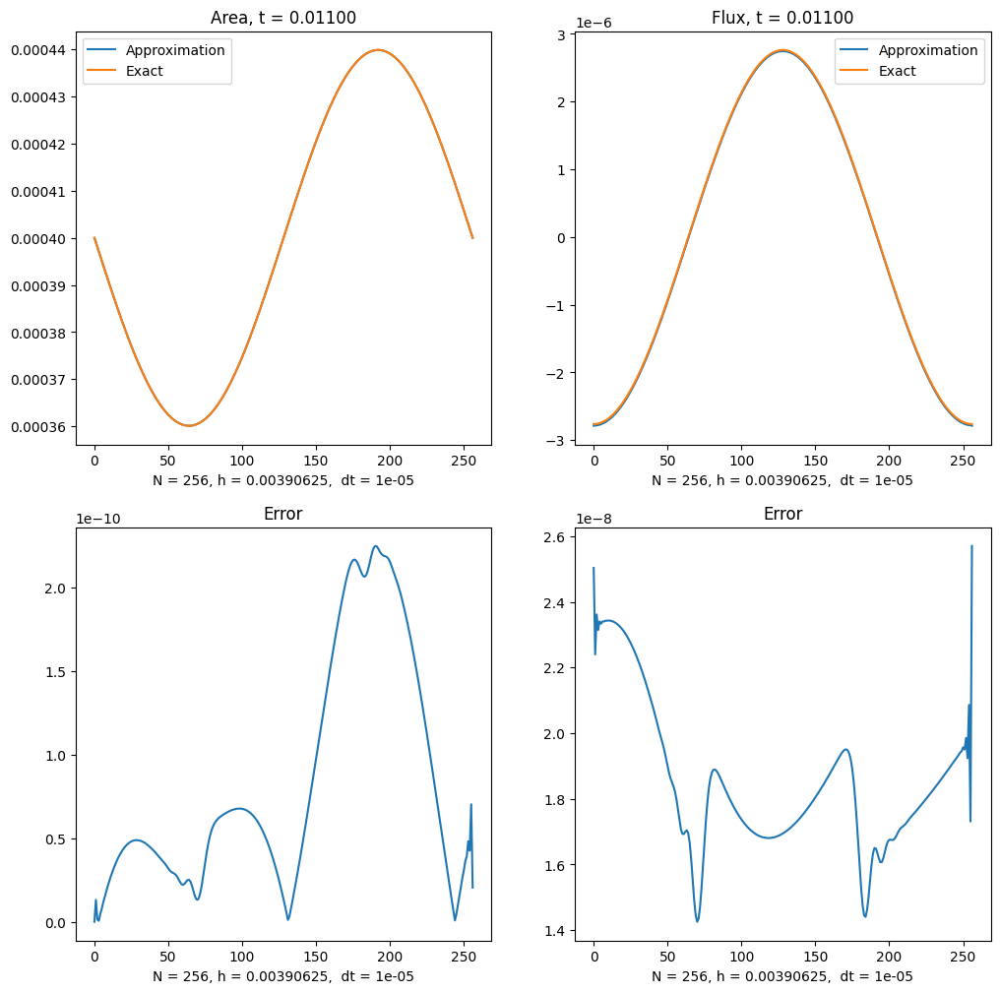

Interation 1100 / 100000
t = 0.0110: error = [1.63661514e-09 2.15293501e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



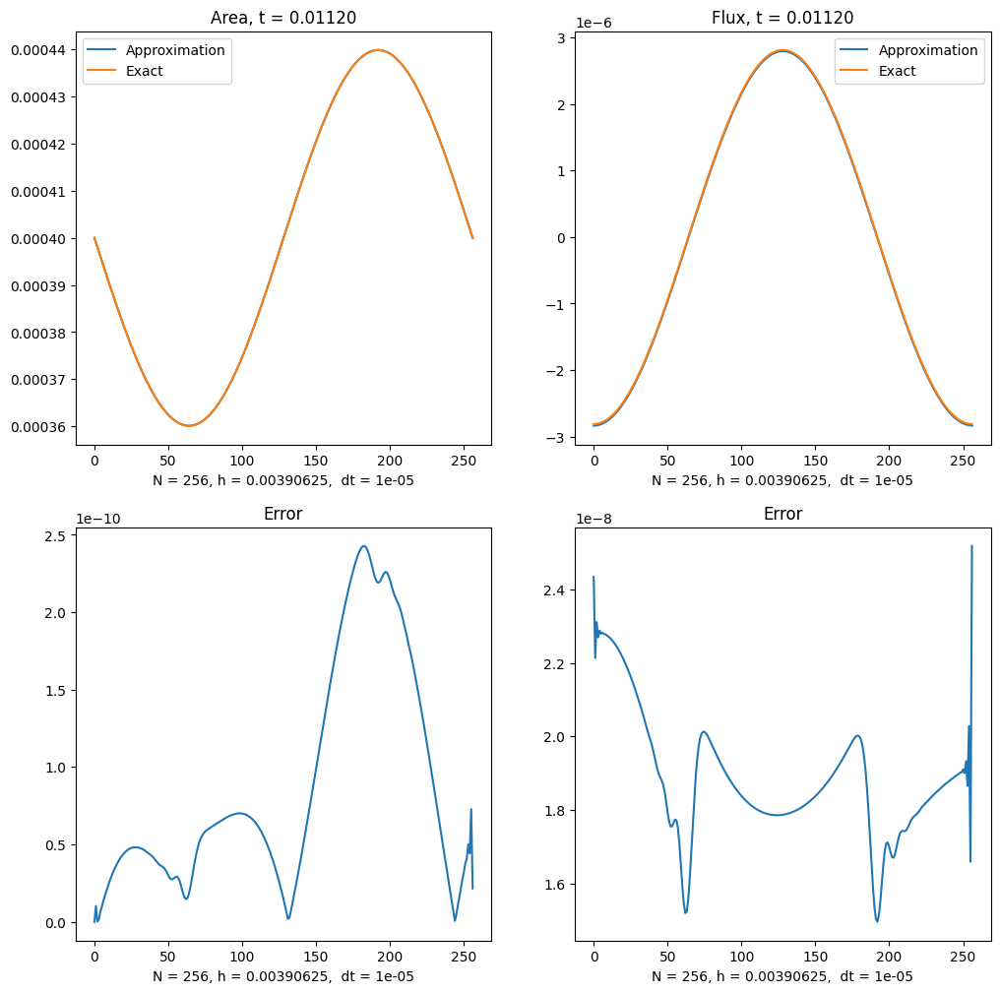

Interation 1120 / 100000
t = 0.0112: error = [1.64076643e-09 1.64365073e-09]
Global error A = 1.6442714218976256e-09, Global error q = 8.033892156818384e-09



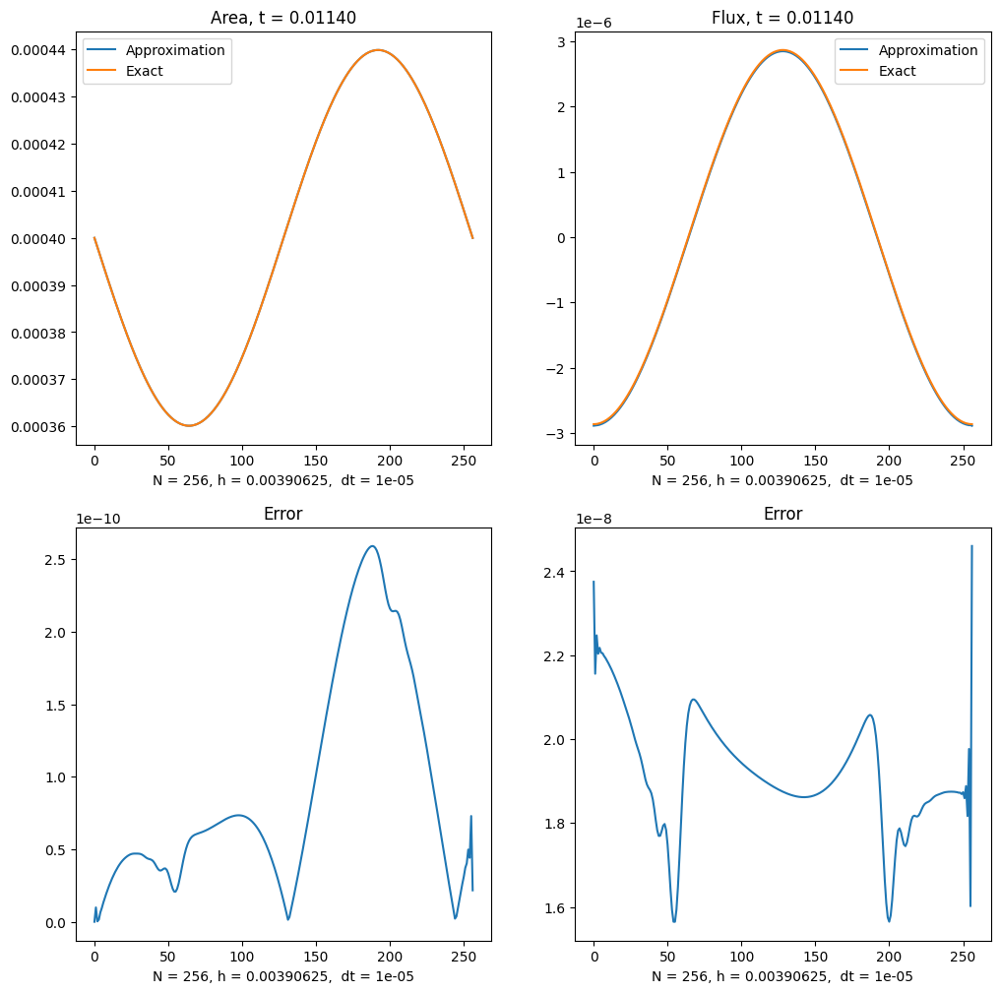

Interation 1140 / 100000
t = 0.0114: error = [1.64556526e-09 1.31685766e-09]
Global error A = 1.645565263449445e-09, Global error q = 8.033892156818384e-09



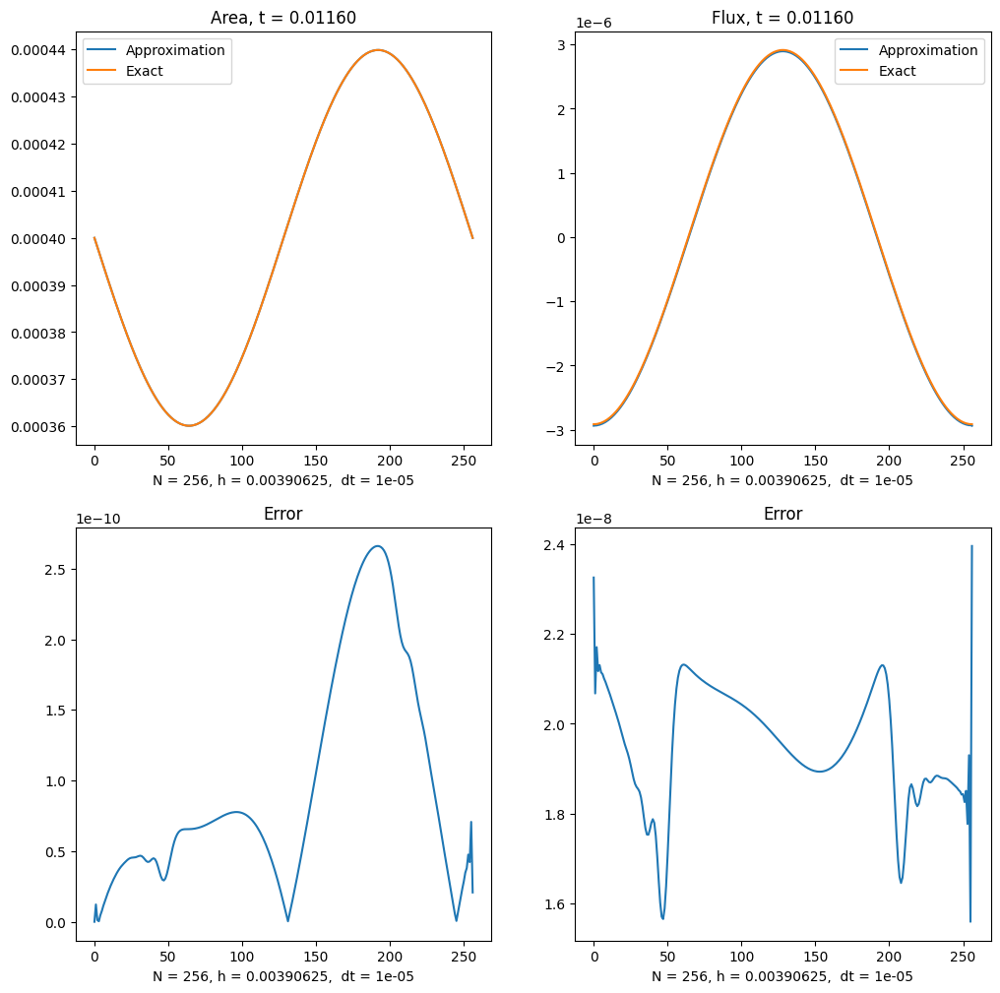

Interation 1160 / 100000
t = 0.0116: error = [1.65090781e-09 1.28833535e-09]
Global error A = 1.6509078079358688e-09, Global error q = 8.033892156818384e-09



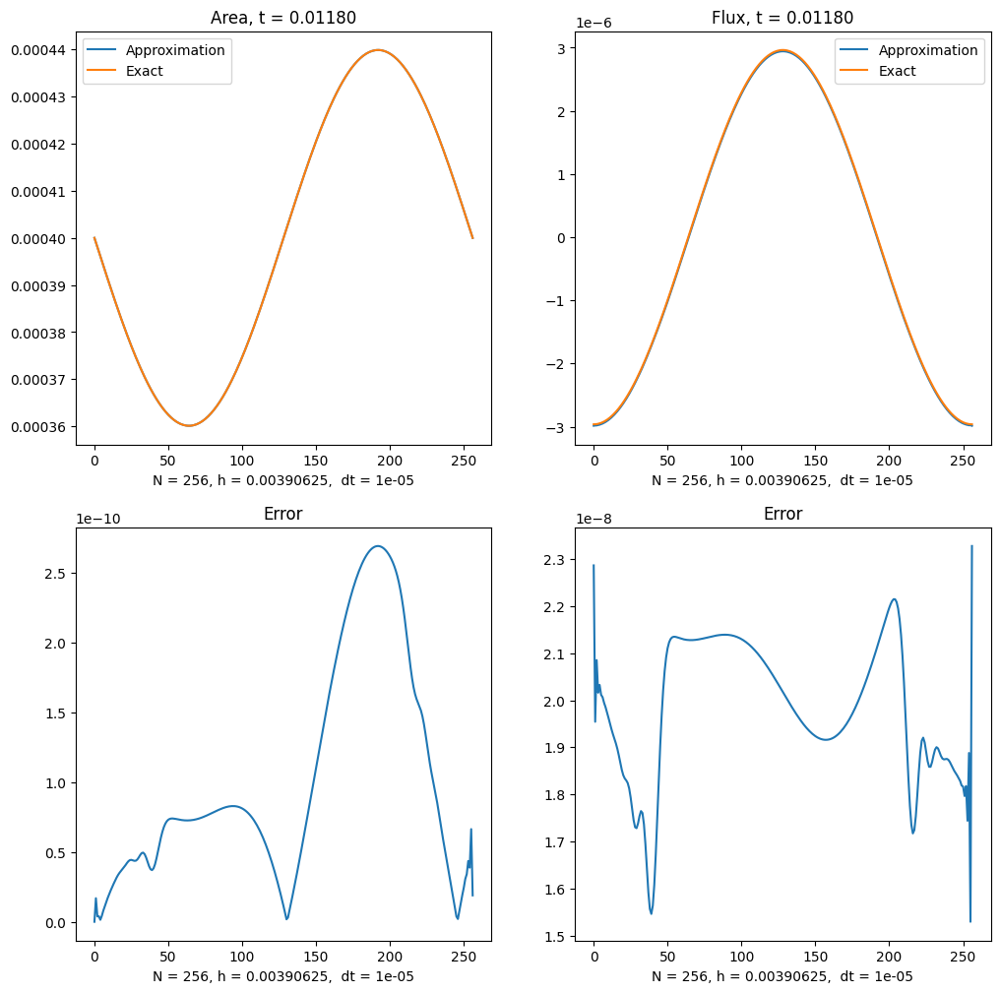

Interation 1180 / 100000
t = 0.0118: error = [1.65667551e-09 1.49078182e-09]
Global error A = 1.6566755131047864e-09, Global error q = 8.033892156818384e-09



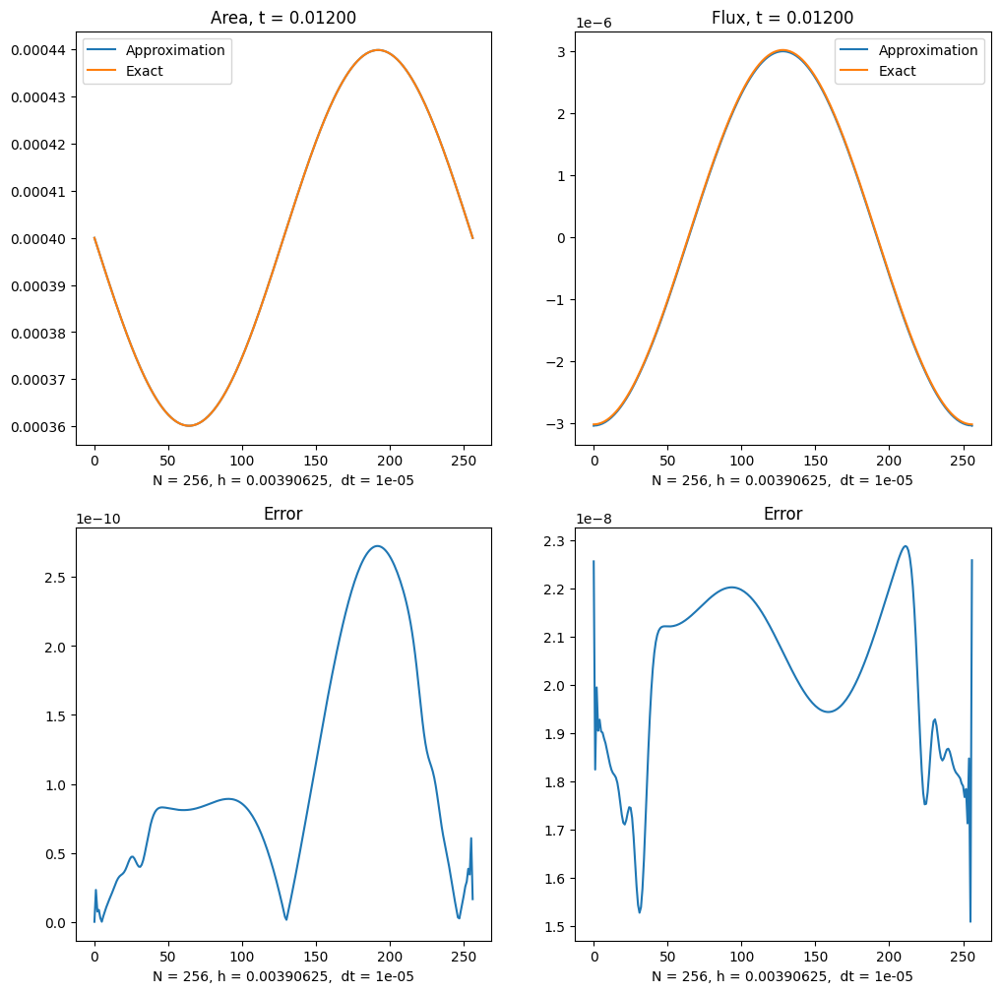

Interation 1200 / 100000
t = 0.0120: error = [1.66273795e-09 1.74118224e-09]
Global error A = 1.6627379547596104e-09, Global error q = 8.033892156818384e-09



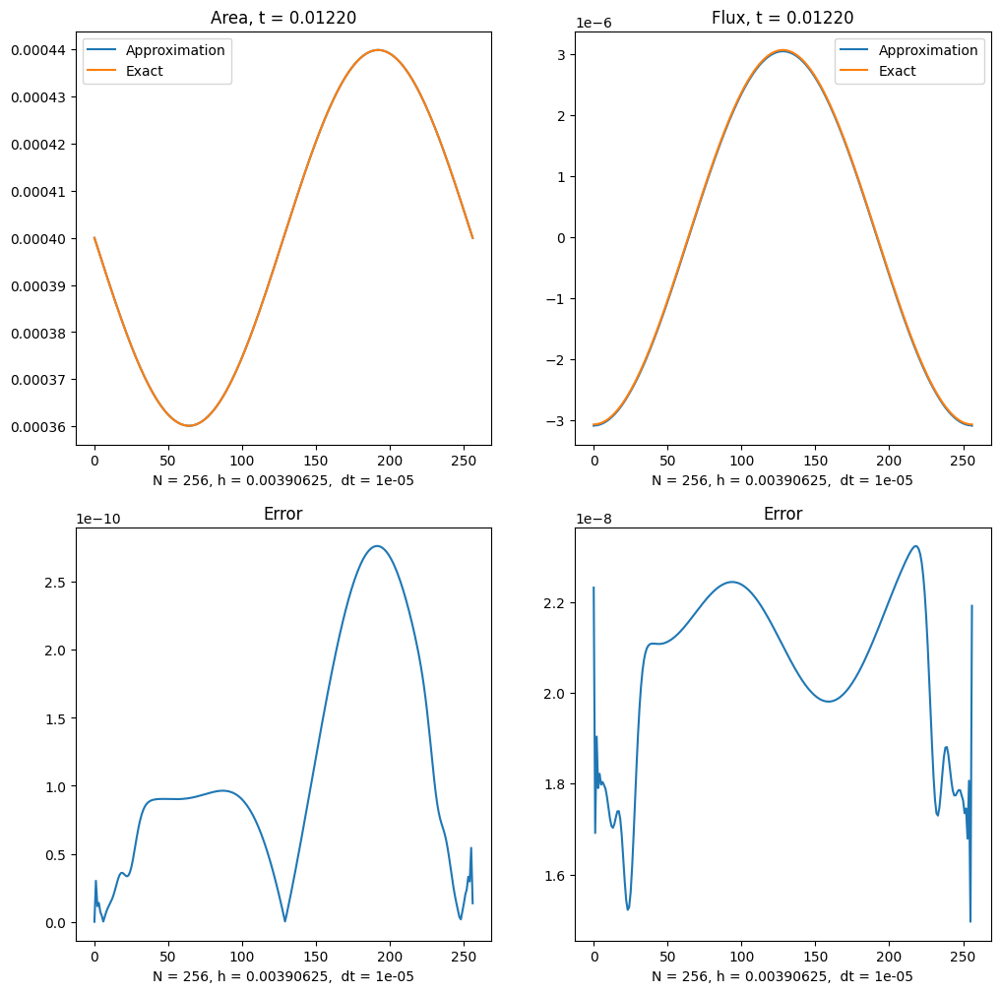

Interation 1220 / 100000
t = 0.0122: error = [1.66895552e-09 1.91488088e-09]
Global error A = 1.668955517980169e-09, Global error q = 8.033892156818384e-09



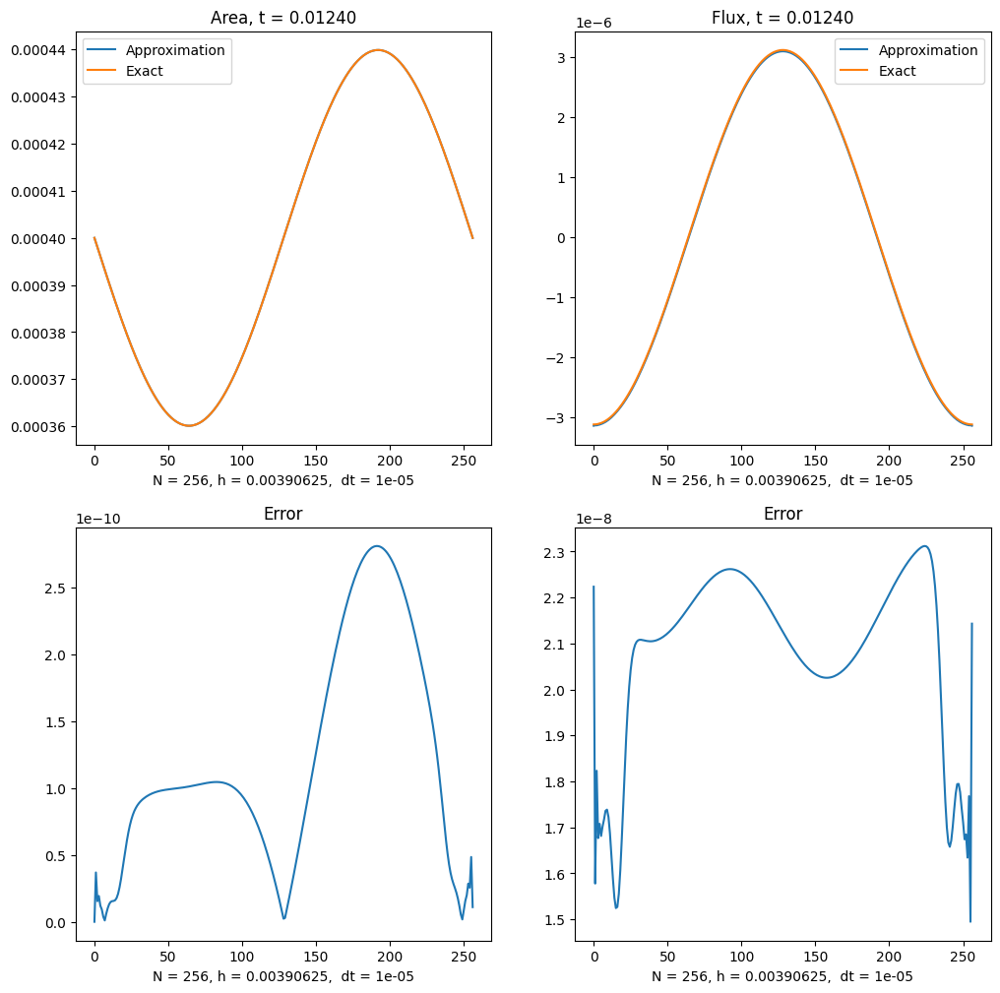

Interation 1240 / 100000
t = 0.0124: error = [1.67518264e-09 1.94383430e-09]
Global error A = 1.6751826372889947e-09, Global error q = 8.033892156818384e-09



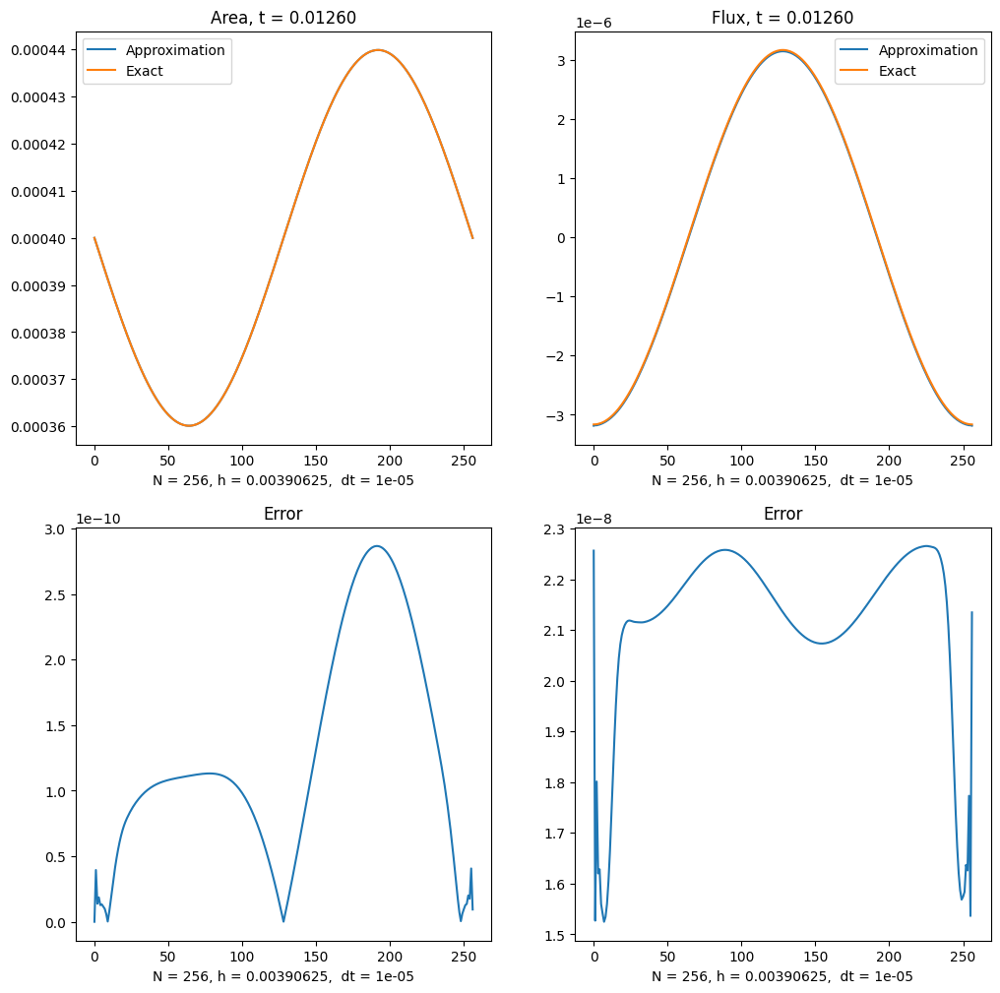

Interation 1260 / 100000
t = 0.0126: error = [1.68127085e-09 1.77499934e-09]
Global error A = 1.6812708468884691e-09, Global error q = 8.033892156818384e-09



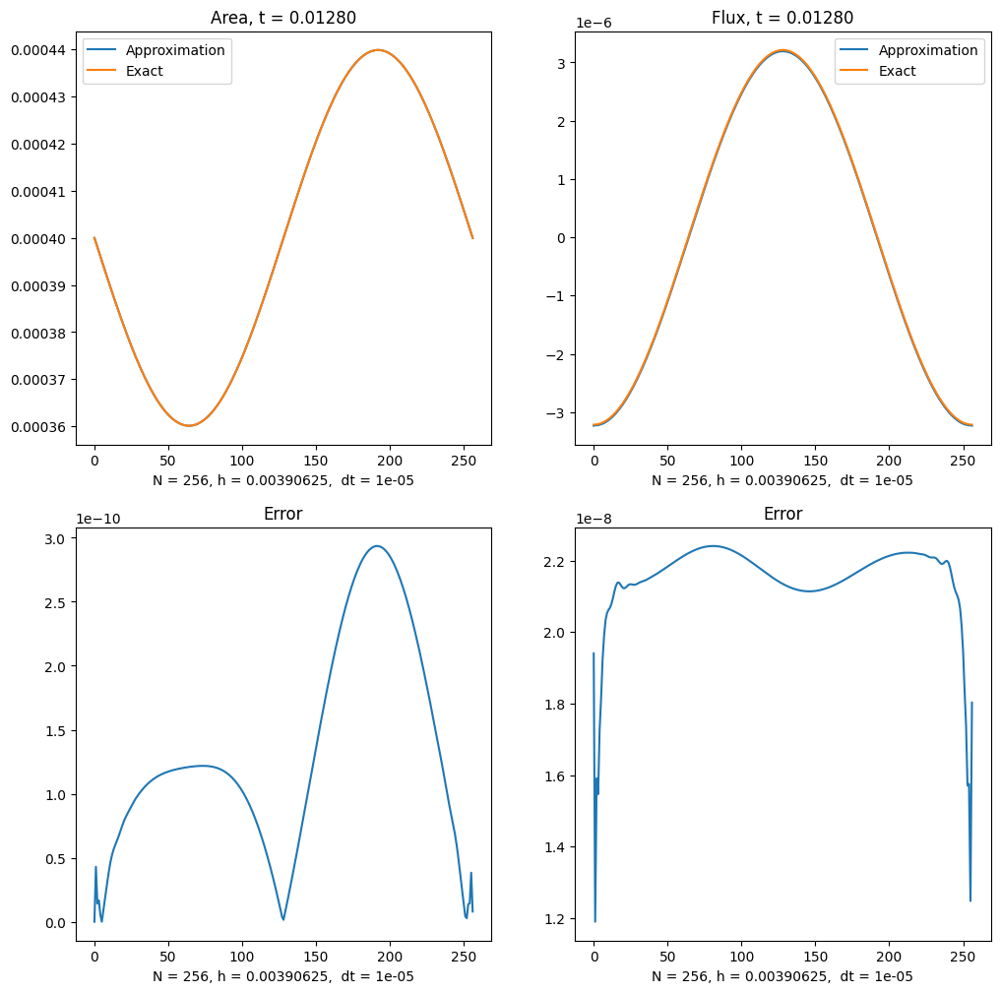

Interation 1280 / 100000
t = 0.0128: error = [1.68707222e-09 1.33202882e-09]
Global error A = 1.6870722157690361e-09, Global error q = 8.033892156818384e-09



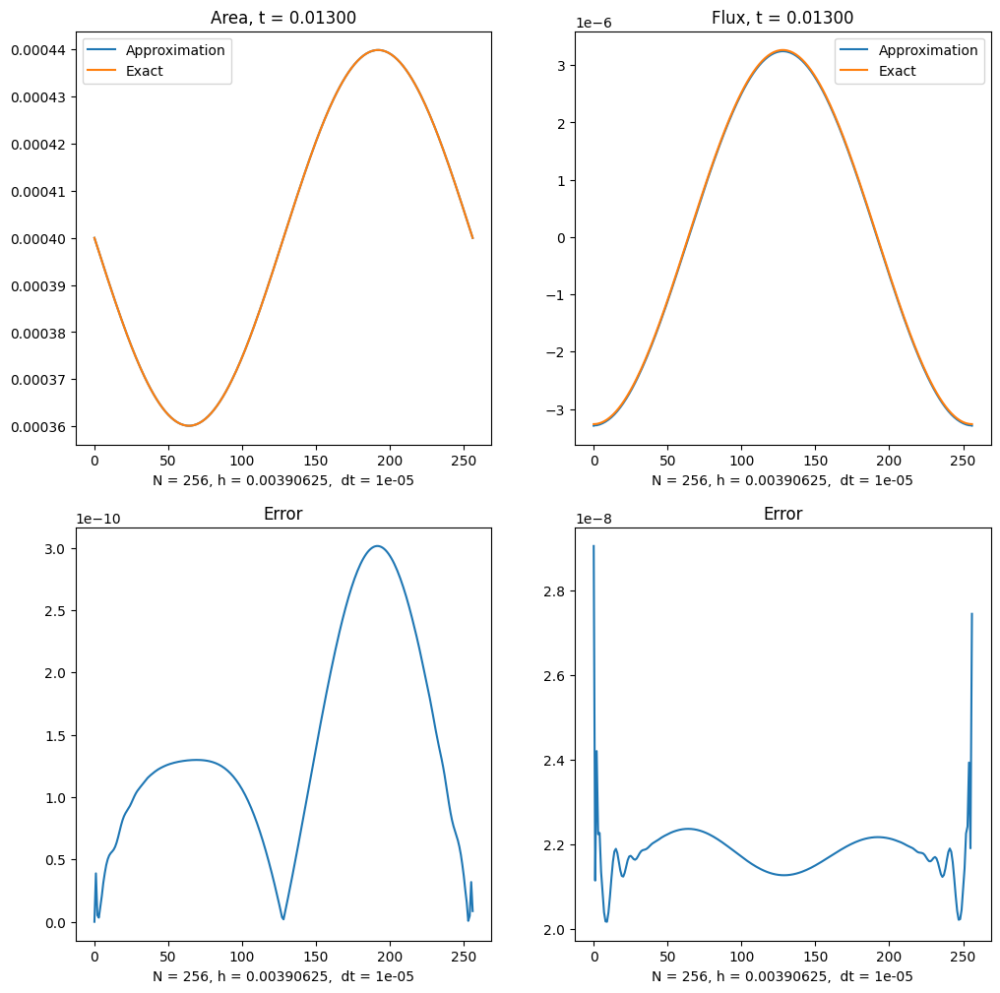

Interation 1300 / 100000
t = 0.0130: error = [1.69246899e-09 5.74937908e-10]
Global error A = 1.692468990095534e-09, Global error q = 8.033892156818384e-09



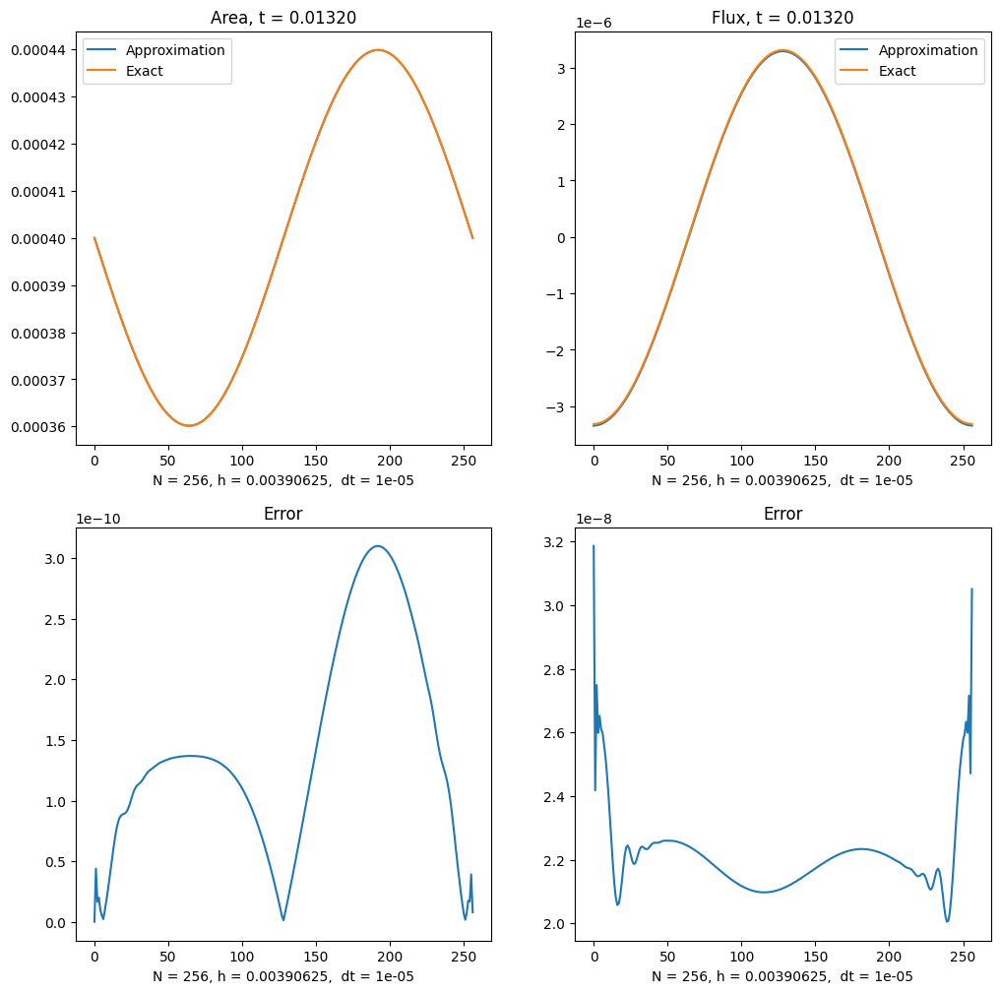

Interation 1320 / 100000
t = 0.0132: error = [1.69734049e-09 1.22806960e-09]
Global error A = 1.6973404870328547e-09, Global error q = 8.033892156818384e-09



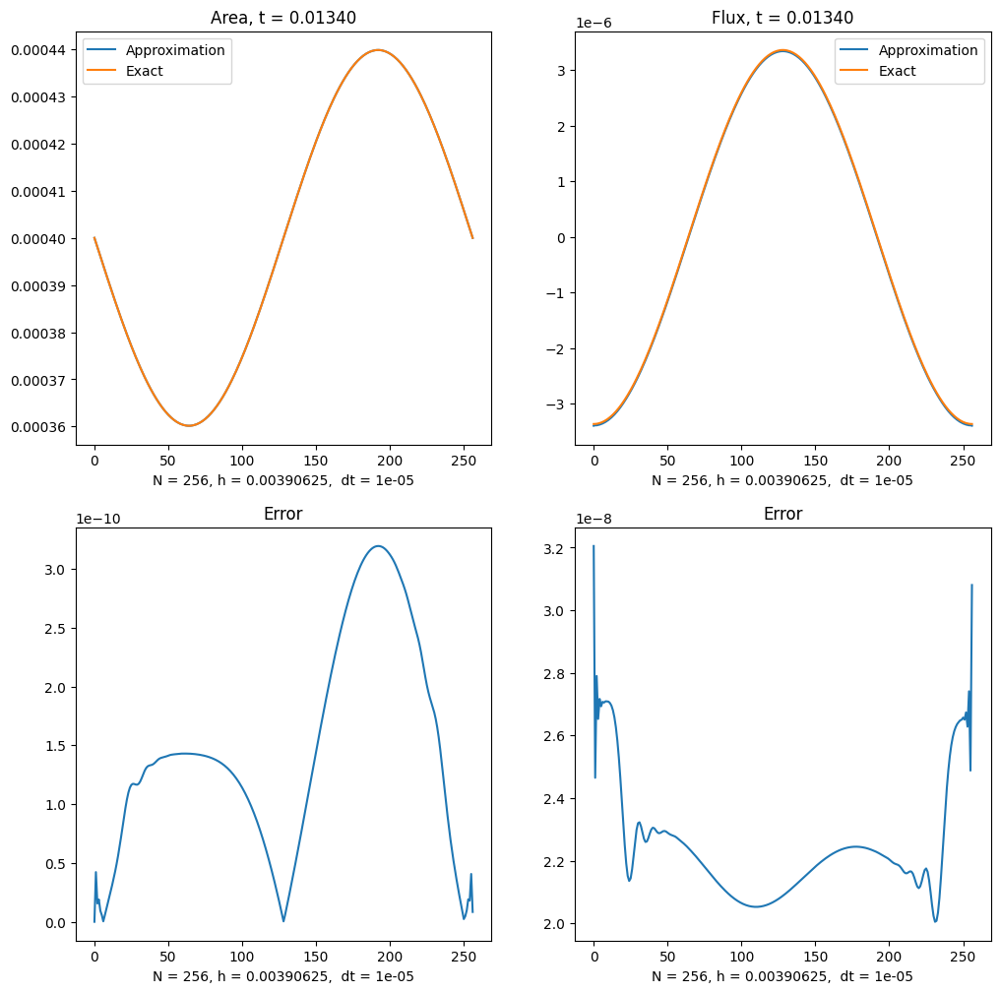

Interation 1340 / 100000
t = 0.0134: error = [1.70155933e-09 1.74180386e-09]
Global error A = 1.701559328794671e-09, Global error q = 8.033892156818384e-09



KeyboardInterrupt: 

In [58]:
# Time stepping
uh = Function(V)
q_zero_mean = Function(V.sub(1).collapse())
t = 0
i = 0

global_error_A = 0
global_error_q = 0

for n in range(round(num_steps)):

  i +=1

  # Update time step
  t = update_time_step(t, dt)
  f_n = project(f, V)
  df_dt_n = project(df_dt, V)

  # Solve the problem
  a, L = LinearProblem(Ah_old, qh_old)
  solve(a == L, uh, bc)
  Ah, qh = uh.split(deepcopy = True)

  A_ex = interpolate(A_exact, V_ex.sub(0).collapse())
  q_ex = interpolate(q_exact, V_ex.sub(1).collapse())
  q_zero_mean.assign(qh)
  q_zero_mean.vector()[:] -= assemble(qh*dx)/assemble(1*dx(domain=mesh))
  error = np.array([errornorm(Ah, A_ex, 'L2'), errornorm(q_zero_mean, q_ex, 'L2')])

  if error[0] > global_error_A:
    global_error_A = error[0]

  if error[1] > global_error_q:
    global_error_q = error[1]

  # Compute errors
  if (i % 20 == 0):
    plot_solution()
    print(f'Interation {i} / {round(num_steps)}')
    print(f't = %.4f: error = {error}' % (t))
    print(f'Global error A = {global_error_A}, Global error q = {global_error_q}')
    print()

  # Update previous solution
  Ah_old.assign(Ah)
  qh_old.assign(qh)

  q_outlet = outlet_bc(Ah_old, qh_old, uh.dx(0), x_right)
  A_inlet, q_inlet = inlet_bc(Ah_old, qh_old, uh.dx(0), x_left)
  bc = update_bc(A_inlet, q_inlet, A_outlet, q_outlet)

print(f'N = {N}, h = {h}, dt = {dt} : Global error A = {global_error_A}, Global error q = {global_error_q}')

In [ ]:
error_A.append(global_error_A)
error_q.append(global_error_q)
error_A, error_q

# Space convergence

In [ ]:
h_vec = [1 / (2 ** i) for i in range(5, 9)]
dt = 1e-5
num_steps = T / dt

error_A = []
error_q = []

for h in h_vec:
  print(f'h = {h}, dt = {dt}')
  print()

  N = int((x_right - x_left) / h)

  mesh = IntervalMesh(N, x_left, x_right)
  x = MeshCoordinates(mesh)

  V = FunctionSpace(mesh, element)
  V_der = FunctionSpace(mesh, element_der)
  V_ex = FunctionSpace(mesh, element_exact)

  f_n = project(f, V)
  df_dt_n = project(df_dt, V)

  uh_old = interpolate(Expression(('A_tilde + a_tilde * sin(2 * pi / L * x[0])', 'q0'), degree = 2, A_tilde = A_tilde, a_tilde = a_tilde, L = L, q0 = q0), V)
  Ah_old, qh_old = uh_old.split()

  bc_A_inlet = DirichletBC(V.sub(0), A_inlet, inlet)
  bc_q_inlet = DirichletBC(V.sub(1), q_inlet, inlet)
  bc_A_outlet = DirichletBC(V.sub(0), A_outlet, outlet)
  bc_q_outlet = DirichletBC(V.sub(1), q_outlet, outlet)

  bc = [bc_A_inlet, bc_q_inlet, bc_A_outlet, bc_q_outlet]

  A, q = TrialFunctions(V)
  v, z = TestFunctions(V)

  uh = Function(V)
  t = 0
  i = 0

  global_error_A = 0
  global_error_q = 0

  for n in range(round(num_steps)):

    i +=1

    # Update time step
    t = update_time_step(t, dt)
    f_n = project(f, V)
    df_dt_n = project(df_dt, V)

    # Solve the problem
    a, L = LinearProblem(Ah_old, qh_old)
    solve(a == L, uh, bc)
    Ah, qh = uh.split(deepcopy = True)

    A_e = interpolate(A_exact, V_ex.sub(0).collapse())
    q_ex = interpolate(q_exact, V_ex.sub(1).collapse())
    q_zero_mean.assign(qh)
    q_zero_mean.vector()[:] -= assemble(qh*dx)/assemble(1*dx(domain=mesh))
    error = np.array([errornorm(Ah, A_ex, 'L2'), errornorm(q_zero_mean, q_ex, 'L2')])

    if error[0] > global_error_A:
      global_error_A = error[0]

    if error[1] > global_error_q:
      global_error_q = error[1]

    # Compute errors
    if (i % 1000 == 0):
      print(f'Interation {i} / {round(num_steps)}')
      print(f't = %.4f: error = {error}' % (t))
      print(f'Global error A = {global_error_A}, Global error q = {global_error_q}')
      print()

    if (i % 10000 == 0):
      plot_solution()

    # Update previous solution
    Ah_old.assign(Ah)
    qh_old.assign(qh)

    q_inlet = inlet_bc(Ah_old, qh_old, uh.dx(0))
    A_outlet, q_outlet = outlet_bc(Ah_old, qh_old, uh.dx(0))
    bc = update_bc(A_inlet, q_inlet, A_outlet, q_outlet)

  print(f'N = {N}, h = {h}, dt = {dt} : Global error A = {global_error_A}, Global error q = {global_error_q}')
  error_A.append(global_error_A)
  error_q.append(global_error_q)

In [ ]:
h_vec = np.array([1/32, 1 /64, 1/128, 1/256])

fig, ax = plt.subplots(2, 2, figsize=(12, 12))
ax = ax.flatten()

# Plot for Area
ax[0].plot(error_A)
ax[0].set_title('Area')
ax[0].set_xlabel(f'h = {h_vec},  dt = {dt}')
ax[0].set_ylabel('Error')

ax[2].loglog(h_vec / h_vec[0], error_A / error_A[0], label = 'L^2 Error')
ax[2].loglog(h_vec / h_vec[0], h_vec / h_vec[0], linestyle = '--', label = 'h')
ax[2].loglog(h_vec / h_vec[0], (h_vec / h_vec[0])**2, linestyle = '--', label ='h^2')
ax[2].set_xlabel('h')
ax[2].set_ylabel('Error')
ax[2].set_title('Area')
ax[2].legend()

# Plot for Flux
ax[1].plot(error_q)
ax[1].set_title('Flux')
ax[1].set_xlabel(f'h = {h_vec},  dt = {dt}')
ax[1].set_ylabel('Error')

ax[3].loglog(h_vec / h_vec[0], error_q / error_q[0], label = 'L^2 Error')
ax[3].loglog(h_vec / h_vec[0], h_vec / h_vec[0], linestyle = '--', label = 'h')
ax[3].loglog(h_vec / h_vec[0], (h_vec / h_vec[0])**2, linestyle = '--', label = 'h^2')
ax[3].set_xlabel('h')
ax[3].set_ylabel('Error')
ax[3].set_title('Flux')
ax[3].legend()

# Time convergence

In [ ]:
# Time stepping
h = 1 / 32
dt_vec = 1e-4 * np.array([1, 1/2, 1/4, 1/8])
error_A = []
error_q = []

for dt in dt_vec:
  print(f'dt = {dt}')
  print()

  uh = Function(V)
  t = 0
  i = 0

  global_error_A = 0
  global_error_q = 0

  num_steps = T / dt

  for n in range(round(num_steps)):

    i +=1

    # Update time step
    t = update_time_step(t, dt)
    f_n = project(f, V)
    df_dt_n = project(df_dt, V)

    # Solve the problem
    a, L = LinearProblem(Ah_old, qh_old)
    solve(a == L, uh, bc)
    Ah, qh = uh.split(deepcopy = True)

    A_ex = interpolate(A_exact, V_ex.sub(0).collapse())
    q_ex = interpolate(q_exact, V_ex.sub(1).collapse())
    q_zero_mean.assign(qh)
    q_zero_mean.vector()[:] -= assemble(qh*dx)/assemble(1*dx(domain=mesh))
    error = np.array([errornorm(Ah, A_ex, 'L2'), errornorm(q_zero_mean, q_ex, 'L2')])

    if error[0] > global_error_A:
      global_error_A = error[0]

    if error[1] > global_error_q:
      global_error_q = error[1]

    # Compute errors
    if (i % 1000 == 0):
      print(f'Interation {i} / {round(num_steps)}')
      print(f't = %.4f: error = {error}' % (t))
      print(f'Global error A = {global_error_A}, Global error q = {global_error_q}')
      print()

    if (i % 10000 == 0):
      plot_solution()

    # Update previous solution
    Ah_old.assign(Ah)
    qh_old.assign(qh)

    q_inlet = inlet_bc(Ah_old, qh_old, uh.dx(0))
    A_outlet, q_outlet = outlet_bc(Ah_old, qh_old, uh.dx(0))
    bc = update_bc(A_inlet, q_inlet, A_outlet, q_outlet)

  error_A.append(global_error_A)
  error_q.append(global_error_q)

In [ ]:
dt_vec = 1e-4 * np.array([1, 1/2, 1/4, 1/8])
fig, ax = plt.subplots(2, 2, figsize=(12, 12))
ax = ax.flatten()

# Plot for Area
ax[0].plot(error_A)
ax[0].set_title('Area')
ax[0].set_xlabel(f'h = {h},  dt = {dt_vec}')
ax[0].set_ylabel('Error')

ax[2].loglog(dt_vec / dt_vec[0], error_A / error_A[0], label = 'L^2 Error')
ax[2].loglog(dt_vec / dt_vec[0], dt_vec / dt_vec[0], linestyle = '--', label = 'dt')
ax[2].loglog(dt_vec / dt_vec[0], (dt_vec / dt_vec[0])**2, linestyle = '--', label ='dt^2')
ax[2].set_xlabel('dt')
ax[2].set_ylabel('Error')
ax[2].set_title('Area')
ax[2].legend()

# Plot for Flux
ax[1].plot(error_q)
ax[1].set_title('Flux')
ax[1].set_xlabel(f'h = {h},  dt = {dt_vec}')
ax[1].set_ylabel('Error')

ax[3].loglog(dt_vec / dt_vec[0], error_q / error_q[0], label = 'L^2 Error')
ax[3].loglog(dt_vec / dt_vec[0], dt_vec / dt_vec[0], linestyle = '--', label = 'dt')
ax[3].loglog(dt_vec / dt_vec[0], (dt_vec / dt_vec[0])**2, linestyle = '--', label = 'dt^2')
ax[3].set_xlabel('dt')
ax[3].set_ylabel('Error')
ax[3].set_title('Flux')
ax[3].legend()